# Notebook para organização do código do projeto de pesquisa da dissertação de Mestrado Profissional em Empreendedorismo de Marcus Trugilho.

## Nome do trabalho: Utilização de *Machine Learning* para previsão de potencial de sucesso de *Startups* Brasileiras.

### Importação das bibliotecas que serão usadas nos trabalhos.

In [9]:
# Importações gerais
import os
import time
import glob
import joblib
import numpy as np
import pandas as pd
from collections import Counter
from datetime import datetime
from tqdm import tqdm  # Importar tqdm para a barra de progresso

# Configurações do pandas
pd.set_option('display.max_columns', None)  # Exibe todas as colunas
pd.set_option('display.float_format', '{:.2f}'.format)  # Exibe números no formato completo

# Visualização
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import ipywidgets as widgets
from IPython.display import display
from sklearn.tree import plot_tree
from sklearn.metrics import ConfusionMatrixDisplay, RocCurveDisplay
from tabulate import tabulate

# Pré-processamento e pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_predict, cross_val_score, StratifiedKFold

# Modelos de Machine Learning
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, VotingClassifier
from xgboost import XGBClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis

# Métricas
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix, f1_score, accuracy_score, recall_score, precision_score, RocCurveDisplay, classification_report
from sklearn.calibration import calibration_curve

# Oversampling
from imblearn.over_sampling import ADASYN

# Estatísticas
from scipy.stats import chisquare, chi2_contingency, pointbiserialr

# Processamento de texto
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

# Fuzzy Matching
from fuzzywuzzy import process

# Limpeza de dados
import janitor

# Ignorar avisos
import warnings
warnings.filterwarnings("ignore")


## Construção do *dataset* base a partir das informações extraídas do *Crunchbase*.

In [11]:
data = pd.concat(map(pd.read_csv, glob.glob('Base2/*.csv')))
data = janitor.clean_names(data)
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 27018 entries, 0 to 996
Data columns (total 54 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   organization_name                     27018 non-null  object 
 1   organization_name_url                 27018 non-null  object 
 2   total_funding_amount                  2251 non-null   float64
 3   total_funding_amount_currency         3226 non-null   object 
 4   total_funding_amount_in_usd_          2251 non-null   float64
 5   number_of_employees                   25168 non-null  object 
 6   full_description                      15162 non-null  object 
 7   ipo_status                            27018 non-null  object 
 8   operating_status                      27018 non-null  object 
 9   last_funding_type                     3226 non-null   object 
 10  industries                            26495 non-null  object 
 11  headquarters_location 

In [12]:
# Selecionar apenas as empresas privadas, pois as públicas não serão objeto deste estudo.

df_base = data.loc[data['ipo_status']=='Private']

In [13]:
# Excluir variáveis que não serão utilizadas.

df_base = df_base.drop(axis=1, columns=['valuation_at_ipo',
                                    'valuation_at_ipo_currency',
                                    'valuation_at_ipo_in_usd_',
                                    'ipo_date',
                                    'ipo_status',
                                    'date_of_most_recent_valuation',
                                    'most_recent_valuation_range',
                                    'number_of_founders_alumni_',
                                    'founded_date_precision',
                                    'exit_date_precision',
                                    'closed_date_precision',
                                    'school_type',
                                    'total_funding_amount',
                                    'total_funding_amount_currency',
                                    'last_funding_amount',
                                    'last_funding_amount_currency',
                                    'total_equity_funding_amount',
                                    'total_equity_funding_amount_currency',
                                    'company_type',
                                    'headquarters_regions',
                                    'exit_date',
                                    'closed_date'
                                            ])

In [14]:
# Traduzir as colunas do dataframe para o português

cols_pt = ['nome_empresa',
            'url_empresa_crunchbase',
            'captacao_total_usd',
            'faixa_funcionarios',
            'descricao_completa',
            'status_operacional',
            'tipo_ultimo_investimento',
            'industrias',
            'localizacao',
            'rank_empresa_crunchbase',
            'data_fundacao',
            'numero_rodadas_captacao',
            'status_captacao',
            'data_ultima_captacao',
            'captacao_ultima_rodada_usd',
            'captacao_total_equity_usd',
            'faixa_estimada_receita',
            'descricao',
            'estagio_investimento',
            'numero_empresas_similares',
            'top_5_investidores',
            'grupos_industrias',
            'numero_fundadores',
            'fundadores',
            'numero_investidores',
            'numero_investidores_lideres',
            'status_aquisicao',
            'visitas_mensais_site',
            'media_visitas_6meses_site',
            'total_produtos_ativos',
            'patentes_concedidas',
            'marcas_registradas'
          ]

df_base.columns = cols_pt

In [15]:
# Corrigir valores para numéricos e criar colunas de ano de fundação e ano da ultima rodada de captação

df_base['rank_empresa_crunchbase'] = df_base['rank_empresa_crunchbase'].str.replace(',', '')
df_base['rank_empresa_crunchbase'] = df_base['rank_empresa_crunchbase'].astype(int)

df_base['visitas_mensais_site'] = df_base['visitas_mensais_site'].str.replace(',', '')
df_base['visitas_mensais_site'] = df_base['visitas_mensais_site'].astype(float)

df_base['media_visitas_6meses_site'] = df_base['media_visitas_6meses_site'].str.replace(',', '')
df_base['media_visitas_6meses_site'] = df_base['media_visitas_6meses_site'].astype(float)

# Transformar as colunas de data em formato data (Datetime) e criar novas colunas apenas com o ano, pois pode ser relevante para o modelo.

df_base['data_fundacao'] = pd.to_datetime(df_base['data_fundacao'])
df_base['ano_fundacao'] = df_base['data_fundacao'].dt.year

df_base['data_ultima_captacao'] = pd.to_datetime(df_base['data_ultima_captacao'])
df_base['ano_ultima_captacao'] = df_base['data_ultima_captacao'].dt.year

In [16]:
# Criar uma coluna para identificar se a empresa tem uma descrição completa
df_base['tem_descricao_completa'] = np.where(df_base['descricao_completa'].isna(), '0', '1')
df_base['tem_descricao_completa'] = df_base['tem_descricao_completa'].astype(int)

# Criar uma coluna para identificar se a empresa já teve algum valor captado
df_base['tem_valor_captacao'] = np.where(df_base['captacao_total_usd'].isna(), '0', '1')
df_base['tem_valor_captacao'] = df_base['tem_valor_captacao'].astype(int)

# Criar uma coluna para identificar se a empresa já recebeu algum investimento
df_base['ja_teve_investimento'] = np.where(df_base['tipo_ultimo_investimento'].isna(), '0', '1')
df_base['ja_teve_investimento'] = df_base['ja_teve_investimento'].astype(int)

# Criar uma coluna para identificar se a empresa tem informações sobre o último valor captado
df_base['tem_valor_captacao_ultima_rodada'] = np.where(df_base['captacao_ultima_rodada_usd'].isna(), '0', '1')
df_base['tem_valor_captacao_ultima_rodada'] = df_base['tem_valor_captacao_ultima_rodada'].astype(int)

# Criar uma coluna para identificar se a empresa tem informações sobre o total captado em equities
df_base['tem_valor_captacao_total_equity'] = np.where(df_base['captacao_total_equity_usd'].isna(), '0', '1')
df_base['tem_valor_captacao_total_equity'] = df_base['tem_valor_captacao_total_equity'].astype(int)

# Criar uma coluna para identificar se a empresa tem receita informada
df_base['tem_receita_informada'] = np.where(df_base['faixa_estimada_receita'].isna(), '0', '1')
df_base['tem_receita_informada'] = df_base['tem_receita_informada'].astype(int)

# Criar uma coluna para identificar se a empresa tem dados de visitação do site
df_base['tem_infos_site'] = np.where(df_base['visitas_mensais_site'].isna(), '0', '1')
df_base['tem_infos_site'] = df_base['tem_infos_site'].astype(int)

# Criar uma coluna para identificar se a empresa tem informações de visitação do site há mais de 6 meses
df_base['tem_site_mais_6_meses'] = np.where(df_base['media_visitas_6meses_site'].isna(), '0', '1')
df_base['tem_site_mais_6_meses'] = df_base['tem_site_mais_6_meses'].astype(int)

# Criar uma coluna para identificar quanto tempo de existência a empresa tem
df_base['tempo_existencia'] = datetime.now().year - df_base['ano_fundacao']
df_base['tempo_existencia'] = df_base['tempo_existencia'].astype(int)

In [17]:
df_source = df_base.copy()

### Trabalhar os dados para a modelagem.

In [19]:
# Preencher os valores nulos de diversas colunas com a palavra "Desconhecido".

def fill_na_with_desconhecido(df, columns):
    df[columns] = df[columns].fillna("Desconhecido")
    return df

# Preencher com "Desconhecido" usando a função
columns_to_fill = [
    'descricao_completa',
    'tipo_ultimo_investimento',
    'status_captacao',
    'estagio_investimento',
    'status_aquisicao',
    'descricao',
    'top_5_investidores',
    'industrias',
    'grupos_industrias'
]

df_source = fill_na_with_desconhecido(df_source, columns_to_fill)

In [20]:
# criar uma coluna para indicar o número de indústrias que a startup se entende incluída, com base nas diferentes indústrias cadastradas.
df_source['numero_industrias'] = df_source['industrias'].apply(lambda x: len(x.split(',')))
df_source['numero_grupo_industrias'] = df_source['grupos_industrias'].apply(lambda x: len(x.split(',')))

In [21]:
# Separar a coluna industrias em colunas isoladas pelo separador ','.

split_columns = df_source['industrias'].str.split(', ', expand=True)

num_new_columns = split_columns.shape[1]
new_column_names = [f'industria__{i+1}' for i in range(num_new_columns)]
split_columns.columns = new_column_names

df_source = pd.concat([df_source, split_columns], axis=1)

In [22]:
# Separar a coluna grupos_industrias em colunas isoladas pelo separador ','.

split_columns = df_source['grupos_industrias'].str.split(', ', expand=True)

num_new_columns = split_columns.shape[1]
new_column_names = [f'grupo_industria__{i+1}' for i in range(num_new_columns)]
split_columns.columns = new_column_names

df_source = pd.concat([df_source, split_columns], axis=1)

In [23]:
# Separar a coluna fundadores em colunas isoladas pelo separador ','.

split_columns = df_source['fundadores'].str.split(', ', expand=True)

num_new_columns = split_columns.shape[1]
new_column_names = [f'fundador__{i+1}' for i in range(num_new_columns)]
split_columns.columns = new_column_names

df_source = pd.concat([df_source, split_columns], axis=1)

In [24]:
# Separar a coluna top_5_investidores em colunas isoladas pelo separador ','.

split_columns = df_source['top_5_investidores'].str.split(', ', expand=True)

num_new_columns = split_columns.shape[1]
new_column_names = [f'investidor__{i+1}' for i in range(num_new_columns)]
split_columns.columns = new_column_names

df_source = pd.concat([df_source, split_columns], axis=1)

In [25]:
# Eliminar as colunas adicionais de indústrias e manter apenas as primeiras como principais.

df_source = df_source.drop(axis=1, columns=['industrias',
                                            'industria__2',
                                            'industria__3',
                                            'industria__4',
                                            'industria__5',
                                            'industria__6',
                                            'industria__7',
                                            'industria__8',
                                            'industria__9',
                                            'industria__10',
                                            'industria__11',
                                            'grupos_industrias',
                                            'grupo_industria__2',
                                            'grupo_industria__3',
                                            'grupo_industria__4',
                                            'grupo_industria__5',
                                            'grupo_industria__6',
                                            'grupo_industria__7',
                                            'grupo_industria__8',
                                            'grupo_industria__9',
                                            'grupo_industria__10',
                                            'grupo_industria__11',
                                            'grupo_industria__12',
                                            ])

df_source.rename(columns={"industria__1": "industria_principal", "grupo_industria__1": "grupo_industria_principal"}, inplace=True)

In [26]:
# Gerar um arquivo com as contagens de valores por variável.

pd.options.display.max_rows = None

crosstab_cols = [
    'status_operacional',
    'tipo_ultimo_investimento',
    'industria_principal',
    'localizacao',
    'status_captacao',
    'faixa_estimada_receita',
    'estagio_investimento',
    'numero_empresas_similares',
    'top_5_investidores',
    'grupo_industria_principal',
    'status_aquisicao',
    'total_produtos_ativos',
    'patentes_concedidas',
    'marcas_registradas'
]

with open('value_counts.txt', 'w', encoding='utf-8') as file:
    for col in crosstab_cols:
        file.write(f"Value counts for {col}:\n")
        file.write(df_source[col].value_counts().to_string())
        file.write("\n\n")

print("Value counts saved to value_counts.txt")

Value counts saved to value_counts.txt


In [27]:
# Salvar o arquivo final em .csv para uso posterior.

df_source.to_csv('df_source_final.csv')

# Filtrar a base para selecionar os dados mais relevantes com base na análise da literatura.

In [29]:
data = df_source.copy()

In [30]:
data_revenue = data.loc[data['faixa_estimada_receita'].isnull()==False]

data_founders = data_revenue.loc[data_revenue['fundadores'].isnull()==False]

data_founders.reset_index(drop=True, inplace=True)

In [31]:
# # Verificar se há colunas com apenas uma resposta para eliminação.
# crosstab_cols = [
#                 'status_operacional',
#                 'tipo_ultimo_investimento',
#                 'industria_principal',
#                 'localizacao',
#                 'status_captacao',
#                 'faixa_estimada_receita',
#                 'estagio_investimento',
#                 'numero_empresas_similares',
#                 'top_5_investidores',
#                 'grupo_industria_principal',
#                 'status_aquisicao',
#                 'total_produtos_ativos',
#                 'patentes_concedidas',
#                 'marcas_registradas',
#                 'tem_descricao_completa',
#                 'tem_valor_captacao',
#                 'ja_teve_investimento',
#                 'tem_valor_captacao_ultima_rodada',
#                 'tem_valor_captacao_total_equity',
#                 'tem_receita_informada',
#                 'tem_infos_site',
#                 'tem_site_mais_6_meses',
#                 'tempo_existencia'
#                 ]

# for col in crosstab_cols:
#     print(f"Value counts for {col}:\n")
#     print(data_founders[col].value_counts(), "\n")

### Salvar a base resultante para enriquecimento externo.

In [33]:
data_founders.to_csv('nova_base_founders.csv')

### Importar a base enriquecida com informações externas e já com a variável resposta criada para seguir com os trabalhos.

In [35]:
dataset = pd.read_csv('base_preenchida_240823.csv', index_col=False)
#dataset = janitor.clean_names(dataset)
dataset.drop(labels='index', axis=1, inplace=True)
dataset.reset_index(drop=True, inplace=True)
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2509 entries, 0 to 2508
Data columns (total 76 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   nome_empresa                      2509 non-null   object 
 1   url_empresa_crunchbase            2509 non-null   object 
 2   url_empresa_linkedin              791 non-null    object 
 3   captacao_total_usd                832 non-null    float64
 4   faixa_funcionarios                2492 non-null   object 
 5   min_funcionarios                  2509 non-null   object 
 6   max_funcionarios                  2489 non-null   float64
 7   numero_funcionarios_linkedin      785 non-null    float64
 8   crescimento_funcionarios          2509 non-null   int64  
 9   taxa_de_crescimento               2509 non-null   object 
 10  descricao_completa                2509 non-null   object 
 11  status_operacional                2509 non-null   object 
 12  tipo_u

In [36]:
df_model = dataset.copy()

In [37]:
# Criar uma coluna para identificar se a empresa tem informações sobre o crescimento de funcionários
df_model['tem_num_func_atuais_informado'] = np.where(df_model['numero_funcionarios_linkedin'].isna(), '0', '1')
df_model['tem_num_func_atuais_informado'] = df_model['tem_num_func_atuais_informado'].astype(int)

# Criar uma coluna para identificar se a empresa tem um perfil linkedin identificado
df_model['tem_link_linkedin'] = np.where(df_model['url_empresa_linkedin'].isna(), '0', '1')
df_model['tem_link_linkedin'] = df_model['tem_link_linkedin'].astype(int)


In [38]:
df_dataset = df_model.drop(axis=1, columns=[
                                            'url_empresa_crunchbase',
                                            'url_empresa_linkedin',
                                            'min_funcionarios',
                                            'max_funcionarios',
                                            'numero_funcionarios_linkedin',
                                            'crescimento_funcionarios',
                                            'data_fundacao',
                                            'data_ultima_captacao',
                                            'top_5_investidores',
                                            'investidor__6',
                                            'investidor__7',
                                            'sucesso'
])

In [39]:
# Reordenar as colunas do dataframe
cols_new = ['nome_empresa',
            'tem_num_func_atuais_informado',
            'tem_link_linkedin',
            'captacao_total_usd',
            'faixa_funcionarios',
            'taxa_de_crescimento',
            'descricao_completa',
            'status_operacional',
            'tipo_ultimo_investimento',
            'localizacao',
            'rank_empresa_crunchbase',
            'numero_rodadas_captacao',
            'status_captacao',
            'captacao_ultima_rodada_usd',
            'captacao_total_equity_usd',
            'faixa_estimada_receita',
            'descricao',
            'estagio_investimento',
            'numero_empresas_similares',
            'numero_fundadores',
            'fundadores',
            'numero_investidores',
            'numero_investidores_lideres',
            'status_aquisicao',
            'visitas_mensais_site',
            'media_visitas_6meses_site',
            'total_produtos_ativos',
            'patentes_concedidas',
            'marcas_registradas',
            'ano_fundacao',
            'ano_ultima_captacao',
            'tem_descricao_completa',
            'tem_valor_captacao',
            'ja_teve_investimento',
            'tem_valor_captacao_ultima_rodada',
            'tem_valor_captacao_total_equity',
            'tem_receita_informada',
            'tem_infos_site',
            'tem_site_mais_6_meses',
            'tempo_existencia',
            'numero_industrias',
            'numero_grupo_industrias',
            'industria_principal',
            'grupo_industria_principal',
            'fundador__1',
            'fundador__2',
            'fundador__3',
            'fundador__4',
            'fundador__5',
            'fundador__6',
            'fundador__7',
            'fundador__8',
            'fundador_univ__1',
            'fundador_univ__2',
            'fundador_univ__3',
            'fundador_univ__4',
            'fundador_univ__5',
            'fundador_univ__6',
            'fundador_univ__7',
            'fundador_univ__8',
            'investidor__1',
            'investidor__2',
            'investidor__3',
            'investidor__4',
            'investidor__5',
            'y',
           ]

df_dataset = df_dataset[cols_new]

### Salvar a base resultante para arquivo.

In [41]:
df_dataset.to_csv('df_dataset_final.csv')

# Iniciar os trabalhos de Análise Exploratória dos Dados (EDA).

### Preparando algumas funções para a Análise Exploratória das Bases Original (data_source) e filtrada (dataset) do Crunchbase.

In [44]:
# Função para a criação do gráfico de barras para uma determinada variável (possível fazer de uma vez só para múltiplas variáveis)

def plot_barh_with_annotations(ax, data, column_name, title='Horizontal Bar Plot with Annotations', annotation_fontsize=10):
    # Calculate the counts for each class
    target_count = data[column_name].value_counts()

    # Calculate the total count for percentage calculation
    total_count = target_count.sum()

    # Calculate the percentage for each class
    percentages = (target_count / total_count) * 100

    # Sort values in ascending order
    target_count_sorted = target_count.sort_values(ascending=True)

    # Plotting the horizontal bar chart with largest values on top
    target_count_sorted.plot(ax=ax, kind='barh', fontsize=10, width=0.9)  # Use kind='barh' for horizontal bar chart
    ax.set_title(title, fontsize=16, pad=10)

    # Expanding the x-axis limit to add space for annotations
    max_width = max(target_count) * 1.3  # Increase 30% of max value for right space
    ax.set_xlim(0, max_width)

    # Adding the values next to each bar with a 0-degree rotation
    for i, p in enumerate(ax.patches):
        width = p.get_width()
        class_name = target_count_sorted.index[i]  # Use sorted index
        ax.annotate(f'{width} ({percentages[class_name]:.2f}%)', 
                    (width, p.get_y() + p.get_height() / 2.), 
                    ha='left', va='center', 
                    xytext=(5, 0), 
                    textcoords='offset points',
                    fontsize=annotation_fontsize)

# Função para salvar as imagens dos gráficos individualmente em um sub-diretório

def save_subplot_as_image(data, column_name, title, save_path, annotation_fontsize=10):
    fig, ax = plt.subplots(figsize=(8, 4))  # Adjust figsize as needed
    plot_barh_with_annotations(ax, data, column_name, title, annotation_fontsize)
    filename = f'{column_name}_plot.png'
    filepath = save_path + filename
    plt.savefig(filepath, bbox_inches='tight')  # Save the current subplot figure
    plt.close()  # Close the current figure explicitly

def plot_multiple_barh(data, columns, titles, figsize_per_row=(8, 4), annotation_fontsize=8, save_path='./'):
    num_plots = len(columns)
    ncols = min(2, num_plots)  # Maximum of 2 columns
    nrows = (num_plots + ncols - 1) // ncols  # Adjust number of rows based on number of columns

    fig, axs = plt.subplots(nrows, ncols, figsize=(figsize_per_row[0] * ncols, figsize_per_row[1] * nrows))
    axs = axs.flatten()

    for column_name, title in zip(columns, titles):
        save_subplot_as_image(data, column_name, title, save_path, annotation_fontsize)

    for ax, column_name, title in zip(axs[:num_plots], columns, titles):
        plot_barh_with_annotations(ax, data, column_name, title, annotation_fontsize)

    # Remove empty subplots
    for ax in axs[num_plots:]:
        fig.delaxes(ax)

    plt.tight_layout()
    plt.show()

In [45]:
def plot_stacked_bar_chart(ax, data, column_name, y_col, title, annotation_fontsize):
    """
    Plots a single stacked bar chart with annotations.
    """
    dist = pd.crosstab(data[column_name], data[y_col])
    dist = dist[sorted(dist.columns, reverse=True)]
    normalized_dist = dist.div(dist.sum(1).astype(float), axis=0)
    
    ax = normalized_dist.plot(ax=ax, kind='bar', stacked=True)
    
    for p in ax.patches:
        if p.get_height() > 0:
            width = p.get_width()
            height = p.get_height()
            x, y = p.get_xy()
            percentage = f'{height * 100:.1f}%'
            ax.annotate(percentage, (x + width / 2, y + height / 2), ha='center', va='center', fontsize=annotation_fontsize)

   # Annotate total count of 'y' above each bar
    for i, (index, row) in enumerate(dist.iterrows()):
        total_y = row.sum()
        ax.annotate(f'{total_y}', (i, 1), xytext=(0, 5), textcoords='offset points',
                    ha='center', va='bottom', fontsize=annotation_fontsize, color='black')
    
    ax.legend(loc='upper left', bbox_to_anchor=(1, 0.5))
    ax.set_title(title)
    ax.set_xlabel(column_name)
    ax.set_ylabel('Frequência de Sucesso')
    
    # Adjust ylim to include space for annotations
    ax.set_ylim(top=ax.get_ylim()[1] * 1.1)  # Increase ylim by 10%


def save_stacked_subplot_as_image(data, column_name, y_col, title, save_path, annotation_fontsize=10):
    """
    Saves an individual stacked bar chart as an image file.
    """
    fig, ax = plt.subplots(figsize=(8, 4))  # Adjust figsize as needed
    plot_stacked_bar_chart(ax, data, column_name, y_col, title, annotation_fontsize)
    filename = f'{title.replace(" ", "_").lower()}_plot.png'
    filepath = save_path + '/' + filename
    plt.savefig(filepath, bbox_inches='tight')  # Save the current subplot figure
    plt.close()  # Close the current figure explicitly

def plot_multiple_stacked_bars(data, columns, y_col, titles, xlabels, figsize_per_row=(8, 4), annotation_fontsize=8, save_path='./'):
    """
    Plots multiple stacked bar charts with percentages for a given dataset and saves each chart as an individual image.
    """
    num_plots = len(columns)
    ncols = min(2, num_plots)  # Maximum of 2 columns
    nrows = (num_plots + ncols - 1) // ncols  # Adjust number of rows based on number of columns

    fig, axs = plt.subplots(nrows, ncols, figsize=(figsize_per_row[0] * ncols, figsize_per_row[1] * nrows))
    axs = axs.flatten()

    for column_name, title in zip(columns, titles):
        save_stacked_subplot_as_image(data, column_name, y_col, title, save_path, annotation_fontsize)

    for ax, column_name, title, xlabel in zip(axs[:num_plots], columns, titles, xlabels):
        plot_stacked_bar_chart(ax, data, column_name, y_col, title, annotation_fontsize)

    # Remove empty subplots
    for ax in axs[num_plots:]:
        fig.delaxes(ax)

    plt.tight_layout()
    plt.show()

# Vamos fazer as análises exploratórias para o arquivo original (data_source).

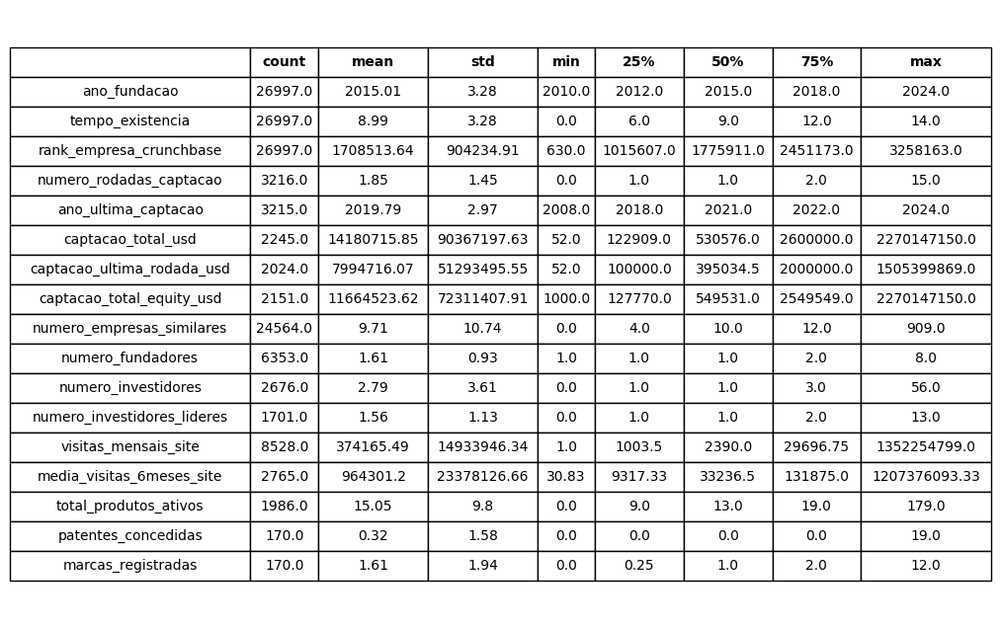

In [47]:
# Gerar uma tabela de estatísticas descritivas dos dados numéricos extraídos.

selected_columns = ['ano_fundacao',
                    'tempo_existencia',
                    'rank_empresa_crunchbase',
                    'numero_rodadas_captacao',
                    'ano_ultima_captacao',
                    'captacao_total_usd',
                    'captacao_ultima_rodada_usd',
                    'captacao_total_equity_usd',
                    'numero_empresas_similares',
                    'numero_fundadores',
                    'numero_investidores',
                    'numero_investidores_lideres',
                    'visitas_mensais_site',
                    'media_visitas_6meses_site',
                    'total_produtos_ativos',
                    'patentes_concedidas',
                    'marcas_registradas'
                   ]
df_selected = df_base[selected_columns]

description_num = df_selected.describe()
description_num = description_num.apply(lambda x: round(x, 2))
transposed_description_numeric = description_num.transpose()

# Criar uma figura para exibição das informações
fig, ax = plt.subplots(figsize=(12, 8))  # Adjust figure size as needed
ax.axis('off')  # Turn off axis

table_data = transposed_description_numeric.reset_index().values.tolist()
col_labels = [''] + transposed_description_numeric.columns.tolist()  # Include an empty header for row index

table = ax.table(cellText=table_data,
                 colLabels=col_labels,
                 cellLoc='center',
                 loc='center')

table.auto_set_column_width([0] + list(range(1, len(col_labels))))

for (i, j), cell in table.get_celld().items():
    if i == 0:
        cell.set_text_props(fontweight='bold')

table.auto_set_font_size(False)
table.set_fontsize(10)  # Adjust font size as needed
table.scale(1, 1.8)  # Increase row spacing by scaling cell heights

# Salvar a imagem gerada em arquivo para uso posterior.
plt.savefig('./saved_plots/summary_statistics_table_source_numeric.png', bbox_inches='tight')

plt.show()

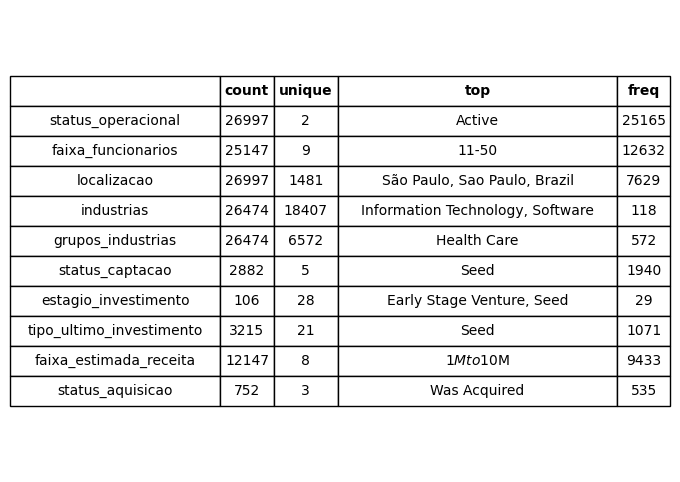

In [48]:
# Gerar uma tabela de estatísticas descritivas dos dados categóricos extraídos.

selected_columns_cat = ['status_operacional',
                        'faixa_funcionarios',
                        'localizacao',
                        'industrias',
                        'grupos_industrias',
                        'status_captacao',
                        'estagio_investimento',
                        'tipo_ultimo_investimento',
                        'faixa_estimada_receita',
                        'status_aquisicao'
                       ]
df_selected = df_base[selected_columns_cat]

description_cat = df_selected.describe(include='object')
transposed_description_cat = description_cat.transpose()

# Criar uma figura para exibição das informações
fig, ax = plt.subplots(figsize=(8, 6))  # Adjust figure size as needed
ax.axis('off')  # Turn off axis

table_data = transposed_description_cat.reset_index().values.tolist()
col_labels = [''] + transposed_description_cat.columns.tolist()  # Include an empty header for row index

table = ax.table(cellText=table_data,
                 colLabels=col_labels,
                 cellLoc='center',
                 loc='center')

table.auto_set_column_width([0] + list(range(1, len(col_labels))))

for (i, j), cell in table.get_celld().items():
    if i == 0:
        cell.set_text_props(fontweight='bold')

table.auto_set_font_size(False)
table.set_fontsize(10)  # Adjust font size as needed
table.scale(1, 1.8)  # Increase row spacing by scaling cell heights

# Salvar a imagem gerada em arquivo para uso posterior.
plt.savefig('./saved_plots/summary_statistics_table_source_categorical.png', bbox_inches='tight')

plt.show()

### Salvar os dados estatísticos em uma planilha Excel.

In [50]:
transposed_description_numeric = description_num.transpose()

# Salvar o DataFrame transposto em uma planilha Excel
transposed_description_numeric.to_excel('./saved_plots/summary_statistics_categorical_table_source_abnt.xlsx', index=True)

print("Dados salvos com sucesso na planilha Excel.")

Dados salvos com sucesso na planilha Excel.


In [51]:
transposed_description_cat = description_cat.transpose()

# Salvar o DataFrame transposto em uma planilha Excel
transposed_description_cat.to_excel('./saved_plots/summary_statistics_categorical_table_source_abnt.xlsx', index=True)

print("Dados salvos com sucesso na planilha Excel.")

Dados salvos com sucesso na planilha Excel.


In [52]:
data_source = df_source.copy()

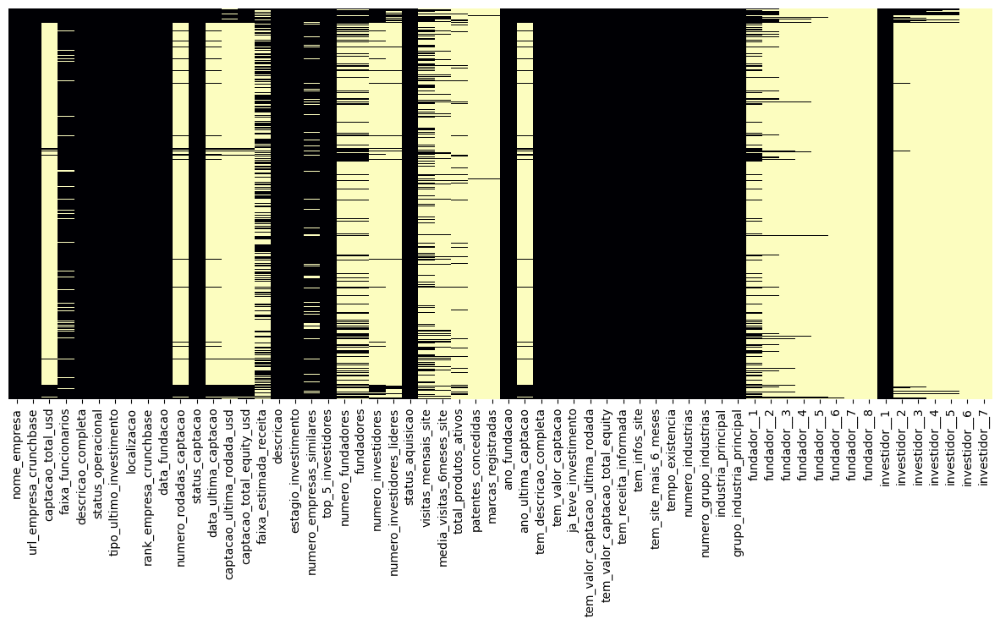

In [53]:
plt.figure(figsize=(15,6))
sns.heatmap(data_source.isnull(), yticklabels=False, cbar=False, cmap='magma')
plt.savefig('./saved_plots/missing_map_data_source.png', dpi=300, bbox_inches = "tight")
plt.show()

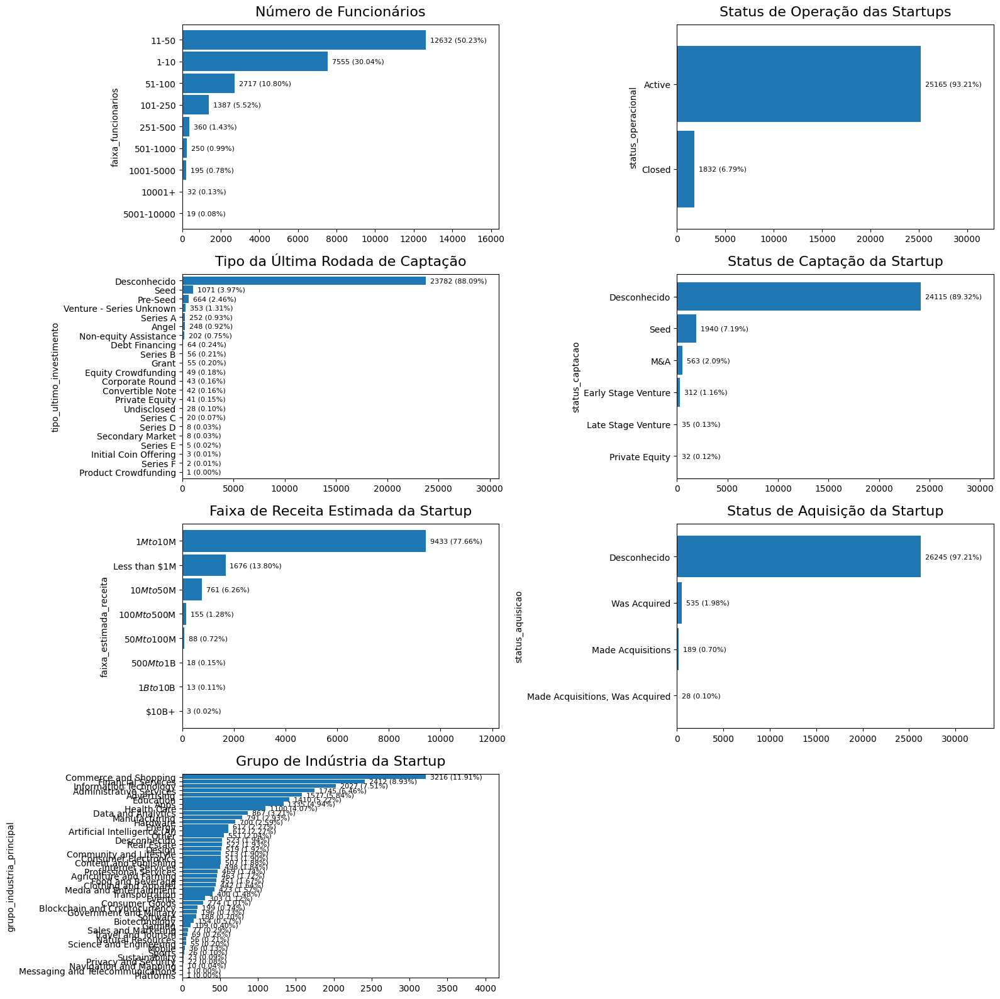

In [54]:
columns = [
           'faixa_funcionarios',
           'status_operacional',
           'tipo_ultimo_investimento',
           'status_captacao',
           'faixa_estimada_receita',
           'status_aquisicao',
           'grupo_industria_principal'
]

titles = [
          'Número de Funcionários',
          'Status de Operação das Startups',
          'Tipo da Última Rodada de Captação',
          'Status de Captação da Startup',
          'Faixa de Receita Estimada da Startup',
          'Status de Aquisição da Startup',
          'Grupo de Indústria da Startup'
]

plot_multiple_barh(data_source, columns, titles, save_path='./saved_plots/', annotation_fontsize=8)

### Versão individual de gráfico de barras horizontais com os percentuais no gráfico

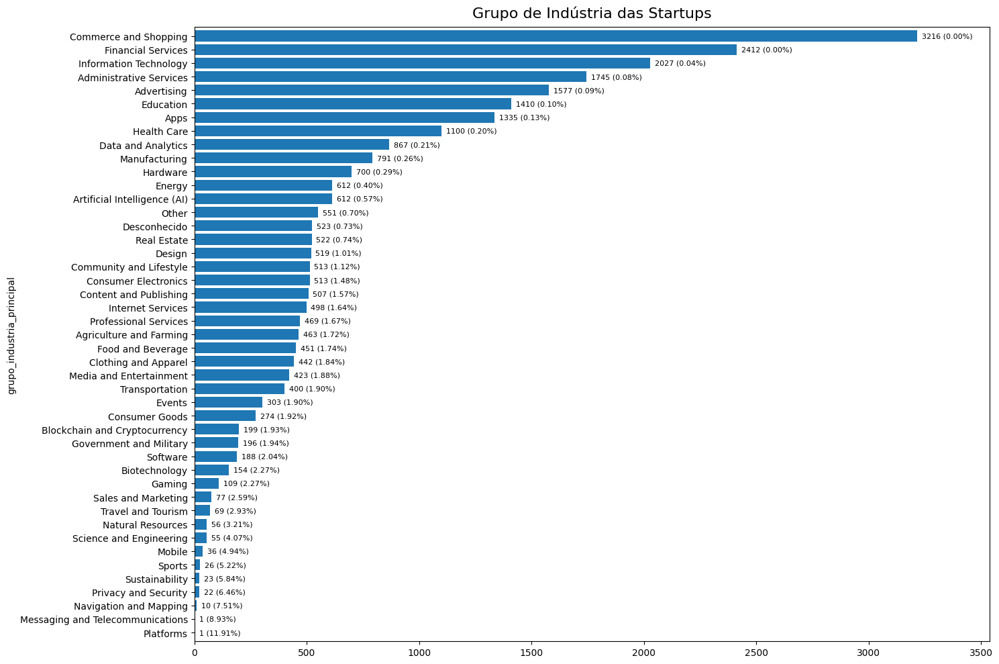

In [56]:
target_count = data_source['grupo_industria_principal'].value_counts()

# Calculate the total count for percentage calculation
total_count = target_count.sum()

# Calculate the percentage for each class
percentages = (target_count / total_count) * 100

# Sort values in descending order
target_count_sorted = target_count.sort_values(ascending=True)

# Plotting the horizontal bar chart with largest values on top
fig, ax = plt.subplots(figsize=(15, 10))  # Adjust figsize as needed
target_count_sorted.plot(ax=ax, kind='barh', fontsize=10, width=0.8)  # Use kind='barh' for horizontal bar chart
plt.title('Grupo de Indústria das Startups', fontsize=16, pad=10)

# Expanding the x-axis limit to add space for annotations
max_width = max(target_count) * 1.1  # Increase 30% of max value for right space
ax.set_xlim(0, max_width)

# Adding the values next to each bar with a 0-degree rotation
for i, p in enumerate(ax.patches):
    width = p.get_width()
    class_name = target_count.index[i]
    ax.annotate(f'{width} ({percentages[class_name]:.2f}%)', 
                (width, p.get_y() + p.get_height() / 2.), 
                ha='left', va='center', 
                xytext=(5, 0), 
                textcoords='offset points',
                fontsize=8)

plt.tight_layout()

plt.savefig('./saved_plots/grupo_industrias.png')

plt.show()


### Versão individual de gráfico de barras verticais com os percentuais no gráfico

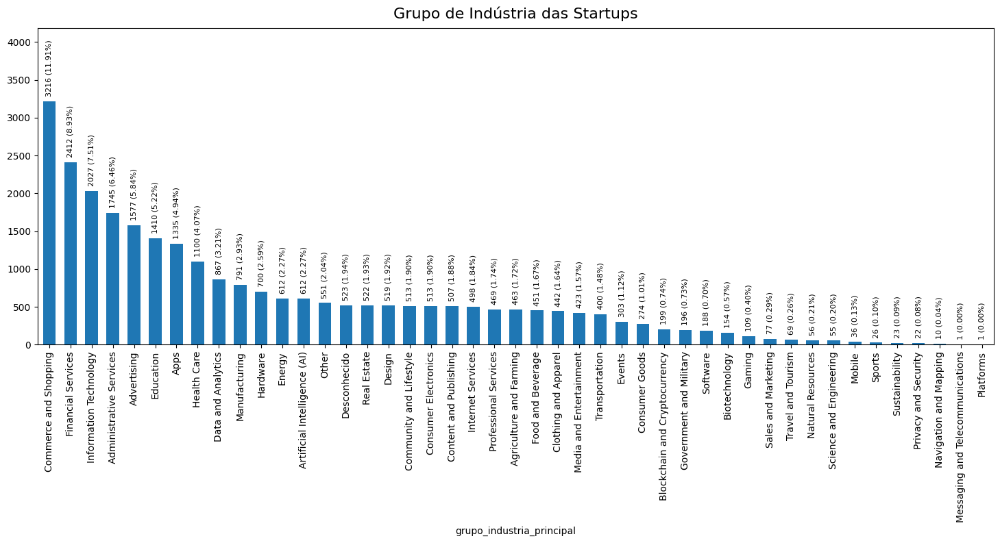

In [58]:
target_count = data_source['grupo_industria_principal'].value_counts()

# Calculate the percentage for each class
percentages = (target_count / total_count) * 100

# Plotting the bar chart
ax = target_count.plot(figsize=(18, 6), kind='bar', fontsize=10, width=0.6)
plt.title('Grupo de Indústria das Startups', fontsize=16, pad=10)

# Expanding the y-axis limit to add space for annotations
max_height = max(target_count) * 1.3  # Increase 10% of max value for top space
ax.set_ylim(0, max_height)

# Adding the values on top of each bar
for i, p in enumerate(ax.patches):
    height = p.get_height()
    class_name = target_count.index[i]
    ax.annotate(f'{height} ({percentages[class_name]:.2f}%)', 
                (p.get_x() + p.get_width() / 2., height), 
                ha='center', va='bottom', 
                xytext=(0, 5), 
                textcoords='offset points',
                fontsize=8,
                rotation=90)

plt.show()
# plt.savefig('../Imagens/bal_classes_init')

# Vamos fazer as análises exploratórias para o arquivo filtrado e reduzido (dataset).

In [60]:
dataset = df_dataset.copy()

### Verificar a presença de dados faltantes (missing values).

In [62]:
df_missing = dataset.drop(columns=['y'], axis=1)

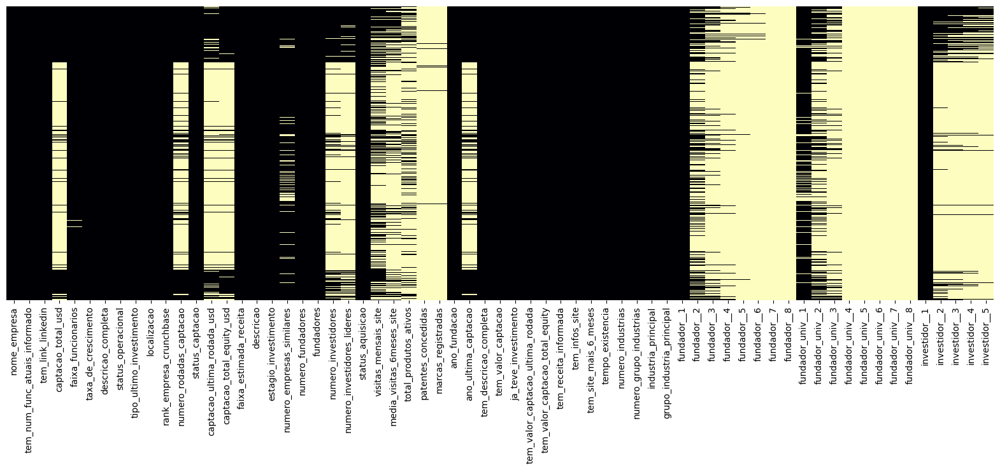

In [63]:
plt.figure(figsize=(20,6))
sns.heatmap(df_missing.isnull(), yticklabels=False, cbar=False, cmap='magma')
plt.savefig('./saved_plots/missing_map_dataset.png', dpi=300, bbox_inches = "tight")
plt.show()

In [64]:
percent_missing = dataset.isnull().sum() * 100 / len(dataset)
missing_value_df = pd.DataFrame({'column_name': dataset.columns,
                                 'percent_missing': percent_missing})

missing_value_df

,column_name,percent_missing
nome_empresa,nome_empresa,0.00
tem_num_func_atuais_informado,tem_num_func_atuais_informado,0.00
tem_link_linkedin,tem_link_linkedin,0.00
captacao_total_usd,captacao_total_usd,66.84
faixa_funcionarios,faixa_funcionarios,0.68
taxa_de_crescimento,taxa_de_crescimento,0.00
descricao_completa,descricao_completa,0.00
status_operacional,status_operacional,0.00
tipo_ultimo_investimento,tipo_ultimo_investimento,0.00
localizacao,localizacao,0.00


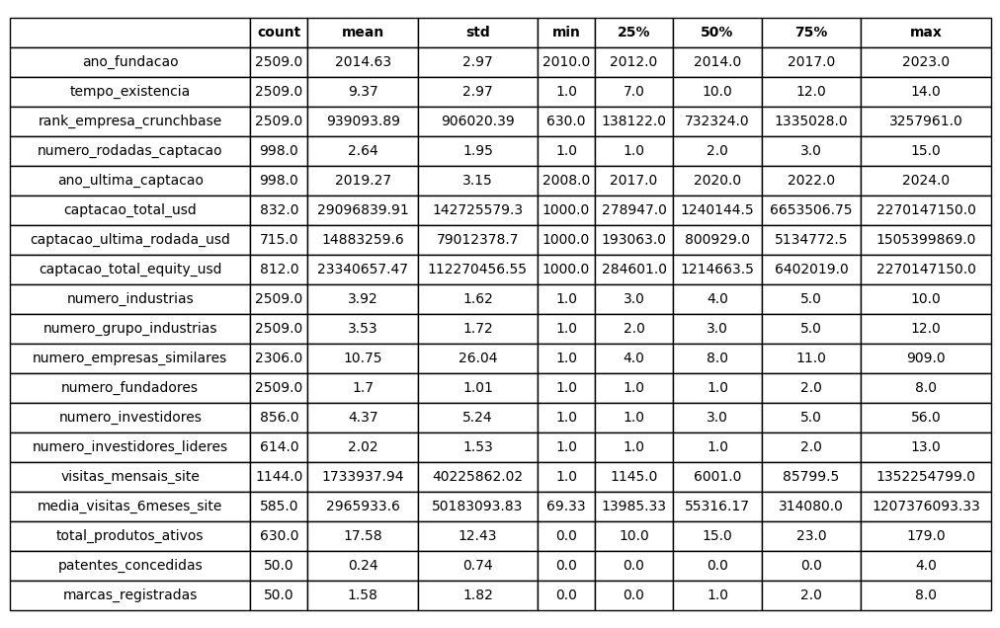

In [65]:
selected_columns = ['ano_fundacao',
                    'tempo_existencia',
                    'rank_empresa_crunchbase',
                    'numero_rodadas_captacao',
                    'ano_ultima_captacao',
                    'captacao_total_usd',
                    'captacao_ultima_rodada_usd',
                    'captacao_total_equity_usd',
                    'numero_industrias',
                    'numero_grupo_industrias',
                    'numero_empresas_similares',
                    'numero_fundadores',
                    'numero_investidores',
                    'numero_investidores_lideres',
                    'visitas_mensais_site',
                    'media_visitas_6meses_site',
                    'total_produtos_ativos',
                    'patentes_concedidas',
                    'marcas_registradas'
                   ]
df_selected = dataset[selected_columns]

# Generate summary statistics
description = df_selected.describe()

# Formatting the values to 2 decimal places
description = description.apply(lambda x: round(x, 2))

# Transpose the DataFrame
transposed_description_2 = description.transpose()

transposed_description_2

# Create a figure and axis without frame
fig, ax = plt.subplots(figsize=(12, 8))  # Adjust figure size as needed
ax.axis('off')  # Turn off axis

# Display table with adjusted column widths
table_data = transposed_description_2.reset_index().values.tolist()
col_labels = [''] + transposed_description_2.columns.tolist()  # Include an empty header for row index

table = ax.table(cellText=table_data,
                 colLabels=col_labels,
                 cellLoc='center',
                 loc='center')

# Adjust column widths
table.auto_set_column_width([0] + list(range(1, len(col_labels))))

# Set bold font for headers and column names
for (i, j), cell in table.get_celld().items():
    if i == 0:
        cell.set_text_props(fontweight='bold')

table.auto_set_font_size(False)
table.set_fontsize(10)  # Adjust font size as needed

# Adjust cell heights for better row spacing
table.scale(1, 1.8)  # Increase row spacing by scaling cell heights

# Save the plot as an image file (e.g., PNG)
plt.savefig('./saved_plots/summary_statistics_table.png', bbox_inches='tight')

plt.show()

In [66]:
# Salvar o DataFrame transposto em uma planilha Excel
transposed_description_2.to_excel('./saved_plots/summary_statistics_table_dataset_abnt.xlsx', index=True)

print("Dados salvos com sucesso na planilha Excel.")

Dados salvos com sucesso na planilha Excel.


In [67]:
dataset.describe(include='object').transpose()

,count,unique,top,freq
nome_empresa,2509,2508,Acesso,2
faixa_funcionarios,2492,9,11-50,1174
taxa_de_crescimento,2509,4,sem_crescimento,2292
descricao_completa,2509,1879,Desconhecido,631
status_operacional,2509,2,Active,2248
tipo_ultimo_investimento,2509,22,Desconhecido,1511
localizacao,2509,338,"São Paulo, Sao Paulo, Brazil",986
status_captacao,2509,6,Desconhecido,1632
faixa_estimada_receita,2509,8,$1M to $10M,1539
descricao,2509,2508,"Alternative Online Lending, FinTech, online cr...",2


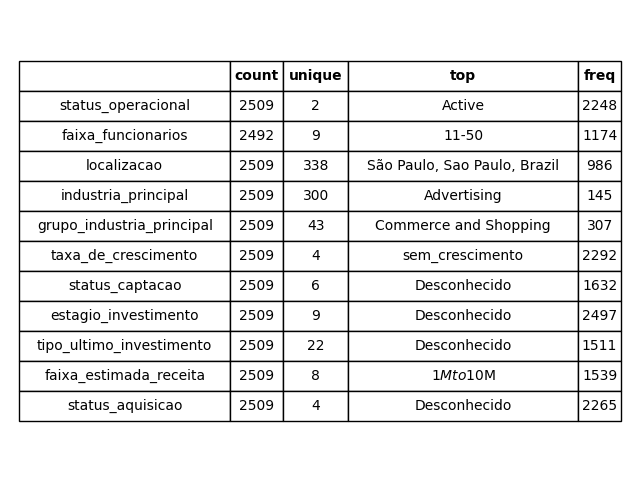

In [68]:
selected_columns_cat = ['status_operacional',
                        'faixa_funcionarios',
                        'localizacao',
                        'industria_principal',
                        'grupo_industria_principal',
                        'taxa_de_crescimento',
                        'status_captacao',
                        'estagio_investimento',
                        'tipo_ultimo_investimento',
                        'faixa_estimada_receita',
                        'status_aquisicao'
                       ]
df_selected = dataset[selected_columns_cat]

# Generate summary statistics
description = df_selected.describe(include='object')

# Transpose the DataFrame
transposed_description_3 = description.transpose()

transposed_description_3

# Create a figure and axis without frame
fig, ax = plt.subplots(figsize=(8, 6))  # Adjust figure size as needed
ax.axis('off')  # Turn off axis

# Display table with adjusted column widths
table_data = transposed_description_3.reset_index().values.tolist()
col_labels = [''] + transposed_description_3.columns.tolist()  # Include an empty header for row index

table = ax.table(cellText=table_data,
                 colLabels=col_labels,
                 cellLoc='center',
                 loc='center')

# Adjust column widths
table.auto_set_column_width([0] + list(range(1, len(col_labels))))

# Set bold font for headers and column names
for (i, j), cell in table.get_celld().items():
    if i == 0:
        cell.set_text_props(fontweight='bold')

table.auto_set_font_size(False)
table.set_fontsize(10)  # Adjust font size as needed

# Adjust cell heights for better row spacing
table.scale(1, 1.8)  # Increase row spacing by scaling cell heights

# Save the plot as an image file (e.g., PNG)
plt.savefig('./saved_plots/summary_statistics_table_cat.png', bbox_inches='tight')

plt.show()

In [69]:
# Salvar o DataFrame transposto em uma planilha Excel
transposed_description_3.to_excel('./saved_plots/summary_statistics_table_dataset_abnt_cat.xlsx', index=True)

print("Dados salvos com sucesso na planilha Excel.")

Dados salvos com sucesso na planilha Excel.


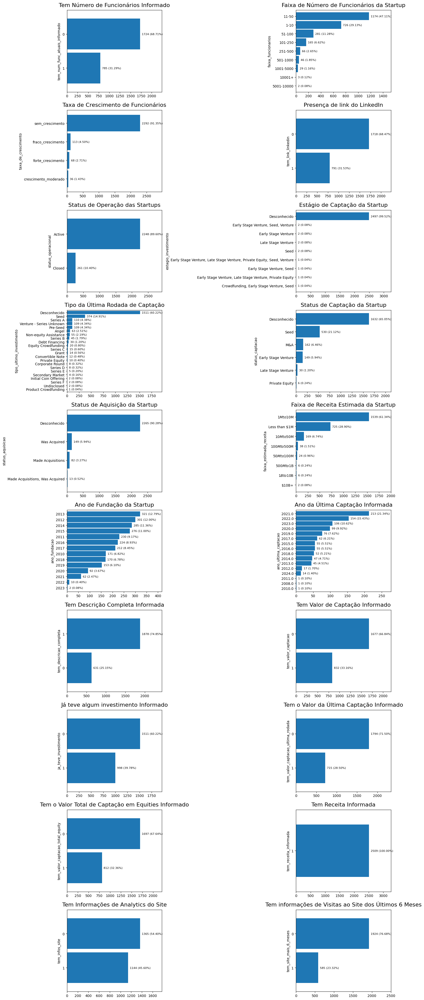

In [70]:
# Verificar distribuições de algumas variáveis da base de origem.

columns = [
            'tem_num_func_atuais_informado',
            'faixa_funcionarios',
            'taxa_de_crescimento',
            'tem_link_linkedin',
            'status_operacional',
            'estagio_investimento',
            'tipo_ultimo_investimento',
            'status_captacao',
            'status_aquisicao',
            'faixa_estimada_receita',
            'ano_fundacao',
            'ano_ultima_captacao',
            'tem_descricao_completa',
            'tem_valor_captacao',
            'ja_teve_investimento',
            'tem_valor_captacao_ultima_rodada',
            'tem_valor_captacao_total_equity',
            'tem_receita_informada',
            'tem_infos_site',
            'tem_site_mais_6_meses'
]

titles = ['Tem Número de Funcionários Informado',
          'Faixa de Número de Funcionários da Startup',
          'Taxa de Crescimento de Funcionários', 
          'Presença de link do LinkedIn',
          'Status de Operação das Startups',
          'Estágio de Captação da Startup',
          'Tipo da Última Rodada de Captação',
          'Status de Captação da Startup',
          'Status de Aquisição da Startup',
          'Faixa de Receita Estimada da Startup',
          'Ano de Fundação da Startup',
          'Ano da Última Captação Informada',
          'Tem Descrição Completa Informada',
          'Tem Valor de Captação Informado',
          'Já teve algum investimento Informado',
          'Tem o Valor da Última Captação Informado',
          'Tem o Valor Total de Captação em Equities Informado',
          'Tem Receita Informada',
          'Tem Informações de Analytics do Site',
          'Tem informações de Visitas ao Site dos Últimos 6 Meses'
]

plot_multiple_barh(dataset, columns, titles, save_path='./saved_plots/', annotation_fontsize=8)

### Versão individual de gráfico de barras horizontais com os percentuais no gráfico

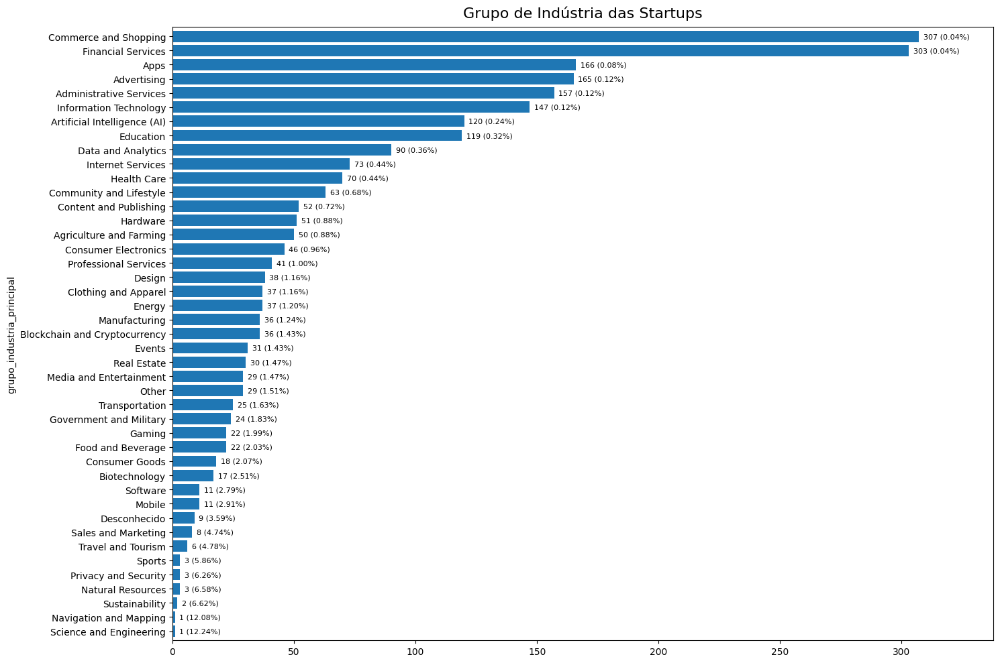

In [72]:
target_count = dataset['grupo_industria_principal'].value_counts()

# Calculate the total count for percentage calculation
total_count = target_count.sum()

# Calculate the percentage for each class
percentages = (target_count / total_count) * 100

# Sort values in descending order
target_count_sorted = target_count.sort_values(ascending=True)

# Plotting the horizontal bar chart with largest values on top
fig, ax = plt.subplots(figsize=(15, 10))  # Adjust figsize as needed
target_count_sorted.plot(ax=ax, kind='barh', fontsize=10, width=0.8)  # Use kind='barh' for horizontal bar chart
plt.title('Grupo de Indústria das Startups', fontsize=16, pad=10)

# Expanding the x-axis limit to add space for annotations
max_width = max(target_count) * 1.1  # Increase 30% of max value for right space
ax.set_xlim(0, max_width)

# Adding the values next to each bar with a 0-degree rotation
for i, p in enumerate(ax.patches):
    width = p.get_width()
    class_name = target_count.index[i]
    ax.annotate(f'{width} ({percentages[class_name]:.2f}%)', 
                (width, p.get_y() + p.get_height() / 2.), 
                ha='left', va='center', 
                xytext=(5, 0), 
                textcoords='offset points',
                fontsize=8)

plt.tight_layout()

plt.savefig('./saved_plots/grupo_industrias.png')

plt.show()


### Versão individual de gráfico de barras verticais com os percentuais no gráfico

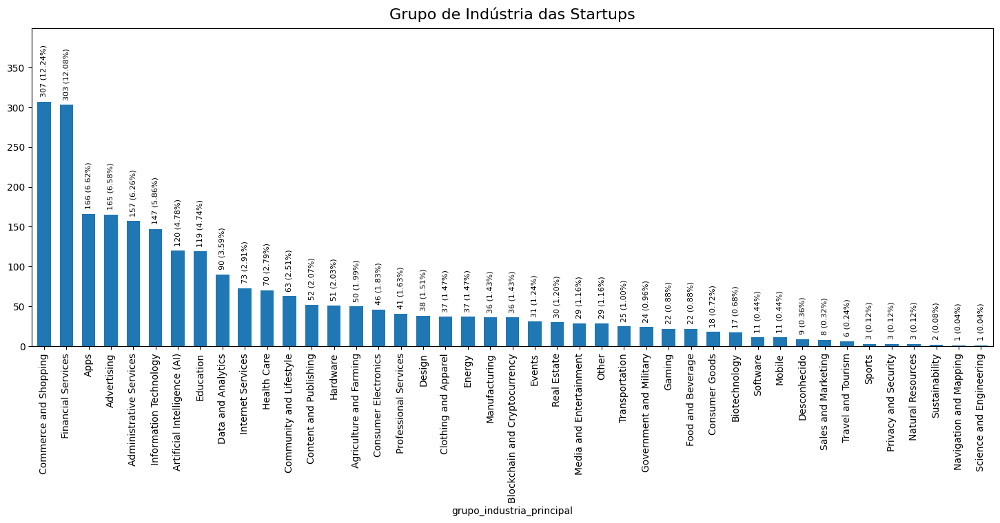

In [74]:
target_count = dataset['grupo_industria_principal'].value_counts()

# Calculate the percentage for each class
percentages = (target_count / total_count) * 100

# Plotting the bar chart
ax = target_count.plot(figsize=(18, 6), kind='bar', fontsize=10, width=0.6)
plt.title('Grupo de Indústria das Startups', fontsize=16, pad=10)

# Expanding the y-axis limit to add space for annotations
max_height = max(target_count) * 1.3  # Increase 10% of max value for top space
ax.set_ylim(0, max_height)

# Adding the values on top of each bar
for i, p in enumerate(ax.patches):
    height = p.get_height()
    class_name = target_count.index[i]
    ax.annotate(f'{height} ({percentages[class_name]:.2f}%)', 
                (p.get_x() + p.get_width() / 2., height), 
                ha='center', va='bottom', 
                xytext=(0, 5), 
                textcoords='offset points',
                fontsize=8,
                rotation=90)

plt.show()
# plt.savefig('../Imagens/bal_classes_init')

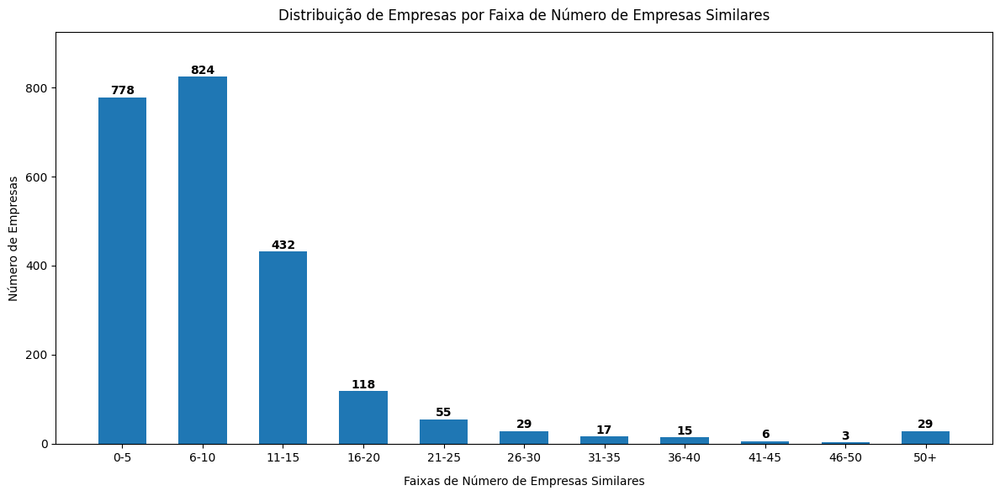

In [75]:
# Step 1: Define the bin edges manually
bin_edges = [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, dataset['numero_empresas_similares'].max() + 1]  # Adding max()+1 to include the maximum value

# Step 2: Define bin labels to make the plot easier to read
bin_labels = ['0-5', '6-10', '11-15', '16-20', '21-25', '26-30', '31-35', '36-40', '41-45', '46-50', '50+']

# Step 3: Bin the data using the specified bin edges
dataset['similar_companies_bins'] = pd.cut(dataset['numero_empresas_similares'], bins=bin_edges, labels=bin_labels, include_lowest=True)

# Step 4: Calculate the counts for each bin
bin_counts = dataset['similar_companies_bins'].value_counts().sort_index()

# Determine the maximum count of companies in any bin for adjusting y-axis
max_bin_count = bin_counts.max()

# Plot the results with the specified figure size
fig, ax = plt.subplots(figsize=(12, 6))

# Plot the count of companies in each bin
ax.bar(bin_labels, bin_counts, width=0.6, align='center')

# Add count labels at the top of each bar
for i, count in enumerate(bin_counts):
    ax.text(
        i,  # x position: the center of the bar
        count + 0.5,  # y position: above the bar
        f'{count}',  # label text
        ha='center',  # horizontal alignment
        va='bottom',  # vertical alignment
        fontsize=10,  # font size
        weight='bold'  # font weight
    )

# Add titles and labels
plt.title('Distribuição de Empresas por Faixa de Número de Empresas Similares', pad=10)
plt.xlabel('Faixas de Número de Empresas Similares', labelpad=10)
plt.ylabel('Número de Empresas')

# Adjust y-axis limit based on the maximum count of companies
ax.set_ylim(0, max_bin_count + 100)

# Show the plot
plt.tight_layout()
plt.savefig('./saved_plots/dist_empresas_por_faixa.png')
plt.show()

# Avaliar a Distribuição das empresas para algumas variáveis numéricas.

In [77]:
columns_of_interest = ['numero_rodadas_captacao',
                        'captacao_total_usd',
                        'captacao_ultima_rodada_usd',
                        'captacao_total_equity_usd',
                        'numero_empresas_similares',
                        'numero_fundadores',
                        'numero_investidores',
                        'numero_investidores_lideres',
                        'visitas_mensais_site',
                        'media_visitas_6meses_site',
                        'total_produtos_ativos',
                        'patentes_concedidas',
                        'marcas_registradas']
df_selected = dataset[columns_of_interest]

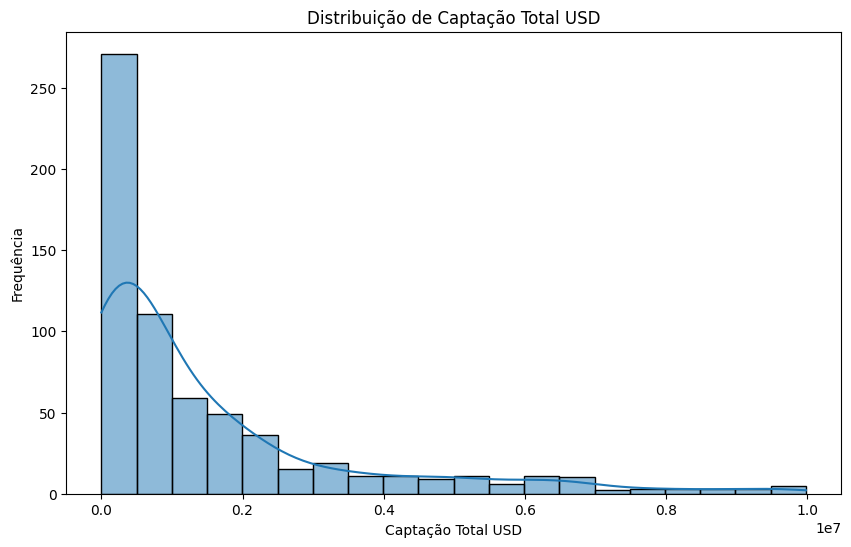

In [78]:
filtered_values = dataset['captacao_total_usd'].dropna().loc[dataset['captacao_total_usd'] < 10000000]

plt.figure(figsize=(10, 6))
sns.histplot(filtered_values, bins=20, kde=True)
plt.title('Distribuição de Captação Total USD')
plt.xlabel('Captação Total USD')
plt.ylabel('Frequência')
plt.show()

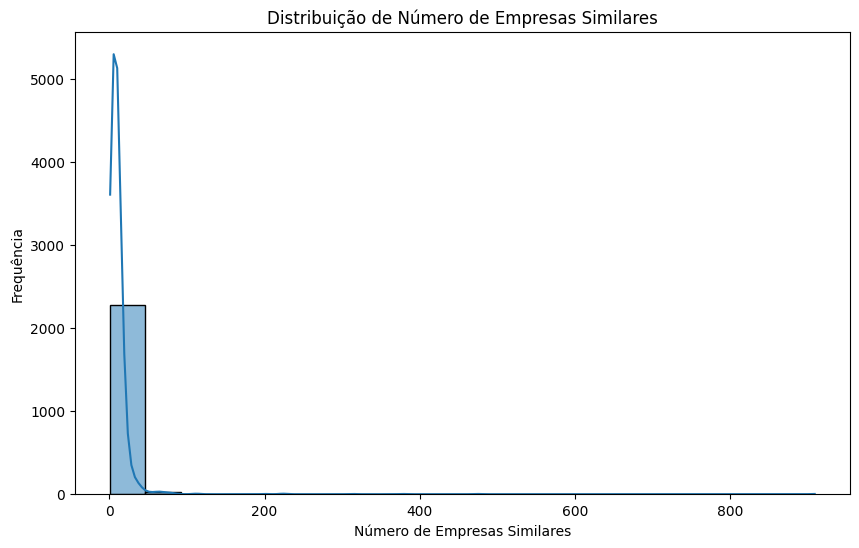

In [79]:
filtered_num_emp_sim_values = dataset['numero_empresas_similares'].dropna()

plt.figure(figsize=(10, 6))
sns.histplot(filtered_num_emp_sim_values, bins=20, kde=True)
plt.title('Distribuição de Número de Empresas Similares')
plt.xlabel('Número de Empresas Similares')
plt.ylabel('Frequência')
plt.show()

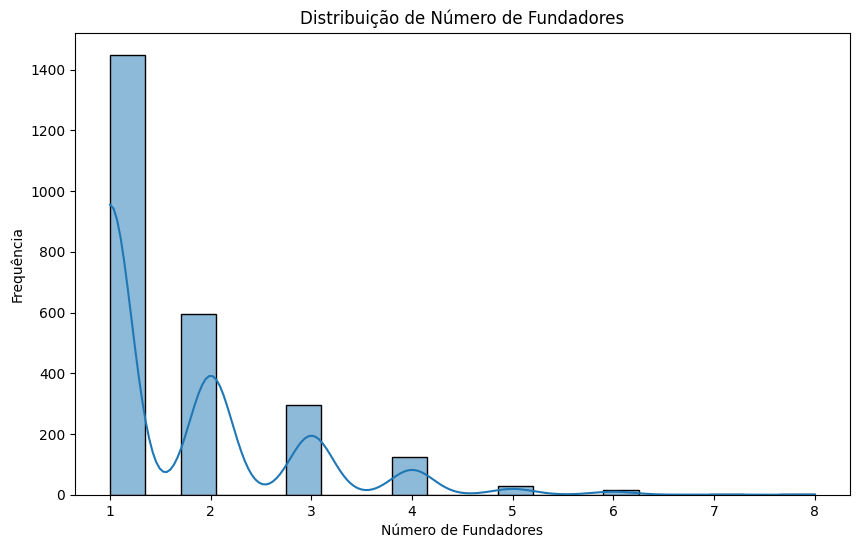

In [80]:
filtered_num_fund_values = dataset['numero_fundadores'].dropna()

plt.figure(figsize=(10, 6))
sns.histplot(filtered_num_fund_values, bins=20, kde=True)
plt.title('Distribuição de Número de Fundadores')
plt.xlabel('Número de Fundadores')
plt.ylabel('Frequência')
plt.show()

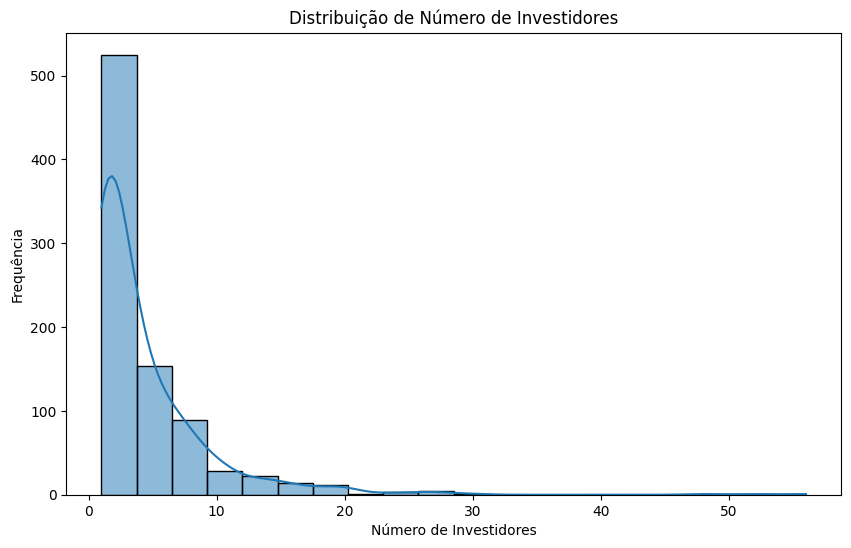

In [81]:
filtered_num_inv_values = dataset['numero_investidores'].dropna()

plt.figure(figsize=(10, 6))
sns.histplot(filtered_num_inv_values, bins=20, kde=True)
plt.title('Distribuição de Número de Investidores')
plt.xlabel('Número de Investidores')
plt.ylabel('Frequência')
plt.show()

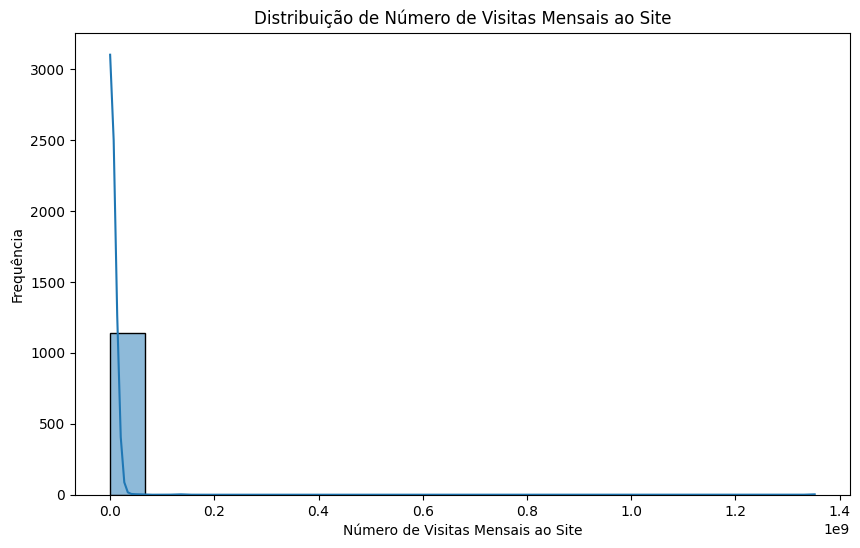

In [82]:
filtered_visit_site_values = dataset['visitas_mensais_site'].dropna()

plt.figure(figsize=(10, 6))
sns.histplot(filtered_visit_site_values, bins=20, kde=True)
plt.title('Distribuição de Número de Visitas Mensais ao Site')
plt.xlabel('Número de Visitas Mensais ao Site')
plt.ylabel('Frequência')
plt.show()

In [83]:
dataset['faixa_estimada_receita'].unique().tolist()

['$10M to $50M',
 '$100M to $500M',
 '$10B+',
 '$50M to $100M',
 '$1M to $10M',
 'Less than $1M',
 '$1B to $10B',
 '$500M to $1B']

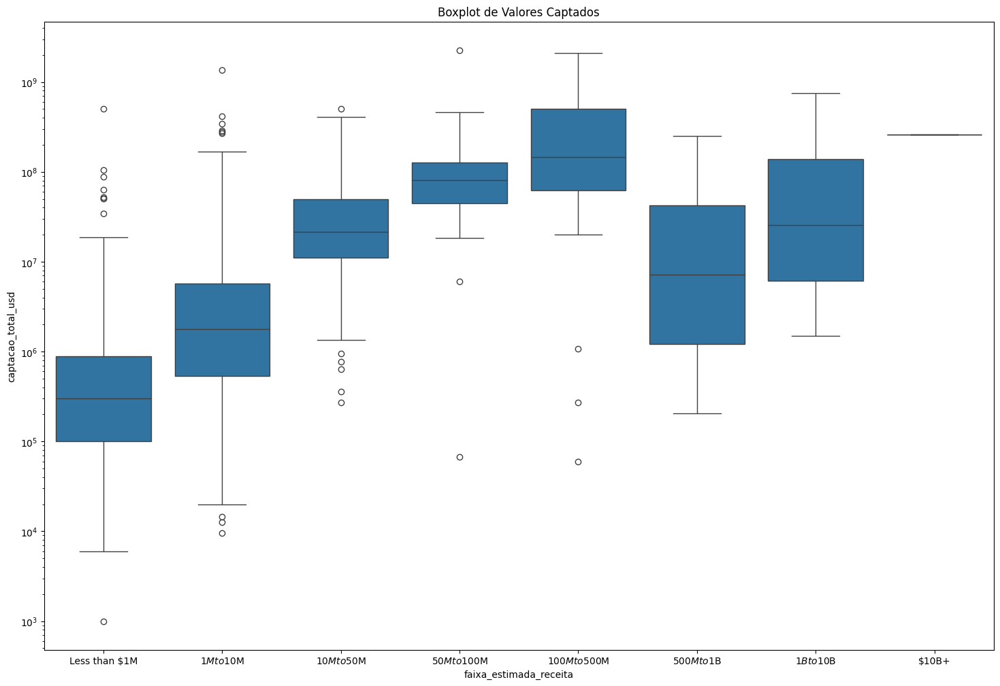

In [84]:
plt.figure(figsize=(18, 12))
sns.boxplot(data=dataset, x='faixa_estimada_receita', y='captacao_total_usd', log_scale=True, order=['Less than $1M',
                                                                                         '$1M to $10M',
                                                                                         '$10M to $50M',
                                                                                         '$50M to $100M',
                                                                                         '$100M to $500M',
                                                                                         '$500M to $1B',
                                                                                         '$1B to $10B',
                                                                                         '$10B+']
           )
plt.title('Boxplot de Valores Captados')
plt.savefig('./saved_plots/box_plot_valores.png')

plt.show()

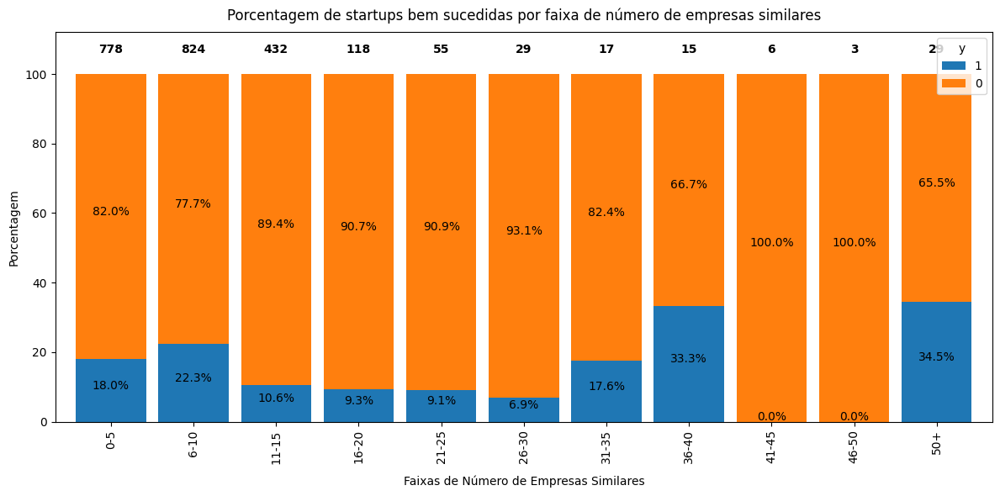

In [85]:

# Step 2: Define the bin edges manually
bin_edges = [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, dataset['numero_empresas_similares'].max() + 1]  # Adding max()+1 to include the maximum value

# Step 3: Define bin labels to make the plot easier to read
bin_labels = ['0-5', '6-10', '11-15', '16-20', '21-25', '26-30', '31-35', '36-40', '41-45', '46-50', '50+']

# Step 4: Bin the data using the specified bin edges
dataset['similar_companies_bins'] = pd.cut(dataset['numero_empresas_similares'], bins=bin_edges, labels=bin_labels, include_lowest=True)

# Step 5: Group by the binned 'similar_companies' column and calculate the percentage of 'y'
grouped = dataset.groupby('similar_companies_bins')['y'].value_counts(normalize=True).unstack().fillna(0)

# To calculate the percentage, multiply by 100
grouped_percentage = grouped * 100

# Step 6: Calculate the counts for each bin
bin_counts = dataset['similar_companies_bins'].value_counts().sort_index()

# Step 7: Determine the maximum height of the bars
max_bar_height = grouped_percentage.sum(axis=1).max()

# Step 8: Plot the results with the specified figure size
fig, ax = plt.subplots(figsize=(12, 6))

# Plot stacked bars in the reversed order (1 below 0)
grouped_percentage[[1, 0]].plot(kind='bar', stacked=True, width=0.85, ax=ax)

# Add titles and labels
plt.title('Porcentagem de startups bem sucedidas por faixa de número de empresas similares', pad=10)
plt.xlabel('Faixas de Número de Empresas Similares', labelpad=10)
plt.ylabel('Porcentagem')

# Add percentage labels inside the bars
for container in ax.containers:
    ax.bar_label(container, fmt='%.1f%%', label_type='center', padding=4)

# Add count labels at the top of each bar
for i, bin_label in enumerate(bin_labels):
    count = bin_counts[bin_label]
    ax.text(
        i,  # x position: the center of the bar
        grouped_percentage.loc[bin_label, 1] + grouped_percentage.loc[bin_label, 0] + 7,  # y position: the top of the bar
        f'{count}',  # label text
        ha='center',  # horizontal alignment
        va='center',  # vertical alignment
        fontsize=10,  # font size
        weight='bold'  # font weight
    )


# Step 10: Add more space to the y-axis limit
ax.set_ylim(0, max_bar_height + 12)  # Adjust the value to add more space

# Step 11: Show the plot
plt.tight_layout()
plt.savefig('./saved_plots/dist_similar_companies_inverted.png')
plt.show()

In [86]:
data_source_graphs = dataset.copy()

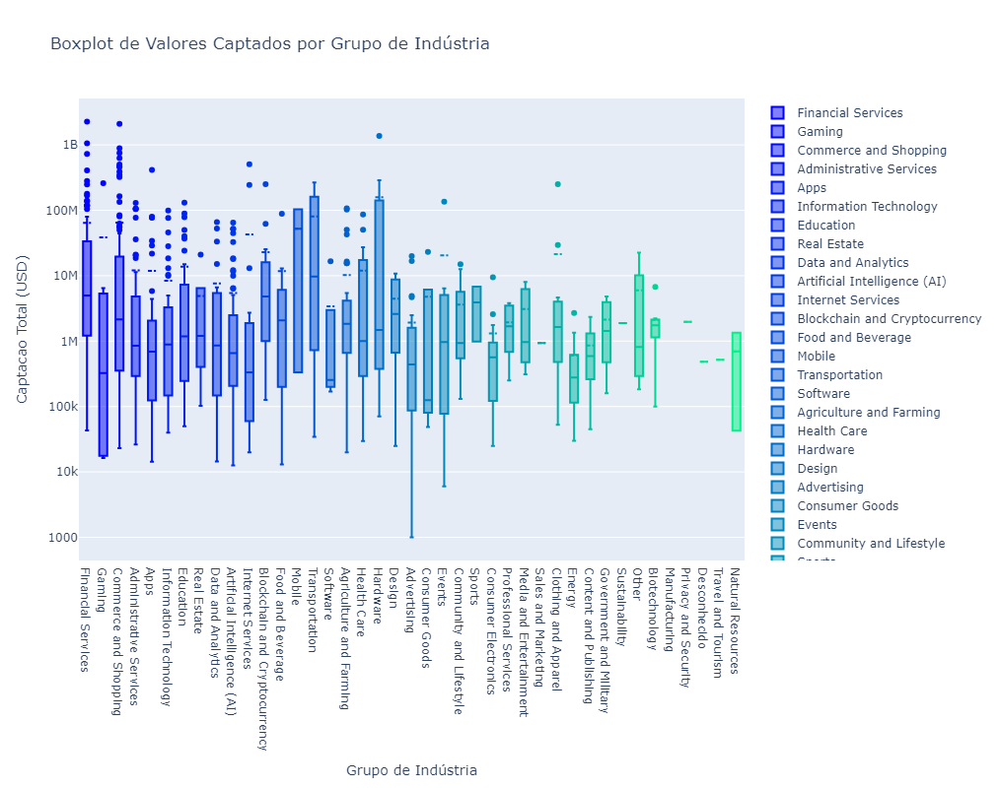

In [87]:
# Specify the desired order of categories
order = data_source_graphs['grupo_industria_principal'].unique().tolist()

# Sort data by faixa_estimada_receita for custom color assignment and order
data_source_graphs['score'] = pd.Categorical(data_source_graphs['grupo_industria_principal'], categories=order, ordered=True)
data_source_graphs.sort_values(by='score', inplace=True)

# Calculate number of unique categories
num_categories = len(order)

# Generate a range of values based on the number of categories
color_scale_values = np.linspace(0, 1, num_categories)

# Create colormap using matplotlib
colormap = cm.get_cmap('winter')

# Create traces for each category with custom colors based on their position in the sorted list
traces = []
for i, (category, df) in enumerate(data_source_graphs.groupby('score')):
    color_rgba = colormap(color_scale_values[i])  # Get RGBA color tuple from colormap
    color_rgb = (color_rgba[0] * 255, color_rgba[1] * 255, color_rgba[2] * 255)  # Convert to RGB values
    color_str = f'rgb{color_rgb}'  # Format as RGB string
    trace = go.Box(
        y=df['captacao_total_usd'],
        name=category,
        marker=dict(color=color_str),  # Use color directly without showscale
        boxmean=True
    )
    traces.append(trace)

# Create layout
layout = go.Layout(
    title='Boxplot de Valores Captados por Grupo de Indústria',
    yaxis=dict(type='log', title='Captacao Total (USD)'),
    xaxis=dict(title='Grupo de Indústria'),
    height=800
)

# Create figure and plot
fig = go.Figure(data=traces, layout=layout)
fig.show()

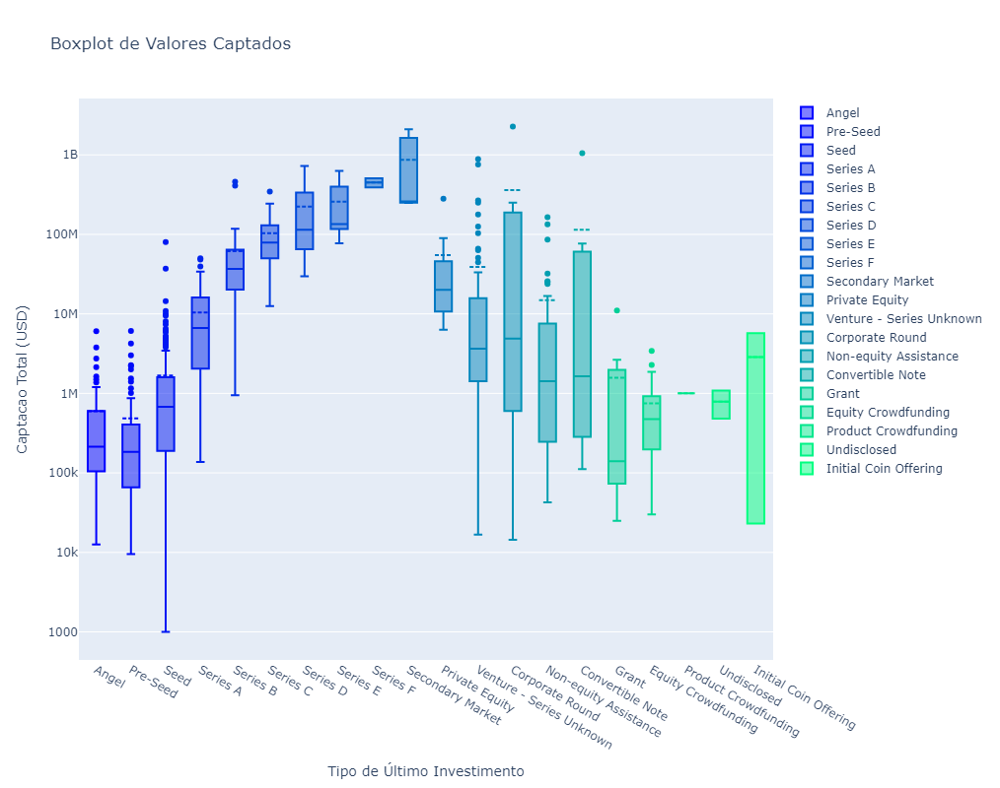

In [88]:
# Specify the desired order of categories
order = ['Angel', 'Pre-Seed', 'Seed', 'Series A', 'Series B', 'Series C',
         'Series D', 'Series E', 'Series F', 'Secondary Market', 'Private Equity',
         'Venture - Series Unknown', 'Corporate Round', 'Non-equity Assistance', 'Convertible Note', 'Post-IPO Equity', 'Post-IPO Debt',
         'Grant', 'Equity Crowdfunding', 'Product Crowdfunding', 'Undisclosed',
         'Initial Coin Offering']

# Sort data by tipo_ultimo_investimento for custom color assignment and order
data_source_graphs['score'] = pd.Categorical(data_source_graphs['tipo_ultimo_investimento'], categories=order, ordered=True)
data_source_graphs.sort_values(by='score', inplace=True)

# Calculate number of unique categories
num_categories = len(order)

# Generate a range of values based on the number of categories
color_scale_values = np.linspace(0, 1, num_categories)

# Create colormap using matplotlib
colormap = cm.get_cmap('winter')

# Create traces for each category with custom colors based on their position in the sorted list
traces = []
for i, (category, df) in enumerate(data_source_graphs.groupby('score')):
    color_rgba = colormap(color_scale_values[i])  # Get RGBA color tuple from colormap
    color_rgb = (color_rgba[0] * 255, color_rgba[1] * 255, color_rgba[2] * 255)  # Convert to RGB values
    color_str = f'rgb{color_rgb}'  # Format as RGB string
    trace = go.Box(
        y=df['captacao_total_usd'],
        name=category,
        marker=dict(color=color_str),  # Use color directly without showscale
        boxmean=True
    )
    traces.append(trace)

# Create layout
layout = go.Layout(
    title='Boxplot de Valores Captados',
    yaxis=dict(type='log', title='Captacao Total (USD)'),
    xaxis=dict(title='Tipo de Último Investimento'),
    height=800
)

# Create figure and plot
fig = go.Figure(data=traces, layout=layout)
fig.show()

# Verificar a distribuição das classes para algumas das variáveis independentes.

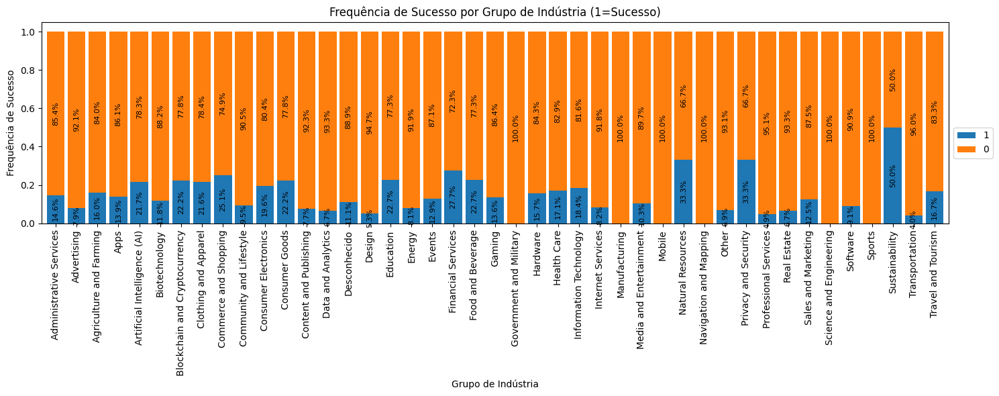

In [90]:
# Calculate the crosstab and normalize to get percentages
dist_ln = pd.crosstab(data_source_graphs['grupo_industria_principal'], data_source_graphs['y'])
dist_ln = dist_ln[sorted(dist_ln.columns, reverse=True)]
normalized_dist_ln = dist_ln.div(dist_ln.sum(1).astype(float), axis=0)

# Plot the normalized dataframe
ax = normalized_dist_ln.plot(figsize=(15, 6), kind='bar', stacked=True, width=0.85)

# Adding percentage annotations
for p in ax.patches:
    if p.get_height() > 0:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        percentage = f'{height * 100:.1f}%'
        ax.annotate(percentage, (x + width / 2, y + height / 2), ha='center', va='center', rotation=90, fontsize=8)

plt.legend(loc='upper left', bbox_to_anchor=(1, 0.5))
plt.title('Frequência de Sucesso por Grupo de Indústria (1=Sucesso)')
plt.xlabel('Grupo de Indústria')
plt.ylabel('Frequência de Sucesso')
plt.tight_layout()
plt.savefig('./saved_plots/sucesso_grupo_industria.png')
plt.show()
#plt.savefig('../Imagens/churn_email_bar')

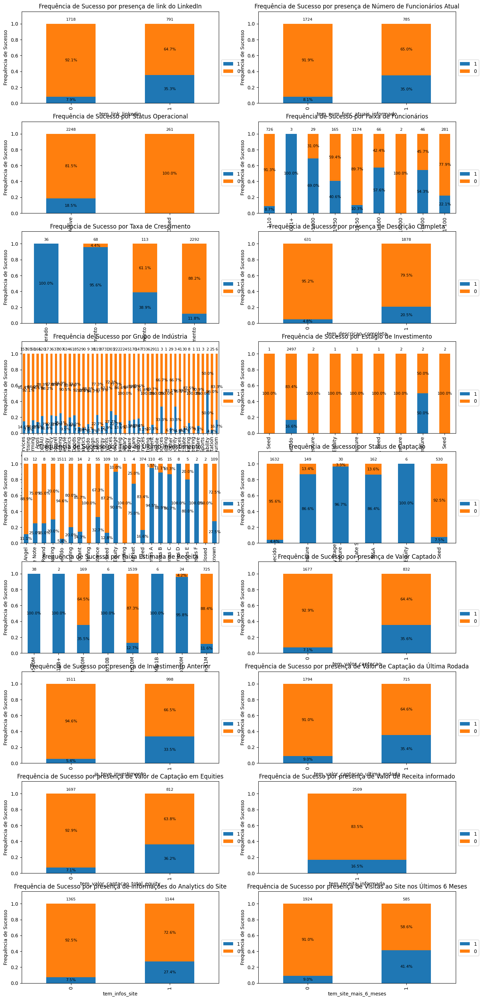

In [91]:
crosstab_cols = ['tem_link_linkedin',
                 'tem_num_func_atuais_informado',
                 'status_operacional',
                 'faixa_funcionarios',
                 'taxa_de_crescimento',
                 'tem_descricao_completa',
                 'grupo_industria_principal',
                 'estagio_investimento',
                 'tipo_ultimo_investimento',
                 'status_captacao',
                 'faixa_estimada_receita',
                 'tem_valor_captacao',
                 'ja_teve_investimento',
                 'tem_valor_captacao_ultima_rodada',
                 'tem_valor_captacao_total_equity',
                 'tem_receita_informada',
                 'tem_infos_site',
                 'tem_site_mais_6_meses']

titles = ['Frequência de Sucesso por presença de link do LinkedIn',
          'Frequência de Sucesso por presença de Número de Funcionários Atual',
          'Frequência de Sucesso por Status Operacional',
          'Frequência de Sucesso por Faixa de Funcionários',
          'Frequência de Sucesso por Taxa de Crescimento',
          'Frequência de Sucesso por presença de Descrição Completa',
          'Frequência de Sucesso por Grupo de Indústria',
          'Frequência de Sucesso por Estágio de Investimento',
          'Frequência de Sucesso por Tipo do Último Investimento',
          'Frequência de Sucesso por Status de Captação',
          'Frequência de Sucesso por Faixa Estimada de Receita',
          'Frequência de Sucesso por presença de Valor Captado',
          'Frequência de Sucesso por presença de Investimento Anterior',
          'Frequência de Sucesso por presença de Valor de Captação da Última Rodada',
          'Frequência de Sucesso por presença de Valor de Captação em Equities',
          'Frequência de Sucesso por presença de Valor de Receita informado',
          'Frequência de Sucesso por presença de Informações do Analytics do Site',
          'Frequência de Sucesso por presença de Visitas ao Site nos Últimos 6 Meses']

xlabels = ['Presença de link do LinkedIn (1 = Sim)',
           'Tem Informação de Número de Funcionários (1 = Sim)',
           'Status Operacional',
           'Faixa de Número de Funcionários',
           'Taxa de Crescimento',
           'Presença de Descrição Completa (1 = Sim)',
           'Grupo de Indústria',
           'Estágio de Investimento',
           'Tipo do Último Investimento',
           'Status de Captação',
           'Faixa Estimada de Receita',
           'Valor Captado Informado (1 = Sim)',
           'Já Teve Investimento Anterior (1 = Sim)',
           'Informou Valor Captado na Última Rodada (1 = Sim)',
           'Informou Valor Captado em Equities (1 = Sim)',
           'Informou Valor de Receita (1 = Sim)',
           'Informou Analytics do Site (1 = Sim)',
           'Informou Visitas ao Site nos Últimos 6 Meses (1 = Sim)'
          ]

plot_multiple_stacked_bars(
    data=data_source_graphs,
    columns=crosstab_cols,
    y_col='y',
    titles=titles,
    xlabels=xlabels,
    save_path='./saved_plots/'
)

In [92]:
# for col in crosstab_cols:
#     print(f"Value counts for {col}:\n")
#     print(data_source_graphs[col].value_counts(), "\n")

# Vamos fazer um pouco de Feature Engineering, criando, transformando, preenchendo alguns valores faltantes categóricos e eliminando algumas colunas para melhorar a informação.

In [94]:
# Funções para separar colunas em seus valores por ",", renomear as colunas resultantes de acordo com um prefixo fornecido
# e adicionar as novas colunas ao dataset original.

def split_and_rename_column(dataset, column_name, prefix):
    split_columns = dataset[column_name].str.split(', ', expand=True)
    split_columns.columns = [f'{prefix}_{i+1}' for i in range(split_columns.shape[1])]
    dataset = pd.concat([dataset, split_columns], axis=1)
    return dataset

def split_and_rename_columns(dataset, columns_info):
    for column_name, prefix in columns_info:
        dataset = split_and_rename_column(dataset, column_name, prefix)
    return dataset

In [95]:
# Função para preencher os valores nulos de diversas colunas com a palavra "Desconhecido"

def fill_na_with_desconhecido(df, columns):
    df[columns] = df[columns].fillna("Desconhecido")
    return df

In [96]:
# Find columns with null values
null_columns = dataset.columns[dataset.isnull().any()]

# Create a new DataFrame with only columns containing null values
df_nan = dataset[null_columns]

df_nan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2509 entries, 0 to 2508
Data columns (total 34 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   captacao_total_usd           832 non-null    float64 
 1   faixa_funcionarios           2492 non-null   object  
 2   numero_rodadas_captacao      998 non-null    float64 
 3   captacao_ultima_rodada_usd   715 non-null    float64 
 4   captacao_total_equity_usd    812 non-null    float64 
 5   numero_empresas_similares    2306 non-null   float64 
 6   numero_investidores          856 non-null    float64 
 7   numero_investidores_lideres  614 non-null    float64 
 8   visitas_mensais_site         1144 non-null   float64 
 9   media_visitas_6meses_site    585 non-null    float64 
 10  total_produtos_ativos        630 non-null    float64 
 11  patentes_concedidas          50 non-null     float64 
 12  marcas_registradas           50 non-null     float64 
 13  ano

In [97]:
# Preencher os valores faltantes de diversas variáveis com a informação de desconhecimento, não fornecimento, 0 ou nenhuma

# Preencher com "Desconhecido" usando a função
columns_to_fill = [
    'faixa_funcionarios',
    'fundador_univ__1',
    'fundador_univ__2',
    'fundador_univ__3',
    'fundador_univ__4',
    'fundador_univ__5',
    'fundador_univ__6',
    'fundador_univ__7',
    'fundador_univ__8',
    'investidor__2',
    'investidor__3',
    'investidor__4',
    'investidor__5',
]

dataset = fill_na_with_desconhecido(dataset, columns_to_fill)

dataset['fundador__2'] = dataset['fundador__2'].fillna("Nenhum")
dataset['fundador__3'] = dataset['fundador__3'].fillna("Nenhum")
dataset['fundador__4'] = dataset['fundador__4'].fillna("Nenhum")
dataset['fundador__5'] = dataset['fundador__5'].fillna("Nenhum")
dataset['fundador__6'] = dataset['fundador__6'].fillna("Nenhum")
dataset['fundador__7'] = dataset['fundador__7'].fillna("Nenhum")
dataset['fundador__8'] = dataset['fundador__8'].fillna("Nenhum")

dataset['patentes_concedidas'] = dataset['patentes_concedidas'].fillna(0)

dataset['marcas_registradas'] = dataset['marcas_registradas'].fillna(0)

### Antes de transformar os dados de nome da empresa, investidores e fundadores em IDs numéricos para melhor trabalho do modelo, vamos fazer um backup do dataset atual.

In [99]:
dataset_backup = dataset.copy()
dataset_backup.to_csv('dataset_backup.csv')

In [100]:
# Find columns with null values
null_columns = dataset.columns[dataset.isnull().any()]

# Create a new DataFrame with only columns containing null values
df_nan = dataset[null_columns]

df_nan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2509 entries, 0 to 2508
Data columns (total 12 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   captacao_total_usd           832 non-null    float64 
 1   numero_rodadas_captacao      998 non-null    float64 
 2   captacao_ultima_rodada_usd   715 non-null    float64 
 3   captacao_total_equity_usd    812 non-null    float64 
 4   numero_empresas_similares    2306 non-null   float64 
 5   numero_investidores          856 non-null    float64 
 6   numero_investidores_lideres  614 non-null    float64 
 7   visitas_mensais_site         1144 non-null   float64 
 8   media_visitas_6meses_site    585 non-null    float64 
 9   total_produtos_ativos        630 non-null    float64 
 10  ano_ultima_captacao          998 non-null    float64 
 11  similar_companies_bins       2306 non-null   category
dtypes: category(1), float64(11)
memory usage: 218.6 KB


# Vamos transformar os dados de nome da empresa, investidores e fundadores em IDs numéricos para melhor trabalho do modelo.

In [102]:
# Generate a unique ID for each unique company name and Map the company names to their respective IDs
unique_companies = dataset['nome_empresa'].unique()
company_id_map = {name: idx for idx, name in enumerate(unique_companies, start=100001)}
dataset['ID_empresa'] = dataset['nome_empresa'].map(company_id_map)

# Get all unique founders from a List of founder columns, Create a dictionary mapping each unique founder to a unique ID and Apply the mapping to each founder column
founder_columns = ['fundador__1',
                   'fundador__2',
                   'fundador__3',
                   'fundador__4',
                   'fundador__5',
                   'fundador__6',
                   'fundador__7',
                   'fundador__8']
all_founders = pd.unique(dataset[founder_columns].values.ravel('K'))
founder_id_map = {name: idx for idx, name in enumerate(all_founders, start=200001)}
for col in founder_columns:
    dataset[col + '_ID'] = dataset[col].map(founder_id_map)

# Get all unique founders universities from a List of founder universities columns, Create a dictionary mapping each unique founder university to a unique ID and Apply the mapping to each founder university column
founder_univ_columns = ['fundador_univ__1',
                        'fundador_univ__2',
                        'fundador_univ__3',
                        'fundador_univ__4',
                        'fundador_univ__5',
                        'fundador_univ__6',
                        'fundador_univ__7',
                        'fundador_univ__8'
                       ]
all_founders_univs = pd.unique(dataset[founder_univ_columns].values.ravel('K'))
founder_univs_id_map = {name: idx for idx, name in enumerate(all_founders_univs, start=300001)}
for col in founder_univ_columns:
    dataset[col + '_ID'] = dataset[col].map(founder_univs_id_map)

# Get all unique investors from a List of investors columns, Create a dictionary mapping each unique investor to a unique ID and Apply the mapping to each investor column
investor_columns = ['investidor__1',
                    'investidor__2',
                    'investidor__3',
                    'investidor__4',
                    'investidor__5']
all_investors = pd.unique(dataset[investor_columns].values.ravel('K'))
investors_id_map = {name: idx for idx, name in enumerate(all_investors, start=300001)}
for col in investor_columns:
    dataset[col + '_ID'] = dataset[col].map(investors_id_map)

In [103]:
dataset_ids = dataset.copy()

In [104]:
dataset_ids.to_csv('dataset_ids.csv', index=False)

### Vamos criar uma função para preparar o texto da descrição para ser vetorizado, a fim de permitir a sua leitura pelos modelos de calssificação.

In [106]:
# Função para processar as informações nas descrições e transformá-las em dados numéricos que o modelo possa usar para o treinamento e predição

def preprocess_text(text):
    # Lowercase
    text = text.lower()
    # Tokenize
    words = word_tokenize(text)
    # Remove stop words and punctuation
    words = [word for word in words if word.isalnum() and word not in stopwords.words('english')]
    # Lemmatize
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word) for word in words]
    return ' '.join(words)

In [107]:
# Aplicar o processamento das descrições ao dataset

# Criar uma barra de progresso
tqdm.pandas()

# Aplicar a função de padronização com tqdm
start_time = time.time()
dataset['descricao_modelagem'] = dataset['descricao'].progress_apply(preprocess_text)
end_time = time.time()

print(f"Tempo total de execução: {end_time - start_time:.2f} segundos")# Aplicar a função de padronização com tqdm

100%|██████████| 2509/2509 [00:09<00:00, 251.41it/s]


Tempo total de execução: 9.98 segundos


### Vamos excluir as colunas de texto que foram transformadas.

In [109]:
# remover as colunas com strings que foram substituídas pelos IDs de Empresa, Fundador, Universidade e Investidor.
# Também vamos remover a coluna de descrição não otimizada e a descrição_completa que é redundante.

dataset = dataset.drop(axis=1, columns=[
                                               'nome_empresa',
                                               'descricao_completa',
                                               'descricao',
                                               'fundadores',
                                               'fundador__1',
                                               'fundador__2',
                                               'fundador__3',
                                               'fundador__4',
                                               'fundador__5',
                                               'fundador__6',
                                               'fundador__7',
                                               'fundador__8',
                                               'fundador_univ__1',
                                               'fundador_univ__2',
                                               'fundador_univ__3',
                                               'fundador_univ__4',
                                               'fundador_univ__5',
                                               'fundador_univ__6',
                                               'fundador_univ__7',
                                               'fundador_univ__8',
                                               'investidor__1',
                                               'investidor__2',
                                               'investidor__3',
                                               'investidor__4',
                                               'investidor__5'
])

In [110]:
dataset.select_dtypes(exclude='number').nunique()

faixa_funcionarios             10
taxa_de_crescimento             4
status_operacional              2
tipo_ultimo_investimento       22
localizacao                   338
status_captacao                 6
faixa_estimada_receita          8
estagio_investimento            9
status_aquisicao                4
industria_principal           300
grupo_industria_principal      43
similar_companies_bins         11
descricao_modelagem          2508
dtype: int64

### A lista de cidades precisa ser corrigida, pois há muitas grafias diferentes para algumas cidades e vamos usar uma lista de localizações do IBGE e a biblioteca FuzzyWuzzy para isso.

In [112]:
# Carregar a lista de municípios do Brasil
municipios_url = 'https://raw.githubusercontent.com/kelvins/Municipios-Brasileiros/main/csv/municipios.csv'
municipios_df = pd.read_csv(municipios_url, sep=',', usecols=['nome', 'codigo_ibge', 'codigo_uf'])

# Dicionário de mapeamento dos códigos numéricos de UF para os nomes dos estados
codigo_uf_to_state = {
    12: 'Acre',
    27: 'Alagoas',
    16: 'Amapá',
    13: 'Amazonas',
    29: 'Bahia',
    23: 'Ceará',
    53: 'Distrito Federal',
    32: 'Espírito Santo',
    52: 'Goiás',
    21: 'Maranhão',
    51: 'Mato Grosso',
    50: 'Mato Grosso do Sul',
    31: 'Minas Gerais',
    15: 'Pará',
    25: 'Paraíba',
    41: 'Paraná',
    26: 'Pernambuco',
    22: 'Piauí',
    33: 'Rio de Janeiro',
    24: 'Rio Grande do Norte',
    43: 'Rio Grande do Sul',
    11: 'Rondônia',
    14: 'Roraima',
    42: 'Santa Catarina',
    35: 'São Paulo',
    28: 'Sergipe',
    17: 'Tocantins'
}

# Mapear os códigos numéricos de UF para os nomes dos estados
municipios_df['estado'] = municipios_df['codigo_uf'].map(codigo_uf_to_state)

# Criar uma lista de localidades no formato "Município, Estado, País"
municipios_df['location'] = municipios_df.apply(lambda row: f"{row['nome']}, {row['estado']}, Brazil", axis=1)
known_locations = municipios_df['location'].tolist()

In [113]:
# Função para padronizar as localizações
def standardize_location(location, known_locations, threshold=80):
    match, score = process.extractOne(location, known_locations)
    if score >= threshold:
        return match
    else:
        return location

In [114]:
# # Criar uma barra de progresso
# tqdm.pandas()

# # Aplicar a função de padronização com tqdm
# start_time = time.time()
# dataset['localizacao'] = dataset['localizacao'].progress_apply(lambda loc: standardize_location(loc, known_locations))
# end_time = time.time()

# print(f"Tempo total de execução: {end_time - start_time:.2f} segundos")# Aplicar a função de padronização com tqdm

### Como essa função demora muito tempo para execução, depois da preparação das localizações, criei um backup para apenas puxar a coluna já otimizada desse backup e não ter que rodar a função novamente (se mudar a base original de dados, será necessário rodar novamente a função).

In [116]:
# localizacao_otimizada = dataset['localizacao']

# dataset.to_csv('dataset_localizacao_otimizada_3.csv')

In [117]:
dataset_localizacao_otimizada = pd.read_csv('dataset_localizacao_otimizada_3.csv', usecols=['localizacao'])
#dataset_localizacao_otimizada.drop(labels='Unnamed: 0', axis=1, inplace=True)

In [118]:
dataset['localizacao'] = dataset_localizacao_otimizada['localizacao']

In [119]:
dataset.select_dtypes(exclude='number').nunique()

faixa_funcionarios             10
taxa_de_crescimento             4
status_operacional              2
tipo_ultimo_investimento       22
localizacao                   299
status_captacao                 6
faixa_estimada_receita          8
estagio_investimento            9
status_aquisicao                4
industria_principal           300
grupo_industria_principal      43
similar_companies_bins         11
descricao_modelagem          2508
dtype: int64

# Vamos excluir mais algumas colunas que não serão mais usadas, porque não contêm informações muito relevantes ou porque foram usadas para definir a variável resposta (sucesso) e iriam gerar overfitting no modelo.

In [121]:
dataset_modeling = dataset.drop(axis=1, columns=['taxa_de_crescimento',
                                                 'status_operacional',
                                                 'rank_empresa_crunchbase',
                                                 'tipo_ultimo_investimento',
                                                 'status_captacao',
                                                 'faixa_estimada_receita',
                                                 'numero_investidores_lideres',
                                                 'status_aquisicao'
                                                ])

## Vamos reorganizar as colunas.

In [123]:
cols_org = [
            'ID_empresa',
            'tem_num_func_atuais_informado',
            'tem_link_linkedin',
            'descricao_modelagem',
            'captacao_total_usd',
            'faixa_funcionarios',
            'localizacao',
            'numero_rodadas_captacao',
            'captacao_ultima_rodada_usd',
            'captacao_total_equity_usd',
            'estagio_investimento',
            'numero_empresas_similares',
            'numero_fundadores',
            'numero_investidores',
            'visitas_mensais_site',
            'media_visitas_6meses_site',
            'total_produtos_ativos',
            'patentes_concedidas',
            'marcas_registradas',
            'ano_fundacao',
            'ano_ultima_captacao',
            'tem_descricao_completa',
            'tem_valor_captacao',
            'ja_teve_investimento',
            'tem_valor_captacao_ultima_rodada',
            'tem_valor_captacao_total_equity',
            'tem_receita_informada',
            'tem_infos_site',
            'tem_site_mais_6_meses',
            'tempo_existencia',
            'numero_industrias',
            'numero_grupo_industrias',
            'industria_principal',
            'grupo_industria_principal',
            'fundador__1_ID',
            'fundador__2_ID',
            'fundador__3_ID',
            'fundador__4_ID',
            'fundador__5_ID',
            'fundador__6_ID',
            'fundador__7_ID',
            'fundador__8_ID',
            'fundador_univ__1_ID',
            'fundador_univ__2_ID',
            'fundador_univ__3_ID',
            'fundador_univ__4_ID',
            'fundador_univ__5_ID',
            'fundador_univ__6_ID',
            'fundador_univ__7_ID',
            'fundador_univ__8_ID',
            'investidor__1_ID',
            'investidor__2_ID',
            'investidor__3_ID',
            'investidor__4_ID',
            'investidor__5_ID',
            'y'
                  ]
dataset_modeling = dataset_modeling[cols_org]

# Vamos gerar um gráfico de correlação para tentar identificar as variáveis que mais se relacionam com a variável resposta e ver se dá pra eliminar as que não seriam muito relevantes.

In [125]:
data_corr = dataset_modeling[[
                                'tem_num_func_atuais_informado',
                                'tem_link_linkedin',
                                'descricao_modelagem',
                                'captacao_total_usd',
                                'faixa_funcionarios',
                                'localizacao',
                                'numero_rodadas_captacao',
                                'captacao_ultima_rodada_usd',
                                'captacao_total_equity_usd',
                                'estagio_investimento',
                                'numero_empresas_similares',
                                'numero_fundadores',
                                'numero_investidores',
                                'visitas_mensais_site',
                                'media_visitas_6meses_site',
                                'total_produtos_ativos',
                                'patentes_concedidas',
                                'marcas_registradas',
                                'ano_fundacao',
                                'ano_ultima_captacao',
                                'tem_descricao_completa',
                                'tem_valor_captacao',
                                'ja_teve_investimento',
                                'tem_valor_captacao_ultima_rodada',
                                'tem_valor_captacao_total_equity',
                                'tem_infos_site',
                                'tem_site_mais_6_meses',
                                'tempo_existencia',
                                'numero_industrias',
                                'numero_grupo_industrias',
                                'industria_principal',
                                'grupo_industria_principal',
                                'fundador__1_ID',
                                'fundador__2_ID',
                                'fundador__3_ID',
                                'fundador__4_ID',
                                'fundador__5_ID',
                                'fundador__6_ID',
                                'fundador__7_ID',
                                'fundador__8_ID',
                                'fundador_univ__1_ID',
                                'fundador_univ__2_ID',
                                'fundador_univ__3_ID',
                                'investidor__1_ID',
                                'investidor__2_ID',
                                'investidor__3_ID',
                                'investidor__4_ID',
                                'investidor__5_ID',
                                'y'
                                ]]

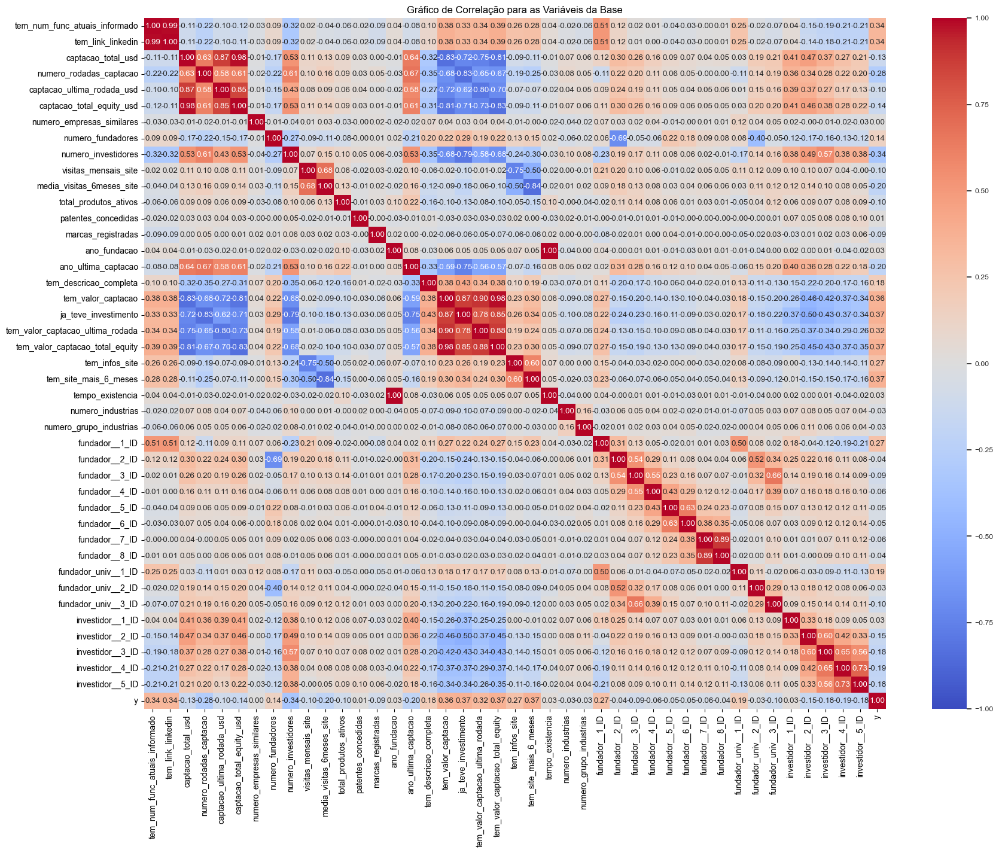

In [126]:
# Numeric Correlation (Pearson)
numeric_columns = data_corr.select_dtypes(include=[np.number]).columns
correlation_matrix = data_corr[numeric_columns].apply(lambda x : pd.factorize(x)[0]).corr(method='pearson', min_periods=1).round(2)

fig, ax = plt.subplots(figsize=(20, 15))
plt.grid(False)
sns.set(font_scale=0.8)

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1, ax=ax)
plt.title('Gráfico de Correlação para as Variáveis da Base', fontsize=12)
plt.savefig('correlacoes', dpi=300, bbox_inches = "tight")
plt.show()

In [127]:
# Assuming data_corr is your original DataFrame and 'y' is your response variable
# Ensure 'y' is included in the data_corr DataFrame
if 'y' not in data_corr.columns:
    raise ValueError("Response variable 'y' not found in the DataFrame")

# Select numeric columns including 'y'
numeric_columns = data_corr.select_dtypes(include=[np.number]).columns
if 'y' not in numeric_columns:
    raise ValueError("Response variable 'y' is not numeric or is missing")

# Compute correlation matrix
correlation_matrix = data_corr[numeric_columns].apply(lambda x: pd.factorize(x)[0]).corr(method='pearson', min_periods=1).round(2)

# Extract correlation values with 'y'
correlation_with_y = correlation_matrix['y'].drop('y')  # Drop the correlation of 'y' with itself

# Filter features with correlation >= 0.1
features_with_high_corr = correlation_with_y[abs(correlation_with_y) >= 0.1]

# Print the features with correlation >= 0.1
print("Features with correlation >= 0.1 with the response variable 'y':")
for feature, corr_value in features_with_high_corr.items():
    print(f"{feature}: {corr_value:.2f}")

Features with correlation >= 0.1 with the response variable 'y':
tem_num_func_atuais_informado: 0.34
tem_link_linkedin: 0.34
captacao_total_usd: -0.13
numero_rodadas_captacao: -0.28
captacao_ultima_rodada_usd: -0.10
captacao_total_equity_usd: -0.14
numero_fundadores: 0.14
numero_investidores: -0.34
visitas_mensais_site: -0.10
media_visitas_6meses_site: -0.20
total_produtos_ativos: -0.10
ano_ultima_captacao: -0.20
tem_descricao_completa: 0.18
tem_valor_captacao: 0.36
ja_teve_investimento: 0.37
tem_valor_captacao_ultima_rodada: 0.32
tem_valor_captacao_total_equity: 0.37
tem_infos_site: 0.27
tem_site_mais_6_meses: 0.37
fundador__1_ID: 0.27
fundador_univ__1_ID: 0.19
fundador_univ__3_ID: -0.10
investidor__2_ID: -0.15
investidor__3_ID: -0.18
investidor__4_ID: -0.19
investidor__5_ID: -0.18


In [128]:
dataset_modeling.select_dtypes(exclude='number').nunique()

descricao_modelagem          2508
faixa_funcionarios             10
localizacao                   299
estagio_investimento            9
industria_principal           300
grupo_industria_principal      43
dtype: int64

In [129]:
# Fazer o one-hot encoding das colunas categóricas para que elas possam ser lidas pelo modelo 

categorical_columns = [
                       'faixa_funcionarios',
                       'localizacao',
                       'estagio_investimento',
                       'industria_principal',
                       'grupo_industria_principal'
                      ]


dataset_encoded = pd.get_dummies(dataset_modeling[categorical_columns], prefix=categorical_columns, prefix_sep='__')

# Concatenate the original DataFrame with the new one-hot encoded columns
dataset_combined = pd.concat([dataset_modeling, dataset_encoded], axis=1)

In [130]:
# Inicializar o dicionário para armazenar o mapeamento
dummy_mapping = {}

# Iterar pelas colunas categóricas originais
for col in categorical_columns:
    # Filtrar as colunas que começam com o nome da coluna original
    dummy_vars = [c for c in dataset_encoded.columns if c.startswith(col + '__')]
    
    # Adicionar ao dicionário
    dummy_mapping[col] = dummy_vars


# Separar o dataset em duas bases. Uma para treinamento e outra para teste do modelo depois de validado.

In [132]:
# Separar o dataset em uma base com as variáveis independentes (X) e outra com a variável resposta (y).

X_base = dataset_combined.drop('y', axis=1) 
Y_base = dataset_combined['y']

In [133]:
object_columns = X_base.select_dtypes(include='object').columns.tolist()
object_columns

['descricao_modelagem',
 'faixa_funcionarios',
 'localizacao',
 'estagio_investimento',
 'industria_principal',
 'grupo_industria_principal']

In [134]:
# Separar 20% da base de treinamento para serem testadas como dados novos e totalmente desconhecidos do modelo.

X_main, X_holdout, Y_main, Y_holdout = train_test_split(X_base, Y_base, test_size=0.2, stratify=Y_base, random_state=42)

In [135]:
# Reunir as variáveis independentes e resposta das duas bases para fazer os últimos ajustes de inserção de dados faltantes.
# X_y_main será a base para treino e teste do modelo
# X_y_holdout será a base com dados novos para testes depoois da validação e otimização do modelo

X_y_main = pd.concat([X_main, Y_main], axis=1)

X_y_holdout = pd.concat([X_holdout, Y_holdout], axis=1)

In [136]:
X_y_holdout.to_csv('X_y_holdout.csv')

In [242]:
X_y_holdout.info()

<class 'pandas.core.frame.DataFrame'>
Index: 502 entries, 1758 to 1215
Columns: 717 entries, ID_empresa to y
dtypes: bool(661), float64(13), int32(2), int64(35), object(6)
memory usage: 543.7+ KB


In [243]:
X_y_main.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2007 entries, 1685 to 1446
Columns: 717 entries, ID_empresa to y
dtypes: bool(661), float64(13), int32(2), int64(35), object(6)
memory usage: 2.1+ MB


# Fazer os últimos preenchimentos de dados faltantes separadamente nas bases de treino e teste para que não haja vazamento de dados e não gere overfitting.

In [245]:
# Função que finaliza os processos de preenchimento de dados faltantes para os datasets.

def process_dataset(dataset, dataset_to_process):
    # Definir uma Função para computar as estatísticas agrupadas considerando apenas os valores não-nulos
    def compute_group_statistic(df, group_col, target_col, statistic='mean'):
        if statistic == 'mean':
            return df.dropna(subset=[target_col]).groupby(group_col)[target_col].mean()
        elif statistic == 'mode':
            return df.dropna(subset=[target_col]).groupby(group_col)[target_col].apply(lambda x: x.mode().iloc[0] if not x.mode().empty else x)
        else:
            raise ValueError("Unsupported statistic. Use 'mean' or 'mode'.")

    # Definição de uma função generalista para o preenchimento dos dados faltantes com o grupo estatístico correspondente 
    def fill_group_na_with_statistic(row, group_col, target_col, stats):
        if pd.isna(row[target_col]):
            return stats.get(row[group_col], row[target_col])
        return row[target_col]

    # Função Geral para preenchimento dos dados faltantes de qualquer coluna especificada na base df_resultado baseado nas estatísticas da base df_base
    def fill_na_with_group_statistic(df_base, df_resultado, group_col, target_col, statistic='mean'):
        stats = compute_group_statistic(df_base, group_col, target_col, statistic)
        df_resultado[target_col] = df_resultado.apply(fill_group_na_with_statistic, axis=1, args=(group_col, target_col, stats))
        # Fill remaining NaN values with the overall statistic considering only non-null values from df_base
        if statistic == 'mean':
            overall_stat = df_base[target_col].dropna().mean()
        elif statistic == 'mode':
            overall_stat = df_base[target_col].dropna().mode().iloc[0]
        df_resultado[target_col] = df_resultado[target_col].fillna(overall_stat)
        return df_resultado

    # Definição das variáveis a serem preenchidas com as Medianas
    fill_columns_with_medians = [
        'numero_rodadas_captacao',
        'numero_fundadores',
        'numero_empresas_similares',
        'numero_investidores',
        'total_produtos_ativos'
    ]
    for col in fill_columns_with_medians:
        dataset_to_process[col] = dataset_to_process[col].fillna(dataset[col].median())

    # Preenchimento com base em estatísticas de agrupamentos
    fill_specs = [
        ('grupo_industria_principal', 'captacao_total_usd', 'mean'),
        ('industria_principal', 'captacao_ultima_rodada_usd', 'mean'),
        ('industria_principal', 'captacao_total_equity_usd', 'mean'),
        ('industria_principal', 'visitas_mensais_site', 'mean'),
        ('industria_principal', 'media_visitas_6meses_site', 'mean'),
        ('industria_principal', 'ano_ultima_captacao', 'mode')
    ]

    for group_col, fill_col, stat in fill_specs:
        dataset_to_process = fill_na_with_group_statistic(dataset, dataset_to_process, group_col, fill_col, stat)

    # Transformar os valores de ano de captação em inteiros
    dataset_to_process['ano_ultima_captacao'] = pd.to_numeric(dataset_to_process['ano_ultima_captacao']).astype(int)

    # Remover as colunas originais do one-hot encoding depois de termos preenchido os dados faltantes todos
    columns_to_drop = [
        'industria_principal',
        'faixa_funcionarios',      
        'grupo_industria_principal',
        'localizacao',
        'estagio_investimento',
    ]
    dataset_to_process = dataset_to_process.drop(columns=columns_to_drop)

    return dataset_to_process


In [246]:
processed_X_y_main = process_dataset(dataset, X_y_main)
processed_X_y_holdout = process_dataset(dataset, X_y_holdout)

In [247]:
processed_X_y_holdout.to_csv('processed_X_y_holdout.csv')

# Verificar o balanceamento das classes.

Sem Sucesso: 1675
Sucesso: 332
Proporção: 5.0452 :1


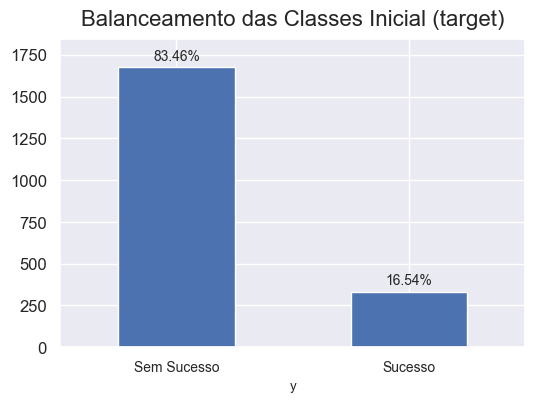

In [249]:
# Count the target values
target_count = processed_X_y_main.y.value_counts()
total = target_count.sum()

# Print the class counts and proportion
print('Sem Sucesso:', target_count[0])
print('Sucesso:', target_count[1])
print('Proporção:', round(target_count[0] / target_count[1], 4), ':1')

# Plot the bar chart
ax = target_count.plot(figsize=(6, 4), kind='bar', fontsize=12)

# Set the title
plt.title(label='Balanceamento das Classes Inicial (target)', fontsize=16, pad=10)

# Expanding the y-axis limit to add space for annotations
max_height = max(target_count) * 1.1  # Increase 10% of max value for top space
ax.set_ylim(0, max_height)

# Custom xtick labels
xtick_labels = ['Sem Sucesso', 'Sucesso']
ax.set_xticklabels(xtick_labels, rotation=0, fontsize=10)

# Annotate percentages
for i in ax.containers:
    for bar in i:
        height = bar.get_height()
        ax.annotate(f'{(height / total * 100):.2f}%',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=10)

plt.savefig('./saved_plots/classes_balance_inicial.png', dpi=300, bbox_inches = "tight")

plt.show()


# Separar o dataset principal de treinamento em treino e teste para a modelagem.

In [251]:
# Separar o dataset em uma base com as variáveis independentes (X) e outra com a variável resposta (y).

X = processed_X_y_main.drop('y', axis=1) 
y = processed_X_y_main['y']

In [252]:
# Separar 20% da base de treinamento para serem testadas como dados novos e totalmente desconhecidos do modelo.

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [296]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1605 entries, 805 to 50
Columns: 711 entries, ID_empresa to grupo_industria_principal__Travel and Tourism
dtypes: bool(661), float64(12), int32(3), int64(34), object(1)
memory usage: 1.6+ MB


In [298]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 402 entries, 255 to 1303
Columns: 711 entries, ID_empresa to grupo_industria_principal__Travel and Tourism
dtypes: bool(661), float64(12), int32(3), int64(34), object(1)
memory usage: 415.0+ KB


# Transformar a coluna de descrição em dados vetorizados para serem usados pelo modelo.

In [254]:
tqdm.pandas()
start_time = time.time()

# Initialize the vectorizer
vectorizer = TfidfVectorizer()

# Fit and transform the cleaned_description column for the training set
X_train_tfidf = vectorizer.fit_transform(X_train['descricao_modelagem'])

# Transform the cleaned_description column for the testing set
X_test_tfidf = vectorizer.transform(X_test['descricao_modelagem'])

# Convert the TF-IDF matrices to DataFrames
X_train_tfidf_df = pd.DataFrame(X_train_tfidf.toarray(), columns=vectorizer.get_feature_names_out(), index=X_train.index)
X_test_tfidf_df = pd.DataFrame(X_test_tfidf.toarray(), columns=vectorizer.get_feature_names_out(), index=X_test.index)

# Drop the original cleaned_description column from the training and testing sets
X_train_vect = X_train.drop(columns=['descricao_modelagem'])
X_test_vect = X_test.drop(columns=['descricao_modelagem'])

# Concatenate the TF-IDF features with the remaining features
X_train_vect = pd.concat([X_train_vect.reset_index(drop=True), X_train_tfidf_df.reset_index(drop=True)], axis=1)
X_test_vect = pd.concat([X_test_vect.reset_index(drop=True), X_test_tfidf_df.reset_index(drop=True)], axis=1)

end_time = time.time()
print(f"Tempo total de execução: {end_time - start_time:.2f} segundos")# Aplicar a função de padronização com tqdm

Tempo total de execução: 0.15 segundos


In [255]:
y_test.value_counts()

y
0    336
1     66
Name: count, dtype: int64

# Vamos tentar melhorar o balanceamento das classes usando o ADASYN

In [257]:
print("Divisão das Classes original %s" % Counter(y))

adasyn = ADASYN(sampling_strategy=0.5, random_state=42)
X_ada, y_ada = adasyn.fit_resample(X_train_vect, y_train)

print('Divisão das Classes ajustada %s' % Counter(y_ada))

Divisão das Classes original Counter({0: 1675, 1: 332})
Divisão das Classes ajustada Counter({0: 1339, 1: 601})


Sem Sucesso: 1339
Sucesso: 601
Proporção: 2.228 :1


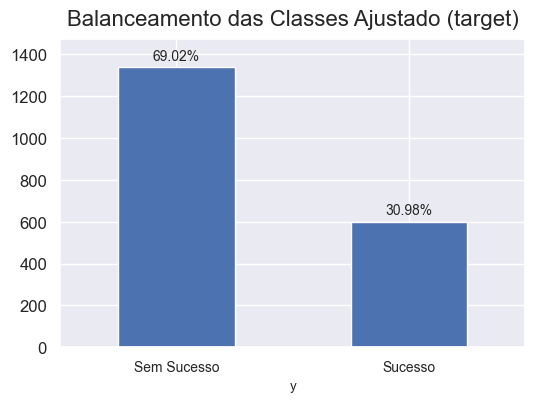

In [258]:
# Vamos verificar o balanceamento agora.
gg_ada = pd.concat([X_ada, y_ada], axis=1)
target_count = gg_ada.y.value_counts()
total = target_count.sum()

# Print the class counts and proportion
print('Sem Sucesso:', target_count[0])
print('Sucesso:', target_count[1])
print('Proporção:', round(target_count[0] / target_count[1], 4), ':1')

# Plot the bar chart
ax = target_count.plot(figsize=(6, 4), kind='bar', fontsize=12)

# Set the title
plt.title(label='Balanceamento das Classes Ajustado (target)', fontsize=16, pad=10)

# Expanding the y-axis limit to add space for annotations
max_height = max(target_count) * 1.1  # Increase 10% of max value for top space
ax.set_ylim(0, max_height)

# Custom xtick labels
xtick_labels = ['Sem Sucesso', 'Sucesso']
ax.set_xticklabels(xtick_labels, rotation=0, fontsize=10)

# Annotate percentages
for i in ax.containers:
    for bar in i:
        height = bar.get_height()
        ax.annotate(f'{(height / total * 100):.2f}%',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=10)

plt.savefig('./saved_plots/bal_classes_adj.png', dpi=300, bbox_inches = "tight")

plt.show()


In [277]:
X_train_final = X_ada.copy()
y_train_final = y_ada.copy()

In [278]:
X_train_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1940 entries, 0 to 1939
Columns: 4886 entries, ID_empresa to ônibus
dtypes: bool(661), float64(4188), int32(3), int64(34)
memory usage: 63.7 MB


In [279]:
X_train_check = X_train_final.drop(columns='ID_empresa', axis=1)

In [280]:
X_test_check = X_test_vect.drop(columns='ID_empresa', axis=1)

In [281]:
X_train_check.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1940 entries, 0 to 1939
Columns: 4885 entries, tem_num_func_atuais_informado to ônibus
dtypes: bool(661), float64(4188), int32(3), int64(33)
memory usage: 63.7 MB


In [294]:
X_test_check.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 402 entries, 0 to 401
Columns: 4885 entries, tem_num_func_atuais_informado to ônibus
dtypes: bool(661), float64(4188), int32(3), int64(33)
memory usage: 13.2 MB


# Criar uma função para gerar a matriz de confusão e a curva ROC de cada modelo.

In [283]:
def plot_metrics(y_test, y_pred, model, X_test):
    # Calculate the confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    
    # Create subplots for the confusion matrix and ROC curve
    fig, axs = plt.subplots(ncols=2, figsize=(12, 4))
    
    # Plot the confusion matrix
    sns.set(font_scale=1.1)  # Adjust the font scale of the heatmap
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Não Sucesso', 'Sucesso'])
    disp.plot(cmap='YlGnBu', ax=axs[0], values_format='d')
    axs[0].set_xlabel('Valor Predito', fontsize=10)
    axs[0].set_ylabel('Valor Real', fontsize=10)
    axs[0].set_title('Matriz de Confusão - Modelo', fontsize=10, pad=10)
    axs[0].grid(False)
    
    # Plot the ROC curve
    sns.set(font_scale=1)  # Adjust the font scale of the plot
    RocCurveDisplay.from_estimator(model, X_test, y_test, ax=axs[1], name='ROC Curve')
    axs[1].set_title('Curva ROC - Modelo', fontsize=10, pad=10)
    
    # Save the plot
    filename = f'cm_roc_{model.__class__.__name__}.png'
    os.makedirs('./saved_plots', exist_ok=True)
    plt.savefig(f'./saved_plots/{filename}', dpi=300, bbox_inches="tight")

    # Display the plots
    plt.tight_layout()
    plt.show()

    # Print statistics
    print(f'Acurácia: {round(accuracy_score(y_test, y_pred) * 100, 2)}%')
    print(f'Precisão: {round(precision_score(y_test, y_pred) * 100, 2)}%')
    print(f'Recall:   {round(recall_score(y_test, y_pred) * 100, 2)}%')
    print(f'F1-Score: {round(f1_score(y_true=y_test, y_pred=y_pred, average="weighted") * 100, 2)}%')

In [284]:
def plot_metrics_with_proba(y_test, y_pred, model, X_test):
    # Ensure y_test and y_pred are binary labels (0 and 1)
    unique_y_test = np.unique(y_test)
    unique_y_pred = np.unique(y_pred)
    
    if not np.array_equal(unique_y_test, [0, 1]) and not np.array_equal(unique_y_test, [0]) and not np.array_equal(unique_y_test, [1]):
        raise ValueError("y_test must only contain binary labels (0 and 1).")
    
    if not np.array_equal(unique_y_pred, [0, 1]) and not np.array_equal(unique_y_pred, [0]) and not np.array_equal(unique_y_pred, [1]):
        raise ValueError("y_pred must only contain binary labels (0 and 1).")
    
    # Calculate the confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    
    # Create subplots for the confusion matrix and ROC curve
    fig, axs = plt.subplots(ncols=2, figsize=(12, 4))
    
    # Plot the confusion matrix
    sns.set(font_scale=1.1)  # Adjust the font scale of the heatmap
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Não Sucesso', 'Sucesso'])
    disp.plot(cmap='YlGnBu', ax=axs[0], values_format='d')
    axs[0].set_xlabel('Valor Predito', fontsize=10)
    axs[0].set_ylabel('Valor Real', fontsize=10)
    axs[0].set_title('Matriz de Confusão - Modelo', fontsize=10, pad=10)
    axs[0].grid(False)
    
    # Plot the ROC curve using RocCurveDisplay.from_estimator
    sns.set(font_scale=1)  # Adjust the font scale of the plot
    RocCurveDisplay.from_estimator(model, X_test, y_test, ax=axs[1], name='ROC Curve')
    axs[1].set_title('Curva ROC - Modelo', fontsize=10, pad=10)
    
    # Display the plots
    plt.tight_layout()
    plt.show()
    
    # Print statistics
    print(f'Acurácia: {round(accuracy_score(y_test, y_pred) * 100, 2)}%')
    print(f'Precisão: {round(precision_score(y_test, y_pred) * 100, 2)}%')
    print(f'Recall:   {round(recall_score(y_test, y_pred) * 100, 2)}%')
    print(f'F1-Score: {round(f1_score(y_true=y_test, y_pred=y_pred, average="weighted") * 100, 2)}%')


# Treinar o modelo baseline com Regressão Logística

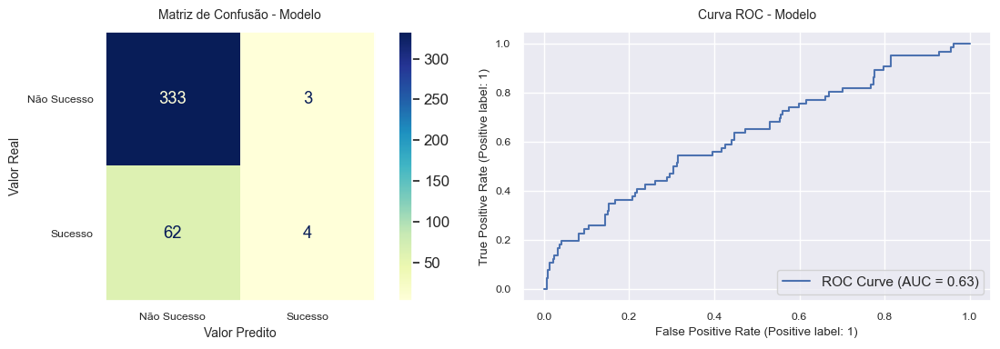

Acurácia: 83.83%
Precisão: 57.14%
Recall:   6.06%
F1-Score: 77.95%


In [155]:
# Vamos testar o primeiro modelo, de Regressão Logística.
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(random_state=42).fit(X_train_final, y_train_final)
y_pred_lr = lr.predict(X_test_vect)

# Aplicar a função de geração da matrix de confusão e curva ROC.
plot_metrics(y_test, y_pred_lr, lr, X_test_vect)

# Treinar o modelo com SVM.

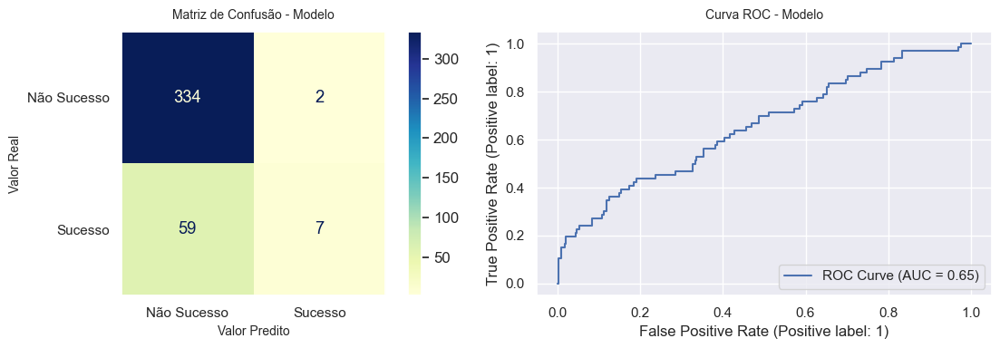

Acurácia: 84.83%
Precisão: 77.78%
Recall:   10.61%
F1-Score: 79.65%


In [157]:
svm = SVC(C=15.0, random_state=42)
svm.fit(X_train_final, y_train_final)

y_pred_svm = svm.predict(X_test_vect)

# Aplicar a função de geração da matrix de confusão e curva ROC.
plot_metrics(y_test, y_pred_svm, svm, X_test_vect)

# Treinar o modelo com KNN

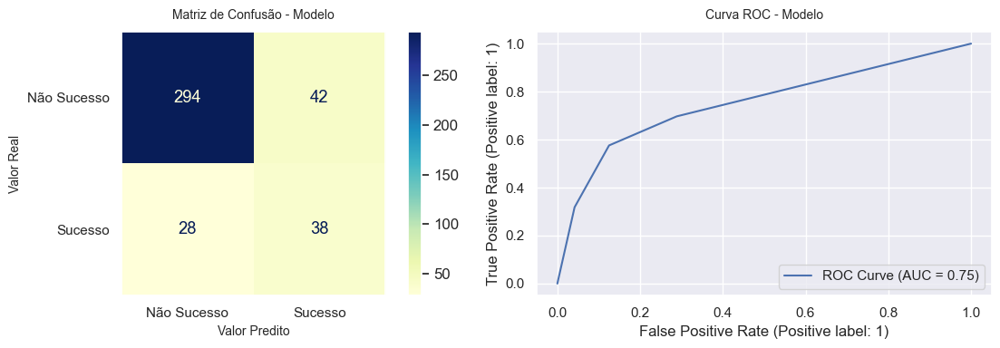

Acurácia: 82.59%
Precisão: 47.5%
Recall:   57.58%
F1-Score: 83.24%


In [159]:
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train_final, y_train_final)
y_pred_knn = knn.predict(X_test_vect)

# Aplicar a função de geração da matrix de confusão e curva ROC.
plot_metrics(y_test, y_pred_knn, knn, X_test_vect)

# Treinar o modelo com GaussianNB

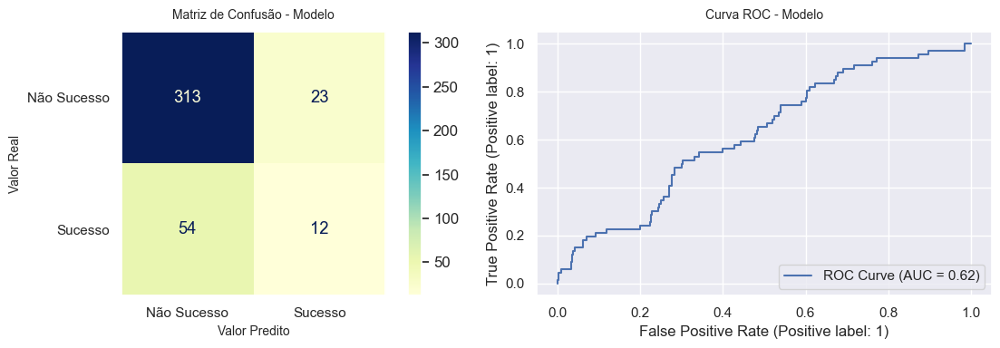

Acurácia: 80.85%
Precisão: 34.29%
Recall:   18.18%
F1-Score: 78.33%


In [161]:
nb = GaussianNB()
nb.fit(X_train_final, y_train_final)
y_pred_nb = nb.predict(X_test_vect)

# Aplicar a função de geração da matrix de confusão e curva ROC.
plot_metrics(y_test, y_pred_nb, nb, X_test_vect)

# Treinar o modelo com Decision Tree

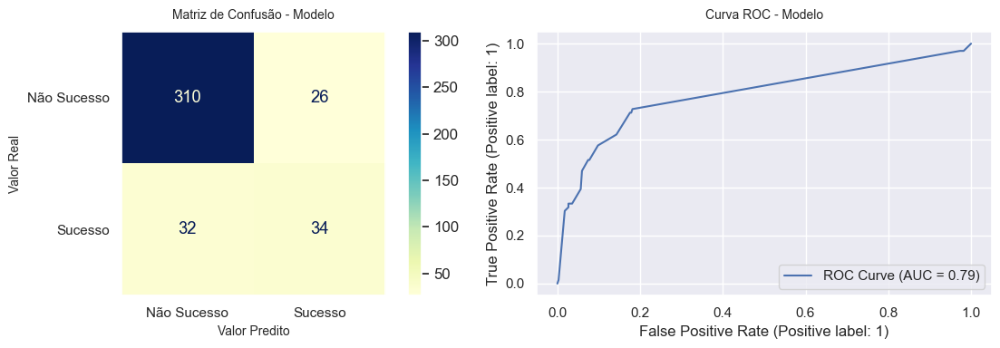

Acurácia: 85.57%
Precisão: 56.67%
Recall:   51.52%
F1-Score: 85.29%


In [163]:
dtree = DecisionTreeClassifier(max_depth=5, random_state=42)
dtree.fit(X_train_final, y_train_final)
y_pred_dtree = dtree.predict(X_test_vect)

# Aplicar a função de geração da matrix de confusão e curva ROC.
plot_metrics(y_test, y_pred_dtree, dtree, X_test_vect)

# Treinar o modelo com XG Boost

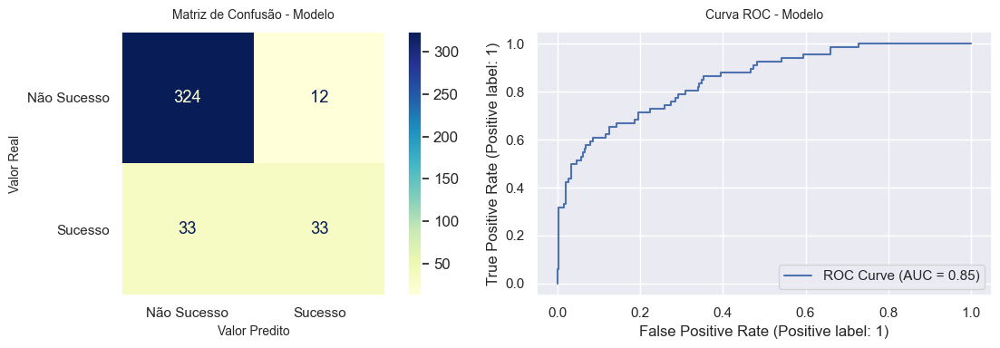

Acurácia: 88.81%
Precisão: 73.33%
Recall:   50.0%
F1-Score: 87.92%


In [165]:
modelXG = XGBClassifier(random_state=42)
modelXG.fit(X_train_final, y_train_final)
y_pred_XGB = modelXG.predict(X_test_vect)

# Aplicar a função de geração da matrix de confusão e curva ROC.
plot_metrics(y_test, y_pred_XGB, modelXG, X_test_vect)

# Treinar o modelo com Random Forest

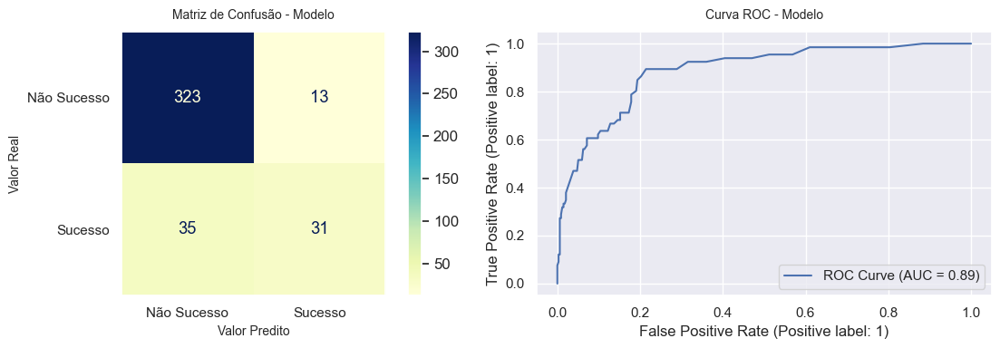

Acurácia: 88.06%
Precisão: 70.45%
Recall:   46.97%
F1-Score: 87.05%


In [167]:
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train_final, y_train_final)
y_pred_rf = rf.predict(X_test_vect)

# Aplicar a função de geração da matrix de confusão e curva ROC.
plot_metrics(y_test, y_pred_rf, rf, X_test_vect)

# Comparar as curvas ROCs de todos os modelos e construir uma tabela com os valores de avaliação de cada um.

Plotting ROC Curves: 100%|██████████| 7/7 [00:03<00:00,  1.90it/s]


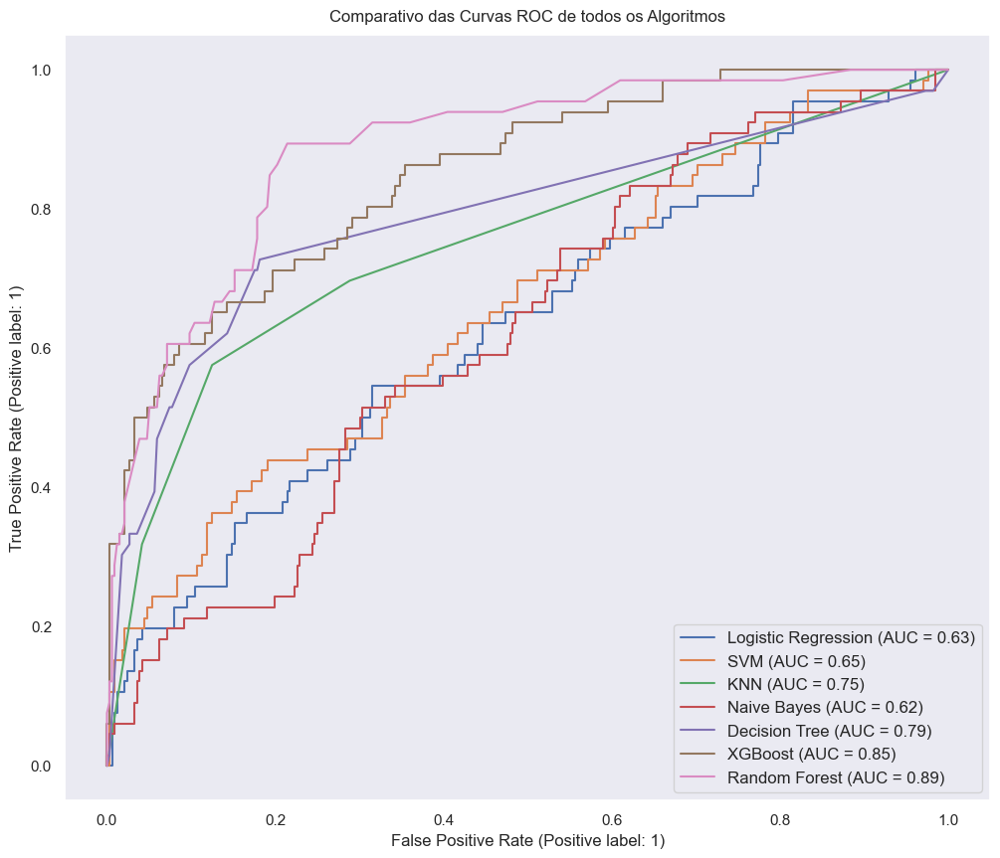

In [169]:
fig, ax = plt.subplots(figsize=(12, 10))
plt.grid(False)
sns.set(font_scale=1.1)
classifiers = [lr, svm, knn, nb, dtree, modelXG, rf]
classifier_names = ['Logistic Regression', 'SVM', 'KNN', 'Naive Bayes', 'Decision Tree', 'XGBoost', 'Random Forest']

for clf, name in tqdm(zip(classifiers, classifier_names), total=len(classifiers), desc="Plotting ROC Curves"):
    RocCurveDisplay.from_estimator(clf, X_test_vect, y_test, ax=ax, name=name)


ax.set_title(label='Comparativo das Curvas ROC de todos os Algoritmos', fontsize=12, pad=10)

plt.savefig('./saved_plots/roc_curves.png', dpi=300, bbox_inches = "tight")



In [170]:
# Calculate statistics for each model
stats_models = {
    'Model': ['Logistic Regression', 'SVM', 'KNN', 'Naive Bayes', 'Decision Tree', 'XGBoost', 'Random Forest'],
    'Accuracy (%)': [
        '{:.2f}'.format(accuracy_score(y_test, y_pred_lr) * 100),
        '{:.2f}'.format(accuracy_score(y_test, y_pred_svm) * 100),
        '{:.2f}'.format(accuracy_score(y_test, y_pred_knn) * 100),
        '{:.2f}'.format(accuracy_score(y_test, y_pred_nb) * 100),
        '{:.2f}'.format(accuracy_score(y_test, y_pred_dtree) * 100),
        '{:.2f}'.format(accuracy_score(y_test, y_pred_XGB) * 100),
        '{:.2f}'.format(accuracy_score(y_test, y_pred_rf) * 100)
    ],
    'Precision (%)': [
        '{:.2f}'.format(precision_score(y_test, y_pred_lr) * 100),
        '{:.2f}'.format(precision_score(y_test, y_pred_svm) * 100),
        '{:.2f}'.format(precision_score(y_test, y_pred_knn) * 100),
        '{:.2f}'.format(precision_score(y_test, y_pred_nb) * 100),
        '{:.2f}'.format(precision_score(y_test, y_pred_dtree) * 100),
        '{:.2f}'.format(precision_score(y_test, y_pred_XGB) * 100),
        '{:.2f}'.format(precision_score(y_test, y_pred_rf) * 100)
    ],
    'Recall (%)': [
        '{:.2f}'.format(recall_score(y_test, y_pred_lr) * 100),
        '{:.2f}'.format(recall_score(y_test, y_pred_svm) * 100),
        '{:.2f}'.format(recall_score(y_test, y_pred_knn) * 100),
        '{:.2f}'.format(recall_score(y_test, y_pred_nb) * 100),
        '{:.2f}'.format(recall_score(y_test, y_pred_dtree) * 100),
        '{:.2f}'.format(recall_score(y_test, y_pred_XGB) * 100),
        '{:.2f}'.format(recall_score(y_test, y_pred_rf) * 100)
    ],
    'F1-Score (%)': [
        '{:.2f}'.format(f1_score(y_test, y_pred_lr, average="weighted") * 100),
        '{:.2f}'.format(f1_score(y_test, y_pred_svm, average="weighted") * 100),
        '{:.2f}'.format(f1_score(y_test, y_pred_knn, average="weighted") * 100),
        '{:.2f}'.format(f1_score(y_test, y_pred_nb, average="weighted") * 100),
        '{:.2f}'.format(f1_score(y_test, y_pred_dtree, average="weighted") * 100),
        '{:.2f}'.format(f1_score(y_test, y_pred_XGB, average="weighted") * 100),
        '{:.2f}'.format(f1_score(y_test, y_pred_rf, average="weighted") * 100)
    ]
}

# Create DataFrame
df_stats = pd.DataFrame(stats_models)

# Use tabulate to create a formatted table
table = tabulate(df_stats, headers="keys", tablefmt="plain", showindex=False, numalign="center", stralign="center")

# Adicionar uma linha em branco entre o cabeçalho e o corpo da tabela
lines = table.splitlines()
header = lines[0]  # Cabeçalho
body = lines[1:]   # Corpo da tabela

# Adicionar uma linha em branco entre o cabeçalho e o corpo
table_with_space = header + "\n\n" + "\n".join(body)

# Display the table
print(table_with_space)

       Model          Accuracy (%)    Precision (%)    Recall (%)    F1-Score (%)

Logistic Regression      83.83            57.14           6.06          77.95
        SVM              84.83            77.78          10.61          79.65
        KNN              82.59            47.5           57.58          83.24
    Naive Bayes          80.85            34.29          18.18          78.33
   Decision Tree         85.57            56.67          51.52          85.29
      XGBoost            88.81            73.33            50           87.92
   Random Forest         88.06            70.45          46.97          87.05


# Fazendo os testes básicos, percebemos que o XGBoost e o Random Forest foram os algoritmos que trouxeram os melhores resultados gerais, mas o SVM se mostrou mais eficiente em Precisão e a Regressão Logística apresentou os melhores valores de Recall. Portanto, vamos trabalhar os hiperparâmetros desses modelos para tentar melhorar ainda mais os resultados.

In [172]:
# # Define your LogisticRegression model
# modelLR = LogisticRegression()

# # Define the parameter grid
# param_grid_lr = {
#     'penalty': ['l1', 'l2', 'elasticnet', 'none'],  # Regularization type
#     'C': [0.01, 0.1, 1, 10, 100],                  # Inverse of regularization strength
#     'solver': ['liblinear', 'saga'],               # Algorithm to use in the optimization problem
#     'max_iter': [100, 200, 300],                   # Maximum number of iterations
# }

# # Initialize GridSearchCV
# grid_search_lr = GridSearchCV(estimator=modelLR,
#                            param_grid=param_grid_lr,
#                            scoring='precision',  # Use appropriate scoring method
#                            cv=5,                 # Number of cross-validation folds
#                            verbose=1,            # Print progress messages
#                            n_jobs=-1)            # Use all available CPU cores

# # Fit GridSearchCV
# grid_search_lr.fit(X_train_final, y_train_final)

# # Get best parameters and best estimator
# best_params_lr = grid_search_lr.best_params_
# best_estimator_lr = grid_search_lr.best_estimator_

# # Predict on test set using the best estimator
# y_pred = best_estimator_lr.predict(X_test_vect)

# # Optionally, you can print the best parameters found
# print("Best Parameters:", best_params_lr)


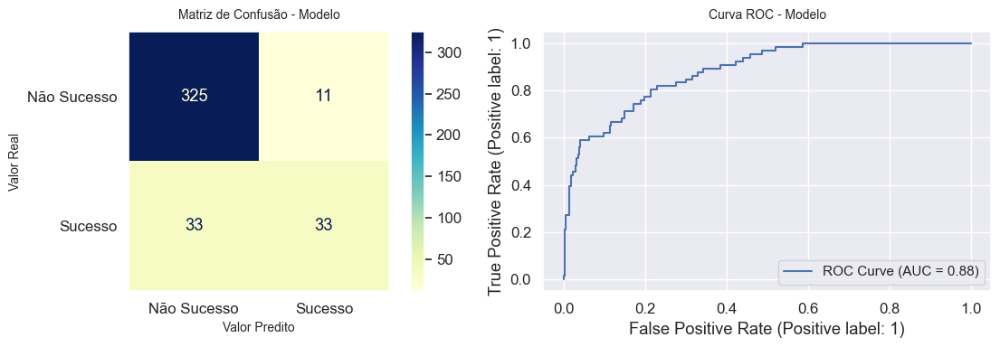

Acurácia: 89.05%
Precisão: 75.0%
Recall:   50.0%
F1-Score: 88.13%


In [173]:
# Vamos testar o primeiro modelo, de Regressão Logística.
from sklearn.linear_model import LogisticRegression
lr_ajustado = LogisticRegression(C=1, max_iter=200, penalty='l1', solver='liblinear', random_state=42).fit(X_train_final, y_train_final)
y_pred_lr_ajustado = lr_ajustado.predict(X_test_vect)

# Aplicar a função de geração da matrix de confusão e curva ROC.
plot_metrics(y_test, y_pred_lr_ajustado, lr_ajustado, X_test_vect)

In [174]:
# # Define your RandomForest model
# modelRF = RandomForestClassifier()

# # Define the parameter grid
# param_grid = {
#     'n_estimators': [100, 200, 300],  # Number of trees in the forest
#     'max_depth': [None, 10, 20, 30],  # Maximum depth of the tree
#     'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
#     'min_samples_leaf': [1, 2, 4],    # Minimum number of samples required to be at a leaf node
#     'bootstrap': [True, False],       # Whether bootstrap samples are used when building trees
# }

# # Initialize GridSearchCV
# grid_search = GridSearchCV(estimator=modelRF,
#                            param_grid=param_grid,
#                            scoring='precision',  # Use appropriate scoring method
#                            cv=5,                # Number of cross-validation folds
#                            verbose=1,           # Print progress messages
#                            n_jobs=-1)           # Use all available CPU cores

# # Fit GridSearchCV
# grid_search.fit(X_train_final, y_train_final)

# # Get best parameters and best estimator
# best_params = grid_search.best_params_
# best_estimator = grid_search.best_estimator_

# # Predict on test set using the best estimator
# y_pred = best_estimator.predict(X_test_vect)

# # Optionally, you can print the best parameters found
# print("Best Parameters:", best_params)

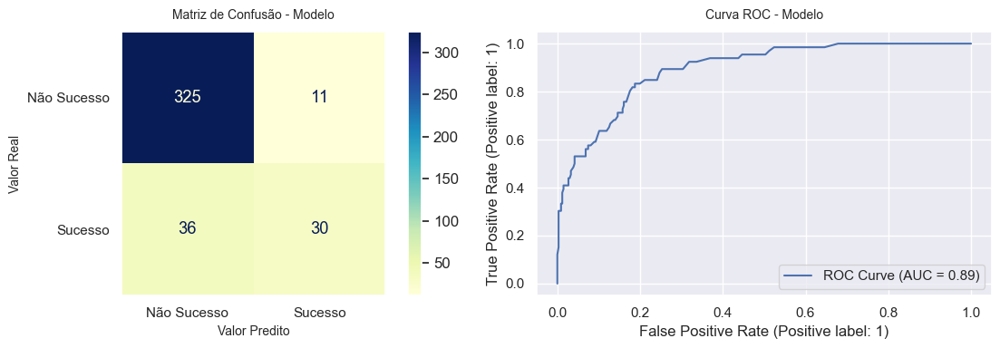

Acurácia: 88.31%
Precisão: 73.17%
Recall:   45.45%
F1-Score: 87.15%


In [175]:
rf_ajustado = RandomForestClassifier(n_estimators=200, max_depth=None, bootstrap=False, min_samples_leaf=1, min_samples_split=2, random_state=42)
rf_ajustado.fit(X_train_final, y_train_final)
y_pred_rf_ajustado = rf_ajustado.predict(X_test_vect)

# Aplicar a função de geração da matrix de confusão e curva ROC.
plot_metrics(y_test, y_pred_rf_ajustado, rf_ajustado, X_test_vect)

In [176]:
# # Define your XGBoost model
# modelXGB = XGBClassifier()

# # Define the parameter grid
# param_grid = {
# #    'n_estimators': [100, 200, 300],  # Number of boosting rounds
# #    'max_depth': [3, 6, 10],  # Maximum depth of a tree
# #    'learning_rate': [0.01, 0.1, 0.3],  # Step size shrinkage
# #    'subsample': [0.8, 1.0],  # Subsample ratio of the training instances
#     'colsample_bytree': [0.8, 1.0],  # Subsample ratio of columns when constructing each tree
#     'gamma': [0, 0.1, 0.3],  # Minimum loss reduction required to make a further partition on a leaf node
#     'min_child_weight': [1, 3, 5],  # Minimum sum of instance weight (hessian) needed in a child
#     'reg_alpha': [0, 0.1, 0.5],  # L1 regularization term on weights
#     'reg_lambda': [1, 1.5, 2.0],  # L2 regularization term on weights
# }

# # Initialize GridSearchCV
# grid_search = GridSearchCV(estimator=modelXGB,
#                            param_grid=param_grid,
#                            scoring='precision',  # Use appropriate scoring method
#                            cv=5,                # Number of cross-validation folds
#                            verbose=1,           # Print progress messages
#                            n_jobs=-1)           # Use all available CPU cores

# # Fit GridSearchCV
# grid_search.fit(X_train_final, y_train_final)

# # Get best parameters and best estimator
# best_params = grid_search.best_params_
# best_estimator = grid_search.best_estimator_

# # Predict on test set using the best estimator
# y_pred = best_estimator.predict(X_test_vect)

# # Optionally, you can print the best parameters found
# print("Best Parameters:", best_params)

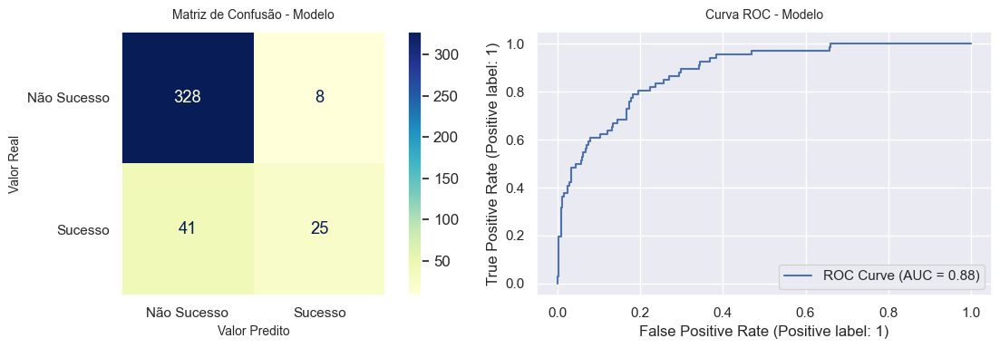

Acurácia: 87.81%
Precisão: 75.76%
Recall:   37.88%
F1-Score: 86.06%


In [177]:
modelXG_ajustado = XGBClassifier(learning_rate=0.01, max_depth=10, n_estimators=100, subsample=0.8, colsample_bytree=0.8, gamma=0.3, min_child_weight=1, reg_alpha=0.1, reg_lambda=1.5, random_state=42)
modelXG_ajustado.fit(X_train_final, y_train_final)
y_pred_XGB_ajustado = modelXG_ajustado.predict(X_test_vect)

# Aplicar a função de geração da matrix de confusão e curva ROC.
plot_metrics(y_test, y_pred_XGB_ajustado, modelXG_ajustado, X_test_vect)

In [178]:
# # Define your SVM model
# modelSVM = SVC()

# # Define the parameter grid
# param_grid = {
#     'C': [0.1, 1, 10, 100],         # Regularization parameter
#     'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],  # Kernel type
#     # 'degree': [2, 3, 4],            # Degree of the polynomial kernel function (ignored by other kernels)
#     # 'gamma': ['scale', 'auto'],     # Kernel coefficient
#     # 'coef0': [0.0, 0.5, 1.0],       # Independent term in kernel function (for poly and sigmoid)
# }

# # Initialize GridSearchCV
# grid_search = GridSearchCV(estimator=modelSVM,
#                            param_grid=param_grid,
#                            scoring='precision',  # Use appropriate scoring method
#                            cv=5,                # Number of cross-validation folds
#                            verbose=1,           # Print progress messages
#                            n_jobs=-1)           # Use all available CPU cores

# # Fit GridSearchCV
# grid_search.fit(X_train_final, y_train_final)

# # Get best parameters and best estimator
# best_params = grid_search.best_params_
# best_estimator = grid_search.best_estimator_

# # Predict on test set using the best estimator
# y_pred = best_estimator.predict(X_test_vect)

# # Optionally, you can print the best parameters found
# print("Best Parameters:", best_params)


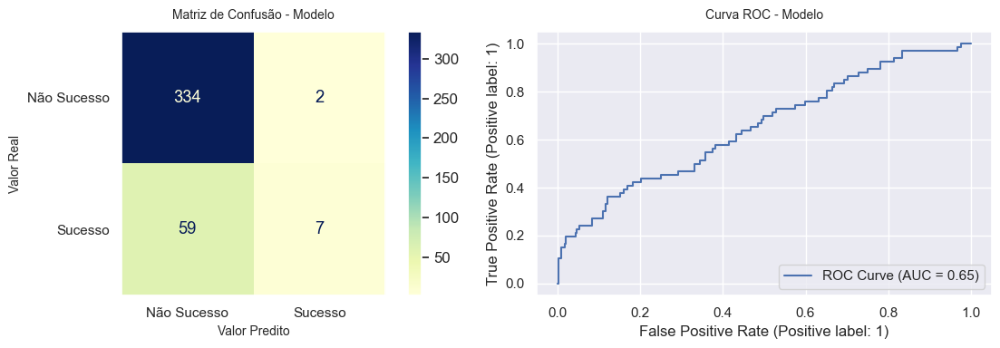

Acurácia: 84.83%
Precisão: 77.78%
Recall:   10.61%
F1-Score: 79.65%


In [179]:
svm_ajustado = SVC(C=16, random_state=42)
svm_ajustado.fit(X_train_final, y_train_final)

y_pred_svm_ajustado = svm_ajustado.predict(X_test_vect)

# Aplicar a função de geração da matrix de confusão e curva ROC.
plot_metrics(y_test, y_pred_svm_ajustado, svm_ajustado, X_test_vect)

In [180]:
# Calculate statistics for each model
stats_models_2 = {
    'Model': ['SVM', 'XGBoost', 'Random Forest'],
    'Accuracy (%)': [
        '{:.2f}'.format(accuracy_score(y_test, y_pred_svm_ajustado) * 100),
        '{:.2f}'.format(accuracy_score(y_test, y_pred_XGB_ajustado) * 100),
        '{:.2f}'.format(accuracy_score(y_test, y_pred_rf_ajustado) * 100)
    ],
    'Precision (%)': [
        '{:.2f}'.format(precision_score(y_test, y_pred_svm_ajustado) * 100),
        '{:.2f}'.format(precision_score(y_test, y_pred_XGB_ajustado) * 100),
        '{:.2f}'.format(precision_score(y_test, y_pred_rf_ajustado) * 100)
    ],
    'Recall (%)': [
        '{:.2f}'.format(recall_score(y_test, y_pred_svm_ajustado) * 100),
        '{:.2f}'.format(recall_score(y_test, y_pred_XGB_ajustado) * 100),
        '{:.2f}'.format(recall_score(y_test, y_pred_rf_ajustado) * 100)
    ],
    'F1-Score (%)': [
        '{:.2f}'.format(f1_score(y_test, y_pred_svm_ajustado, average="weighted") * 100),
        '{:.2f}'.format(f1_score(y_test, y_pred_XGB_ajustado, average="weighted") * 100),
        '{:.2f}'.format(f1_score(y_test, y_pred_rf_ajustado, average="weighted") * 100)
    ]
}

# Create DataFrame
df_stats_2 = pd.DataFrame(stats_models_2)

# Use tabulate to create a formatted table
table_2 = tabulate(df_stats_2, headers="keys", tablefmt="plain", showindex=False, numalign="center", stralign="center")

# Adicionar uma linha em branco entre o cabeçalho e o corpo da tabela
lines = table_2.splitlines()
header = lines[0]  # Cabeçalho
body = lines[1:]   # Corpo da tabela

# Adicionar uma linha em branco entre o cabeçalho e o corpo
table_with_space_2 = header + "\n\n" + "\n".join(body)

# Display the table
print(table_with_space_2)

    Model       Accuracy (%)    Precision (%)    Recall (%)    F1-Score (%)

     SVM           84.83            77.78          10.61          79.65
   XGBoost         87.81            75.76          37.88          86.06
Random Forest      88.31            73.17          45.45          87.15


# Vamos montar um ensemble com os 2 melhores classificadores identificados acima (XG Boost e Random Forest).

In [182]:
# Instanciando os modelos individualmente.
clf_rf = RandomForestClassifier(n_estimators=200, max_depth=None, bootstrap=False, min_samples_leaf=1, min_samples_split=2, random_state=42)
clf_xgb = XGBClassifier(learning_rate=0.01, max_depth=10, n_estimators=100, subsample=0.8, colsample_bytree=0.8, gamma=0.3, min_child_weight=1, reg_alpha=0.1, reg_lambda=1.5, random_state=42)

# Definindo os estimadores selecionados.
estimators = [('rf', clf_rf), ('modelXG', clf_xgb)]

# Criando a avaliação dos classificadores e treinando o modelo.
clf_avg = VotingClassifier(estimators= estimators, voting='soft')
clf_avg.fit(X_train_final, y_train_final)

# Testando e avaliando o desempenho do modelo.
acc_avg = accuracy_score(y_test,  clf_avg.predict(X_test_vect))
pre_avg = precision_score(y_test, clf_avg.predict(X_test_vect))
recl_avg = recall_score(y_test, clf_avg.predict(X_test_vect))
f1_avg = f1_score(y_true=y_test, y_pred=clf_avg.predict(X_test_vect), average="weighted")

print('Acurácia: {:.4f}'.format(acc_avg))
print('Precisão: {:.4f}'.format(pre_avg))
print('Recall:   {:.4f}'.format(recl_avg))
print('F1-Score: {:.4f}'.format(f1_avg))

Acurácia: 0.8781
Precisão: 0.7179
Recall:   0.4242
F1-Score: 0.8648


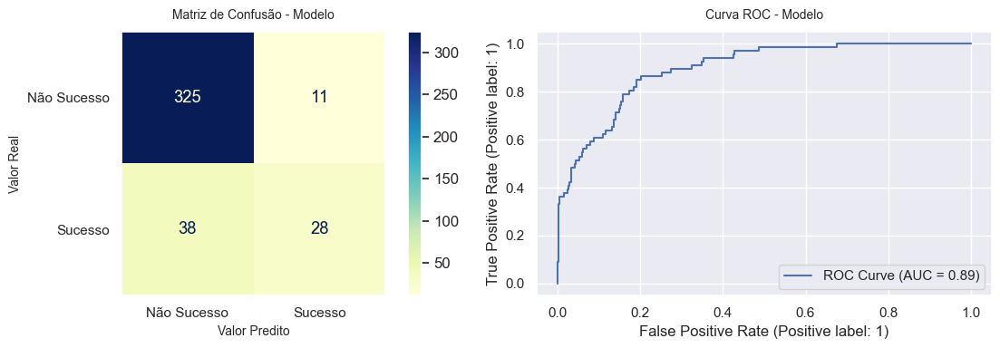

Acurácia: 87.81%
Precisão: 71.79%
Recall:   42.42%
F1-Score: 86.48%


In [183]:
# Call plot_metrics for the ensemble model
y_test_ensemble_1 = y_test
X_test_ensemble_1 = X_test_vect
y_pred_ensemble_1 = clf_avg.predict(X_test_ensemble_1)
plot_metrics(y_test_ensemble_1, y_pred_ensemble_1, clf_avg, X_test_ensemble_1)

In [184]:
estimators = [('rf', clf_rf), ('modelXG', clf_xgb)]

clf_vote = VotingClassifier(estimators=estimators)
clf_vote.fit(X_train_final, y_train_final)

clf_avg = VotingClassifier(estimators=estimators, voting='soft')
clf_avg.fit(X_train_final, y_train_final)

acc_vote = precision_score(y_test, clf_vote.predict(X_test_vect))
acc_avg = precision_score(y_test,  clf_avg.predict(X_test_vect))
print('Voting: {:.4f}, Averaging: {:.4f}'.format(acc_vote, acc_avg))

Voting: 0.8276, Averaging: 0.7179


# Preparação e teste dos dados totalmente desconhecidos do modelo, que haviam sido separados antes da modelagem.

In [186]:
datatest = pd.read_csv('processed_X_y_holdout.csv', index_col=False)
datatest.drop(labels='Unnamed: 0', axis=1, inplace=True)
datatest.reset_index(drop=True, inplace=True)
datatest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 502 entries, 0 to 501
Columns: 712 entries, ID_empresa to y
dtypes: bool(661), float64(12), int64(38), object(1)
memory usage: 524.2+ KB


In [187]:
# Separar o dataset em uma base com as variáveis independentes (X) e outra com a variável resposta (y).

X_validate = datatest.drop('y', axis=1) 
y_validate = datatest['y']

In [188]:
X_validate_check = X_validate.drop(columns='ID_empresa', axis=1)

In [189]:
# Preparação dos dados vetorizados da coluna descricao_modelagem para poderem ser lidos pelo modelo.

tqdm.pandas()
start_time = time.time()

# Initialize the vectorizer
vectorizer_v = TfidfVectorizer()

# Fit and transform the cleaned_description column for the training set
X_train_tfidf_v = vectorizer_v.fit_transform(X_train['descricao_modelagem'])

# Transform the cleaned_description column for the testing set
X_test_tfidf_df_v = vectorizer_v.transform(X_validate['descricao_modelagem'])

# Convert the TF-IDF matrices to DataFrames
X_train_tfidf_df_v = pd.DataFrame(X_train_tfidf_v.toarray(), columns=vectorizer_v.get_feature_names_out(), index=X_train.index)
X_test_tfidf_df_v = pd.DataFrame(X_test_tfidf_df_v.toarray(), columns=vectorizer_v.get_feature_names_out(), index=X_validate.index)

# Drop the original cleaned_description column from the training and testing sets
X_train_v = X_train.drop(columns=['descricao_modelagem'])
X_validate = X_validate.drop(columns=['descricao_modelagem'])

# Concatenate the TF-IDF features with the remaining features
X_train_validate = pd.concat([X_train_v.reset_index(drop=True), X_train_tfidf_df_v.reset_index(drop=True)], axis=1)
X_test_validate = pd.concat([X_validate.reset_index(drop=True), X_test_tfidf_df_v.reset_index(drop=True)], axis=1)

end_time = time.time()
print(f"Tempo total de execução: {end_time - start_time:.2f} segundos")# Aplicar a função de padronização com tqdm

Tempo total de execução: 0.16 segundos


# Vamos fazer a Cross-Validation de cada modelo para verificar o desempenho.

Cross-validated precision scores: [0.93       0.89380531 0.92307692 0.9245283  0.91588785]
Mean precision: 0.9174596770331037


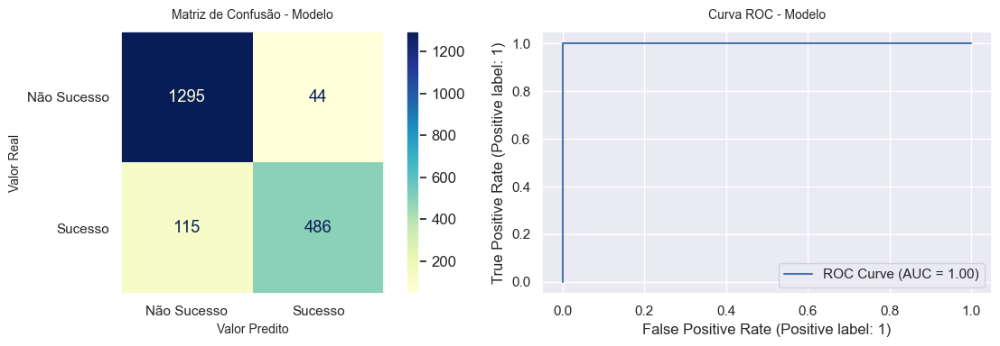

Acurácia: 91.8%
Precisão: 91.7%
Recall:   80.87%
F1-Score: 91.65%


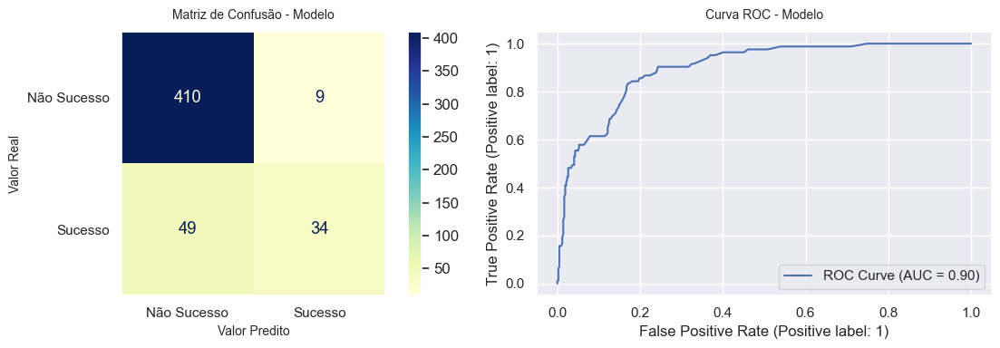

Acurácia: 88.45%
Precisão: 79.07%
Recall:   40.96%
F1-Score: 86.88%


In [191]:
# Define the Random Forest model
rf_cv = RandomForestClassifier(n_estimators=200, max_depth=None, bootstrap=False, min_samples_leaf=1, min_samples_split=2, random_state=42)

# Define the cross-validation strategy
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Get cross-validated predictions
y_pred_cv = cross_val_predict(rf_cv, X_train_final, y_train_final, cv=cv)


# Compute cross-validated scores
scores = cross_val_score(rf_cv, X_train_final, y_train_final, cv=cv, scoring='precision')
print(f"Cross-validated precision scores: {scores}")
print(f"Mean precision: {scores.mean()}")


# Fit the model to the whole training set (for ROC curve)
rf_cv.fit(X_train_final, y_train_final)

# Evaluate on the test set
y_pred_test = rf_cv.predict(X_test_validate)

# Cross-validated metrics on the training data
plot_metrics(y_train_final, y_pred_cv, rf_cv, X_train_final)

# Evaluation on the test data
plot_metrics(y_validate, y_pred_test, rf_cv, X_test_validate)

Cross-validated precision scores: [0.92405063 0.925      0.91358025 0.92682927 0.87058824]
Mean precision: 0.9120096766823547


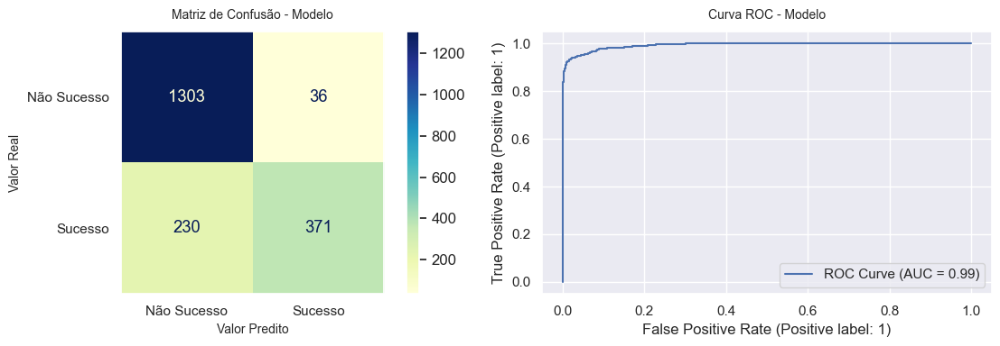

Acurácia: 86.29%
Precisão: 91.15%
Recall:   61.73%
F1-Score: 85.43%


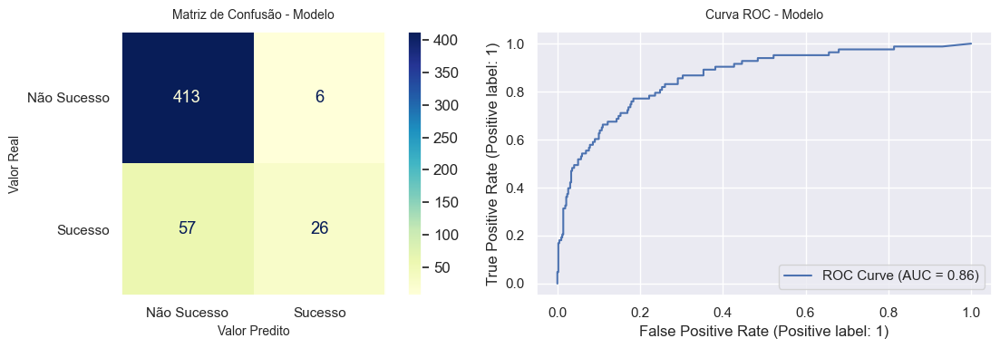

Acurácia: 87.45%
Precisão: 81.25%
Recall:   31.33%
F1-Score: 85.03%


In [192]:
# Define the XG Boost model
xgb_cv = XGBClassifier(learning_rate=0.01, max_depth=10, n_estimators=100, subsample=0.8, colsample_bytree=0.8, gamma=0.3, min_child_weight=1, reg_alpha=0.1, reg_lambda=1.5, random_state=42)

# Define the cross-validation strategy
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Get cross-validated predictions
y_pred_cv = cross_val_predict(xgb_cv, X_train_final, y_train_final, cv=cv)


# Compute cross-validated scores
scores = cross_val_score(xgb_cv, X_train_final, y_train_final, cv=cv, scoring='precision')
print(f"Cross-validated precision scores: {scores}")
print(f"Mean precision: {scores.mean()}")


# Fit the model to the whole training set (for ROC curve)
xgb_cv.fit(X_train_final, y_train_final)

# Evaluate on the test set
y_pred_test = xgb_cv.predict(X_test_validate)

# Cross-validated metrics on the training data
plot_metrics(y_train_final, y_pred_cv, xgb_cv, X_train_final)

# Evaluation on the test data
plot_metrics(y_validate, y_pred_test, xgb_cv, X_test_validate)

Cross-validated precision scores: [1.         0.57894737 1.         1.         0.54545455]
Mean precision: 0.8248803827751197


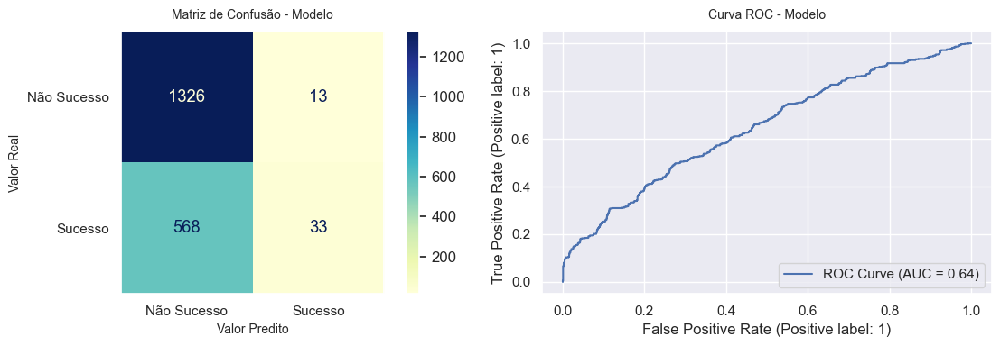

Acurácia: 70.05%
Precisão: 71.74%
Recall:   5.49%
F1-Score: 59.78%


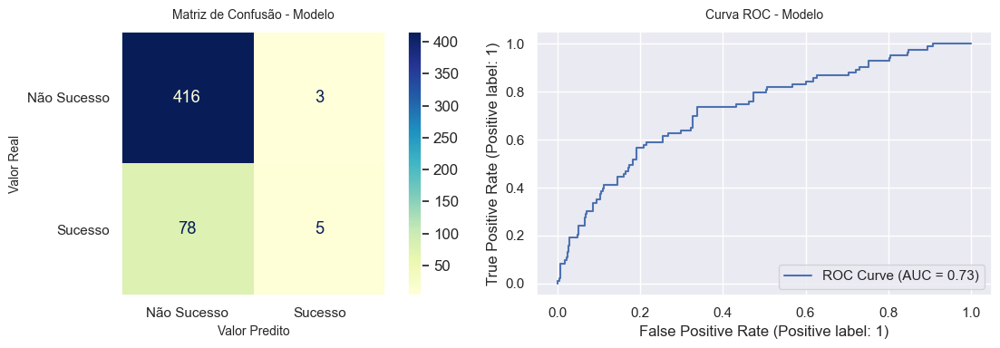

Acurácia: 83.86%
Precisão: 62.5%
Recall:   6.02%
F1-Score: 77.88%


In [193]:
# Define the SVM model
svm_cv = SVC(C=16, probability=True, random_state=42)

# Define the cross-validation strategy
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Get cross-validated predictions
y_pred_cv = cross_val_predict(svm_cv, X_train_final, y_train_final, cv=cv)


# Compute cross-validated scores
scores = cross_val_score(svm_cv, X_train_final, y_train_final, cv=cv, scoring='precision')
print(f"Cross-validated precision scores: {scores}")
print(f"Mean precision: {scores.mean()}")


# Fit the model to the whole training set (for ROC curve)
svm_cv.fit(X_train_final, y_train_final)

# Evaluate on the test set
y_pred_test = svm_cv.predict(X_test_validate)

# Cross-validated metrics on the training data
plot_metrics(y_train_final, y_pred_cv, svm_cv, X_train_final)

# Evaluation on the test data
plot_metrics(y_validate, y_pred_test, svm_cv, X_test_validate)

# Aplicando o Ensemble nos dados desconhecidos.

In [195]:
# Instanciando os modelos individualmente.
clf_rf = RandomForestClassifier(n_estimators=200, max_depth=None, bootstrap=False, min_samples_leaf=1, min_samples_split=2, random_state=42)
clf_xgb = XGBClassifier(learning_rate=0.01, max_depth=10, n_estimators=100, subsample=0.8, colsample_bytree=0.8, gamma=0.3, min_child_weight=1, reg_alpha=0.1, reg_lambda=1.5, random_state=42)

# Definindo os estimadores selecionados.
estimators = [('rf', clf_rf), ('modelXG', clf_xgb)]

# Criando a avaliação dos classificadores e treinando o modelo.
clf_avg = VotingClassifier(estimators= estimators, voting='soft')
clf_avg.fit(X_train_final, y_train_final)

# Testando e avaliando o desempenho do modelo.
acc_avg_new = accuracy_score(y_validate,  clf_avg.predict(X_test_validate))
pre_avg_new = precision_score(y_validate, clf_avg.predict(X_test_validate))
recl_avg_new = recall_score(y_validate, clf_avg.predict(X_test_validate))
f1_avg_new = f1_score(y_true=y_validate, y_pred=clf_avg.predict(X_test_validate), average="weighted")

print('Acurácia: {:.4f}'.format(acc_avg_new))
print('Precisão: {:.4f}'.format(pre_avg_new))
print('Recall:   {:.4f}'.format(recl_avg_new))
print('F1-Score: {:.4f}'.format(f1_avg_new))

Acurácia: 0.8825
Precisão: 0.8000
Recall:   0.3855
F1-Score: 0.8648


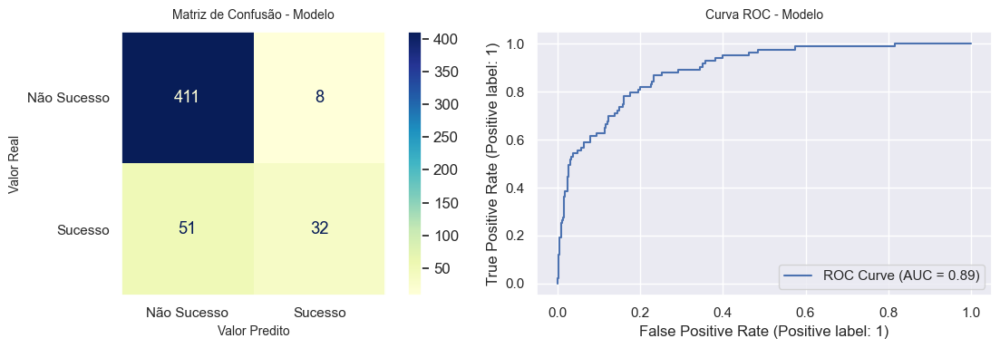

Acurácia: 88.25%
Precisão: 80.0%
Recall:   38.55%
F1-Score: 86.48%


In [196]:
# Call plot_metrics for the ensemble model
y_test_ensemble = y_validate
X_test_ensemble = X_test_validate
y_pred_ensemble = clf_avg.predict(X_test_ensemble)
plot_metrics(y_test_ensemble, y_pred_ensemble, clf_avg, X_test_ensemble)

In [197]:
estimators = [('rf', clf_rf), ('modelXG', clf_xgb)]

clf_vote = VotingClassifier(estimators=estimators)
clf_vote.fit(X_train_final, y_train_final)

clf_avg = VotingClassifier(estimators=estimators, voting='soft')
clf_avg.fit(X_train_final, y_train_final)

acc_vote = precision_score(y_validate, clf_vote.predict(X_test_validate))
acc_avg = precision_score(y_validate,  clf_avg.predict(X_test_validate))
print('Voting: {:.4f}, Averaging: {:.4f}'.format(acc_vote, acc_avg))

Voting: 0.8889, Averaging: 0.8000


# Vamos fazer Cross-Validation do modelo Ensemble.

Cross-validated precision scores: [0.93478261 0.90721649 0.93684211 0.91836735 0.89      ]
Mean precision: 0.9174417111485893


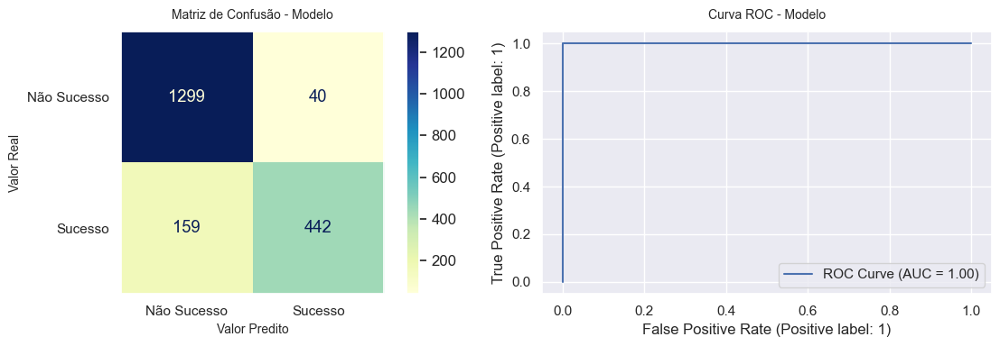

Acurácia: 89.74%
Precisão: 91.7%
Recall:   73.54%
F1-Score: 89.4%


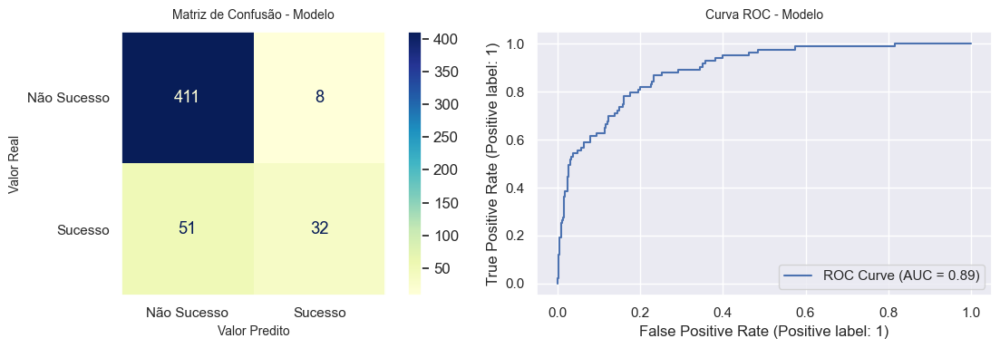

Acurácia: 88.25%
Precisão: 80.0%
Recall:   38.55%
F1-Score: 86.48%


In [363]:
# Define the individual models
clf_rf = RandomForestClassifier(n_estimators=200, max_depth=None, bootstrap=False, min_samples_leaf=1, min_samples_split=2, random_state=42)
clf_xgb = XGBClassifier(learning_rate=0.01, max_depth=10, n_estimators=100, subsample=0.8, colsample_bytree=0.8, gamma=0.3, min_child_weight=1, reg_alpha=0.1, reg_lambda=1.5, random_state=42)

# Definindo os estimadores selecionados.
estimators = [('rf', clf_rf), ('modelXG', clf_xgb)]
clf_avg_cv = VotingClassifier(estimators=estimators, voting='soft')

# Define the cross-validation strategy
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Get cross-validated predictions
y_pred_cv = cross_val_predict(clf_avg_cv, X_train_final, y_train_final, cv=cv)

# Compute cross-validated scores
scores = cross_val_score(clf_avg_cv, X_train_final, y_train_final, cv=cv, scoring='precision')
print(f"Cross-validated precision scores: {scores}")
print(f"Mean precision: {scores.mean()}")

# Fit the model to the whole training set (for ROC curve)
clf_avg_cv.fit(X_train_final, y_train_final)

# Evaluate on the test set
y_pred_test_cv = clf_avg_cv.predict(X_test_validate)

# Cross-validated metrics on the training data
plot_metrics(y_train_final, y_pred_cv, clf_avg_cv, X_train_final)

# Evaluation on the test data
plot_metrics(y_validate, y_pred_test_cv, clf_avg_cv, X_test_validate)

# Test and evaluate the model performance on the test set
acc_avg_new = accuracy_score(y_validate, y_pred_test_cv)
pre_avg_new = precision_score(y_validate, y_pred_test_cv)
recl_avg_new = recall_score(y_validate, y_pred_test_cv)
f1_avg_new = f1_score(y_true=y_validate, y_pred=y_pred_test_cv, average="weighted")

# Vamos fazer uma análise de PCA no Ensemble para entender se facilita para o modelo reduzir a dimensionalidade, apesar de dificultar a explicabilidade do resultado.

              precision    recall  f1-score   support

           0       0.87      0.99      0.92       352
           1       0.96      0.64      0.77       150

    accuracy                           0.88       502
   macro avg       0.91      0.81      0.85       502
weighted avg       0.89      0.88      0.88       502



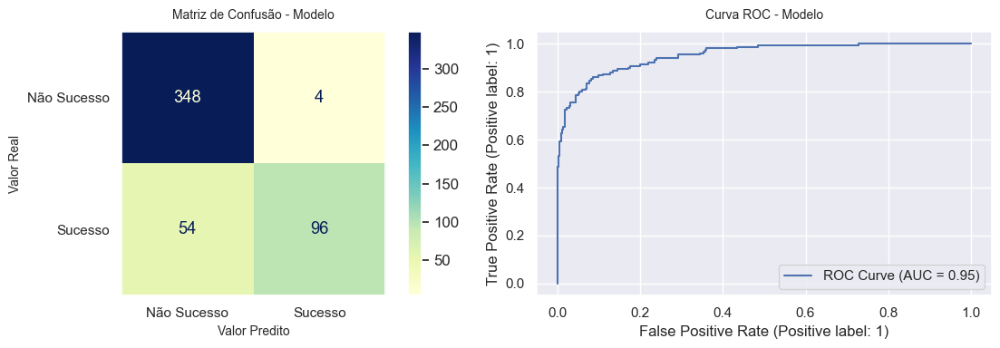

Acurácia: 88.45%
Precisão: 96.0%
Recall:   64.0%
F1-Score: 87.67%


In [201]:
# Escalar os dados
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train_final)

# Aplicar PCA
pca = PCA(n_components=0.95)  # Mantém 95% da variância
X_pca = pca.fit_transform(X_scaled)

# Dividir os dados em treino e teste
X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(X_pca, y_train_final, test_size=502, random_state=42)

# Treinar um modelo de classificação
# model = RandomForestClassifier(random_state=42)
clf_avg.fit(X_train_pca, y_train_pca)

# Fazer previsões e avaliar o modelo
y_pred_pca = clf_avg.predict(X_test_pca)
print(classification_report(y_test_pca, y_pred_pca))

# Aplicar a função de geração da matrix de confusão e curva ROC.
plot_metrics(y_test_pca, y_pred_pca, clf_avg, X_test_pca)

# Vamos aplicar a análise de PCA do Ensemble nos dados desconhecidos para entender sua efetividade e capacidade de generalização.

              precision    recall  f1-score   support

           0       0.94      1.00      0.97       419
           1       1.00      0.67      0.81        83

    accuracy                           0.95       502
   macro avg       0.97      0.84      0.89       502
weighted avg       0.95      0.95      0.94       502



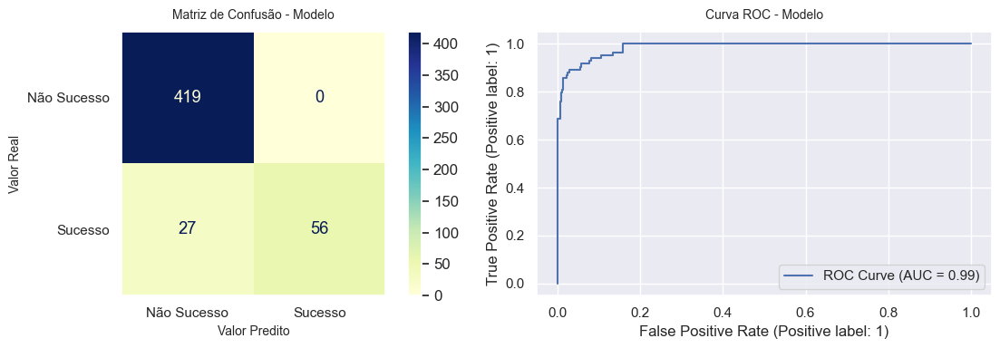

Acurácia: 94.62%
Precisão: 100.0%
Recall:   67.47%
F1-Score: 94.18%


In [374]:
# Passo 1: Escalar os dados de validação
X_validate_scaled = scaler.transform(X_test_validate)

# Passo 2: Aplicar a transformação PCA nos dados de validação
X_validate_pca = pca.transform(X_validate_scaled)

# Passo 3: Fazer previsões usando o modelo treinado
y_pred_validate = clf_avg.predict(X_validate_pca)

# (Opcional) Avaliar as previsões
print(classification_report(y_validate, y_pred_validate))

# Aplicar a função de geração da matriz de confusão e curva ROC para o conjunto de validação
plot_metrics(y_validate, y_pred_validate, clf_avg, X_validate_pca)

# Vamos verificar quais as variáveis de maior influência nos resultados do modelo PCA.

In [395]:
# Definir a coluna de referência para identificar as colunas de TF-IDF
coluna_de_referencia = 'grupo_industria_principal__Travel and Tourism'
indice = X_test_validate.columns.get_loc(coluna_de_referencia)

# Selecionar todas as colunas antes de 'grupo_industria_principal__Travel and Tourism'
X_train_filtered = X_test_validate.iloc[:, :indice]

# Escalar os dados
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train_filtered)

# Aplicar PCA
pca = PCA(n_components=0.95)  # Mantém 80% da variância
X_pca = pca.fit_transform(X_scaled)

# Obter os loadings (pesos) das features originais nos componentes principais
loadings = pca.components_

# Calcular a importância das features somando os valores absolutos dos loadings ao longo dos componentes principais
feature_importance = loadings.sum(axis=0)

# Criar um DataFrame para facilitar a visualização
importance_df = pd.DataFrame({
    'Feature': X_train_filtered.columns,
    'Importância': abs(feature_importance)
})

# Agrupar as features dummies (se aplicável)
importance_df['Variável Original'] = importance_df['Feature'].str.split('__').str[0]

# Identificar as colunas de TF-IDF
descricao_tokens = importance_df.loc[indice:, 'Feature']

# Calcular a importância agregada das colunas de TF-IDF
descricao_importance = importance_df.loc[indice:, 'Importância'].sum()

# Adicionar a importância agregada de 'descricao_modelagem' ao DataFrame de importância
new_row = pd.DataFrame({
    'Variável Original': ['descricao_modelagem'],
    'Importância': [descricao_importance]
})

# Combinar com o DataFrame agrupado das variáveis dummy
grouped_importance_df = pd.concat([importance_df.groupby('Variável Original').agg({'Importância': 'sum'}).reset_index(), new_row], ignore_index=True)

# Ordenar as features pela importância e selecionar as 10 mais importantes
top_10_features = grouped_importance_df.sort_values(by='Importância', ascending=False).head(10)

# Adicionar uma linha em branco após o cabeçalho (manualmente)
formatted_table = top_10_features.to_string(index=False, header=True)
formatted_table = formatted_table.replace('\n', '\n\n', 1)

print("Top 10 variáveis mais importantes para o Ensemble com PCA:")
print("")
print(formatted_table)

# Opcional: Salvar as 10 features mais importantes em um arquivo CSV
# top_10_features.to_csv('top_10_pca_features_grouped.csv', index=False)


Top 10 variáveis mais importantes para o Ensemble com PCA:

        Variável Original  Importância

      industria_principal       103.65
              localizacao        78.54
grupo_industria_principal        25.55
       faixa_funcionarios         3.75
                 fundador         3.26
            fundador_univ         3.05
               investidor         2.88
     estagio_investimento         2.16
      numero_investidores         1.23
        numero_industrias         1.21


# Vamos identificar as Startups com maior potencial de sucesso.

# Vamos verificar a probabilidade de sucesso de cada startup, criando uma função e aplicando ao modelo.

In [382]:
def plot_probability_distributions(y_test, y_proba):
    # Convert probabilities to a DataFrame for easy plotting
    import pandas as pd
    prob_df = pd.DataFrame(y_proba, columns=['Class 0 Probability', 'Class 1 Probability'])
    prob_df['Actual'] = y_test

    # Plot histograms of probabilities for each class
    plt.figure(figsize=(12, 6))
    sns.histplot(data=prob_df, x='Class 0 Probability', hue='Actual', multiple='stack', bins=30, palette='viridis')
    plt.title('Probability Distribution for Class 0')
    plt.xlabel('Probability')
    plt.ylabel('Frequency')
    plt.show()

    plt.figure(figsize=(12, 6))
    sns.histplot(data=prob_df, x='Class 1 Probability', hue='Actual', multiple='stack', bins=30, palette='viridis')
    plt.title('Probability Distribution for Class 1')
    plt.xlabel('Probability')
    plt.ylabel('Frequency')
    plt.show()

def print_probability_statistics(y_proba):
    print(f"Mean probability for Class 0: {np.mean(y_proba[:, 0]):.4f}")
    print(f"Mean probability for Class 1: {np.mean(y_proba[:, 1]):.4f}")
    print(f"Standard deviation for Class 0: {np.std(y_proba[:, 0]):.4f}")
    print(f"Standard deviation for Class 1: {np.std(y_proba[:, 1]):.4f}")

def display_sample_probabilities(y_test, y_proba, sample_size=10):
    import pandas as pd
    prob_df = pd.DataFrame(y_proba, columns=['Class 0 Probability', 'Class 1 Probability'])
    prob_df['Actual'] = y_test
    sample_df = prob_df.sample(sample_size, random_state=42)
    
    print(sample_df.head(sample_size))

def plot_calibration_curve(y_test, y_proba):
    prob_true, prob_pred = calibration_curve(y_test, y_proba[:, 1], n_bins=10)
    
    plt.figure(figsize=(8, 6))
    plt.plot(prob_pred, prob_true, marker='o', label='Calibration Curve')
    plt.plot([0, 1], [0, 1], 'k--', label='Perfectly Calibrated')
    plt.xlabel('Mean Predicted Probability')
    plt.ylabel('Fraction of Positives')
    plt.title('Calibration Curve')
    plt.legend()
    plt.show()

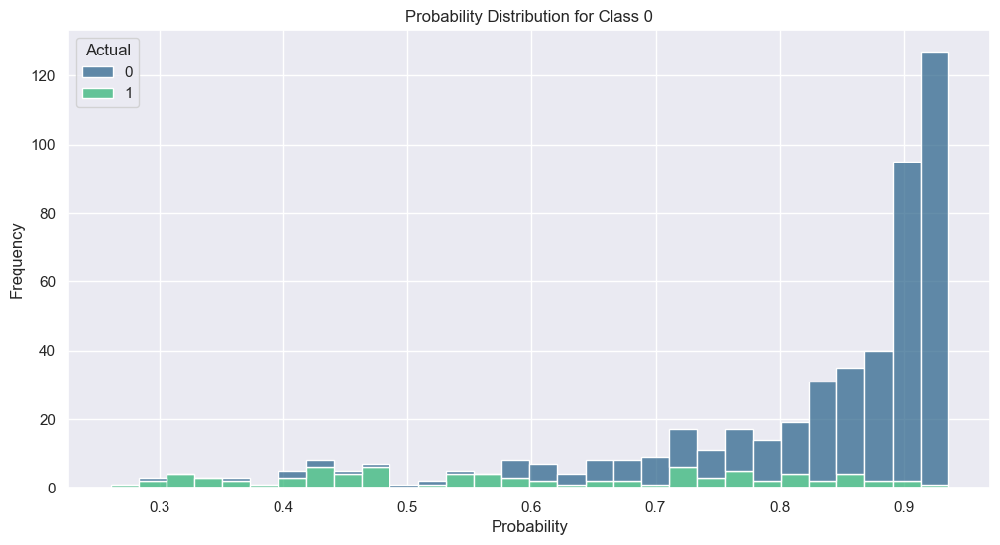

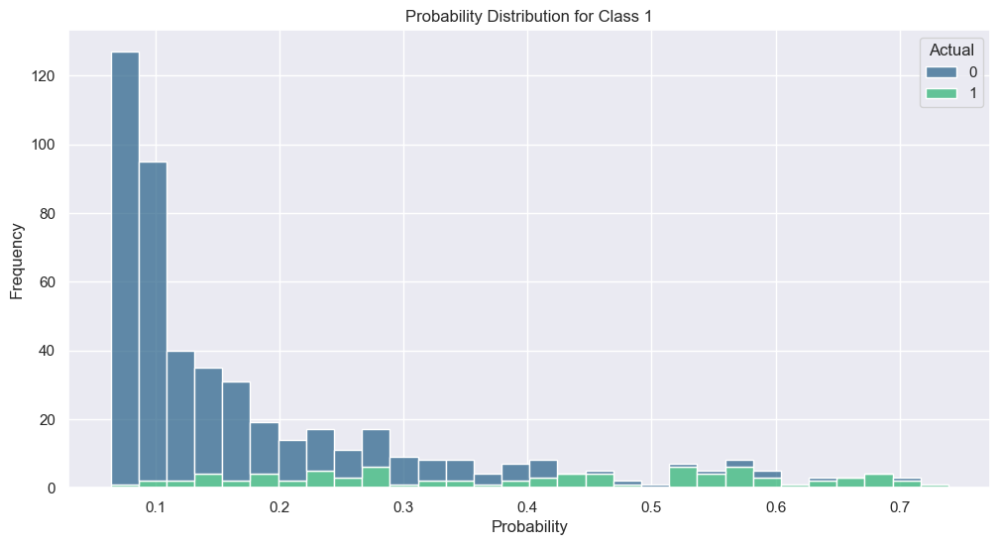

In [383]:
# Predict the probabilities for each tested startup
y_proba_final = clf_avg_cv.predict_proba(X_test_validate)  # Get predicted probabilities

# Plot probability distributions
plot_probability_distributions(y_validate, y_proba_final)

In [386]:
# Print probability statistics
print_probability_statistics(y_proba_final)


Mean probability for Class 0: 0.8071
Mean probability for Class 1: 0.1929
Standard deviation for Class 0: 0.1549
Standard deviation for Class 1: 0.1549


In [388]:
# Display sample probabilities
display_sample_probabilities(y_validate, y_proba_final)

     Class 0 Probability  Class 1 Probability  Actual
268                 0.47                 0.53       1
73                  0.87                 0.13       0
289                 0.93                 0.07       0
155                 0.92                 0.08       0
104                 0.91                 0.09       0
280                 0.83                 0.17       0
392                 0.93                 0.07       0
124                 0.73                 0.27       0
68                  0.65                 0.35       0
244                 0.77                 0.23       0


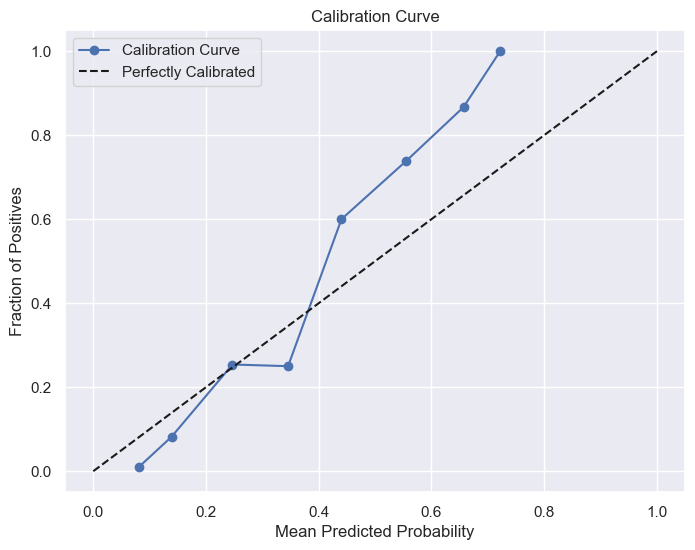

In [390]:
# Plot calibration curve
plot_calibration_curve(y_validate, y_proba_final)

In [392]:
# Assume X_test_validate is a DataFrame
X_test_df = pd.DataFrame(X_test_validate, columns=['ID_empresa'])  # Adjust feature names accordingly

# Create a DataFrame with the test features and predicted probabilities
results_df = X_test_df.copy()
results_df['Probabilidade de Sucesso'] = y_proba_final[:, 1]
results_df['Classe Predita'] = clf_avg_cv.predict(X_test_validate)  # Optional: Add predicted classes

# Filter for rows where the probability of class 1 is greater than 70%
filtered_df = results_df[results_df['Probabilidade de Sucesso'] > 0.6]
# Merge the filtered DataFrame with the dataset_ids DataFrame to get the names of the startups
final_df = pd.merge(filtered_df, dataset_ids, on='ID_empresa', how='left')

# Sort by 'Probabilidade de Sucesso' in descending order
final_df = final_df.sort_values(by='Probabilidade de Sucesso', ascending=False).head(10)

# Format the 'Probabilidade de Sucesso' column as percentages with two decimal places
final_df['Probabilidade de Sucesso'] = final_df['Probabilidade de Sucesso'].apply(lambda x: f"{x*100:.2f}%")

# Usar tabulate para criar uma tabela formatada
table = tabulate(final_df[['ID_empresa', 'nome_empresa', 'Probabilidade de Sucesso']], headers="keys", tablefmt="plain", showindex=False, numalign="center", stralign="center")

# Adicionar uma linha em branco após o cabeçalho
lines = table.splitlines()
header = lines[0]  # Cabeçalho
body = lines[1:]   # Corpo da tabela

# Montar a tabela com uma linha em branco após o cabeçalho
table_with_blank_line = f"{header}\n\n" + "\n".join(body)

# Exibir a tabela
print(table_with_blank_line)

# Optionally, save the final DataFrame to a CSV file
# final_df.to_csv('high_probability_startups.csv', index=False)

 ID_empresa      nome_empresa      Probabilidade de Sucesso

   100080           Sallve                  73.92%
   100023           Flash                   70.45%
   100057          tembici.                 69.77%
   100003            Neon                   69.67%
   100101       Remessa Online              69.35%
   100219          Creditas                 69.21%
   100098            a55                    67.96%
   100062           Osana                   67.41%
   100239          MarketUP                 67.07%
   100104     Ambar Technologies            65.93%
